# **====== STAGE 2 ======**
`Stage 2 (Data PreProcessing)`

# **🏝 Data Cleansing/Preprocessing 🏝**

## **📌 Import Libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as pyoff

from datetime import datetime

from scipy.stats import skew
from scipy.stats import kurtosis

# Ignores any warning
# import warnings 
# warnings.filterwarnings("ignore")

sns.set(rc={'figure.figsize':(15, 8)})
sns.set_style("whitegrid")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
# pd.set_option('float_format', '{:f}'.format)

# from matplotlib import rcParams
# rcParams['figure.figsize'] = 12, 4
# rcParams['lines.linewidth'] = 3
# rcParams['xtick.labelsize'] = 'x-large'
# rcParams['ytick.labelsize'] = 'x-large'

import matplotlib as mp
%matplotlib inline
import textwrap
import matplotlib.ticker as mticker
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec

## **📌 Import  Raw Datasets**

In [2]:
# missing_values = ['n/a', 'na', 'nan', '-', '--', 'null', 'Null', ' ', '-1', -1]
# source = 'https://raw.githubusercontent.com/nurimammasri/Marketing-Campaign-Model-Prediction-by-Datalicious/main/data/marketing_campaign.csv'
source = 'data/marketing_campaign.csv'
# df = pd.read_csv(source, na_values = missing_values)
df = pd.read_csv(source, sep=";")
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [3]:
cat_cols = ['ID', 'Education', 'Marital_Status', 'AcceptedCmp1', 
            'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 
            'AcceptedCmp5', 'Complain', 'Response']
            
num_cols = ['Year_Birth', 'Income', 'Kidhome', 'Teenhome', 
            'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
            'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
            'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
            'NumStorePurchases', 'NumWebVisitsMonth', 'Z_CostContact', 'Z_Revenue']

timestamp = ["Dt_Customer"]

## **📌 Handling Missing Value**

Melakukan pengecekan jumlah Missing Values dan Persentase nya

In [4]:
print('Missing values status:', df.isnull().values.any())
nvc = pd.DataFrame(df.isnull().sum().sort_values(), columns=['Total Null Values'])
nvc['Percentage'] = (nvc['Total Null Values']/df.shape[0])*100
nvc["Data Type"] = [df[col].dtype for col in df.columns]
nvc.sort_values(by=["Total Null Values", "Percentage"], ascending=False, inplace=True)
print(nvc)

Missing values status: True
                     Total Null Values  Percentage Data Type
Income                              24    1.071429     int64
ID                                   0    0.000000     int64
Z_CostContact                        0    0.000000     int64
Complain                             0    0.000000    object
AcceptedCmp2                         0    0.000000    object
AcceptedCmp1                         0    0.000000   float64
AcceptedCmp5                         0    0.000000     int64
AcceptedCmp4                         0    0.000000     int64
AcceptedCmp3                         0    0.000000    object
NumWebVisitsMonth                    0    0.000000     int64
NumStorePurchases                    0    0.000000     int64
NumCatalogPurchases                  0    0.000000     int64
NumWebPurchases                      0    0.000000     int64
NumDealsPurchases                    0    0.000000     int64
Z_Revenue                            0    0.000000     in

Berdasarkan hasil analisa awal, dapat diketahui bahwa terdapat data kosong pada kolom income sebanyak 24 baris dengan persentase sebesar 1,07% dari keseluruhan data.

Pada proses handling missing values untuk kolom `Income` ada beberapa metode yang dapat di lakukan :
- **Drop Rows Missing Values**
- **Imputation Median**
    - `Fillna` or `SimpleImputer`
- **Multivariate Approach**
    - Perlu dipastikan untuk data yang dimiliki semuanya dalam bentuk tipe numerical (tidak ada bertipe obeject/string maupun datetime)
    - Kita juga drop kolom yang tidak penting seperti data tanggal `Dt_Customer`
    - Metode :
        - `KNNImputer` or K-Nearest Neighbor
        - `MICE` or Multiple Imputation by Chained Equation     
            - Imputation using MICE with `IterativeImputer`
            - Imputation using MICE with `LightGBM`
            
**Choice Determination:**

- Pada proses handling missing values ini kita menggunakan `Imputation using MICE with LightGBM`

### **Drop Rows**

karena data yang kita miliki terbatas maka untuk proses ini tidak akan kita gunakan

In [5]:
# print("Jumlah rows sebelum drop missing values =", df.shape[0])
# df = df.dropna(subset=['Income'])
# print("Jumlah rows setelah drop missing values =", df.shape[0])
# df.isna().sum()

**Pros**
- Straightforward and simple to use.
- Beneficial when missing values have no importance. 

**Cons**
- Using this approach can lead to information loss, which can introduce bias to the final dataset.
- Data set with a large proportion of missing value can be significantly decreased, which can impact the result of all statistical analysis on that data set. 

### **Imputation**

Imputation (Median), karena Highly Positively Skewed

In [6]:
# print("Jumlah missing values Income sebelum Imputation =", df["Income"].isna().sum())

Imputation using `fillna`

In [7]:
# df['Income'].fillna(df['Income'].median(), inplace=True)
# df.isna().sum()

Imputation using `SimpleImputer`

In [8]:
# from sklearn.impute import SimpleImputer

# imputer = SimpleImputer(missing_values=np.nan, strategy='median')
# df["Income"] = imputer.fit_transform(df[["Income"]])
# df["Income"].isna().sum()

In [9]:
# print("Jumlah missing values Income setelah Imputation =", df["Income"].isna().sum())

**Pros**
- Simplicity and ease of implementation are some of the benefits of the mean and median imputation.
- The imputation is performed using the existing information from the non-missing data; hence no additional data is required.
- Mean and median imputation can provide a good estimate of the missing values, respectively for normally distributed data, and skewed data.

**Cons**
- We cannot apply these two strategies to categorical columns. They can only work for numerical ones.
- Mean imputation is sensitive to outliers and may not be a good representation of the central tendency of the data. Similarly to the mean, the median also may not better represent the central tendency.

### **Multivariate Approach**

Multivariate Approach (MICE Imputation, KNN Imputer, dll)

Multiple imputations compensate for missing data and produce multiple datasets by regression model and are considered the solver of the old problem of univariate imputation. The univariate imputes data only from a specific column where the data cell was missing. Multivariate imputation works simultaneously, with all variables in all columns, whether missing or observed. It has emerged as a principal method of solving missing data problems. All incomplete datasets analyzed before Multiple Imputation by Chained Equations (MICE) presented were misdiagnosed; results obtained were invalid and should not be countable to yield reasonable conclusions.

In multiple imputations, following a typical model tends to preserve variances, means, covariance, linear regression coefficients, and correlation. MI, therefore, was designed to restore variability that is lost during single imputation and consequently correct it. Rounding procedures included increasing the variability of imputed values.

Multiple imputations help to ensure that the missing data is uncertain by generating various reasonable imputed data sets and integrating findings from each of them properly. Multiple imputations employ the imputation, analysis, and pooling processes

The advantages of multiple imputation are : 
- Results in unbiased estimates, providing more validity than ad hoc approaches to missing data
- Uses all available data, preserving sample size and statistical power

**Pros**
- Multiple imputation is powerful at dealing with missing data in multiple variables and multiple data types. 
- The approach can produce much better results than mean and median imputations. 
- Many other algorithms, such as K-Nearest Neighbors, Random forest, and neural networks, can be used as the backbone of the multiple imputation prediction for making predictions.  

**Cons**
- Multiple imputation assumes that the data is missing at random (MAR).
- Despite all the benefits, this approach can be computationally expensive compared to other techniques, especially when working with large datasets. 
- This approach requires more effort than the previous ones.

Dikarenakan pada proses multivariate approach memerlukan semua feature bertipe numerical sehingga untuk data yang masih bertipe object/string dan date akan di drop pada data temp

In [10]:
df_ma = df.copy()

In [11]:
drop = ["ID", "Education", "Marital_Status", "Dt_Customer"]
df_ma = df_ma.drop(drop, axis=1)

In [12]:
df_ma.head()

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,1954,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,1965,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,1984,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,1981,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


#### **Implementation Multivariate Approach**

**Two main methods we use here to impute missing values**

- `KNN Imputer` or K-Nearest Neighbor
- `MICE` or Multiple Imputation by Chained Equation

Here, Multiple imputations are performed using `sklearn` and `fancyimpute`.

**To install fancyimpute**

`pip install fancyimpute`

#### **Imputation using `KNNImputer`**

In [13]:
# print("Jumlah missing values Income sebelum Imputation =", df["Income"].isna().sum())

In [14]:
# from sklearn.impute import KNNImputer

# knn_imputer = KNNImputer(n_neighbors=5)
# df_imputed = pd.DataFrame(
#     knn_imputer.fit_transform(df_ma),
#     columns=df_ma.columns
# )
# df["Income"] = df_imputed["Income"].copy()
# df.head()

In [15]:
# from fancyimpute import KNN

# knn_imputer = KNN()
# df_imputed = pd.DataFrame(
#     knn_imputer.fit_transform(df_ma),
#     columns=df_ma.columns
# )
# df["Income"] = df_imputed["Income"].copy()
# df.head()

In [16]:
# print("Jumlah missing values Income setelah Imputation =", df["Income"].isna().sum())

#### **Imputation using `MICE` with `IterativeImputer`**

MICE Imputation, short for ‘Multiple Imputation by Chained Equation’ is an advanced missing data imputation technique that uses multiple iterations of Machine Learning model training to predict the missing values using known values from other features in the data as predictors.

In [17]:
# print("Jumlah missing values Income sebelum Imputation =", df["Income"].isna().sum())

In [18]:
# # Note: make sure to import the enable_iterative_imputer function before 
# # you import the IterativeImputer, as the feature is classified as 
# # experimental, and failing to do so will result in an ImportError.
# from sklearn.experimental import enable_iterative_imputer
# from sklearn.impute import IterativeImputer
# imputer = IterativeImputer(max_iter=10, random_state=0)
# df_imputed = pd.DataFrame(
#     imputer.fit_transform(df_ma),
#     columns=df_ma.columns
# )

# df["Income"] = df_imputed["Income"].copy()
# df.head()

In [19]:
# from fancyimpute import IterativeImputer
# mice_imputer = IterativeImputer()
# # filling the missing value with mice imputer
# df_imputed = pd.DataFrame(
#     mice_imputer.fit_transform(df_ma),
#     columns=df_ma.columns
# )

# df["Income"] = df_imputed["Income"].copy()
# df.head()

In [20]:
# print("Jumlah missing values Income setelah Imputation =", df["Income"].isna().sum())

#### **Imputation using `MICE` with `LightGBM`**

MICE imputation can be made more efficient using the `miceforest` package. It is expected to perform significantly better because it implements `lightgbm` algorithm in the backend to do the imputation.

This package can be installed using either pip or conda, through conda-forge:

- Using pip 

    `pip install miceforest --no-cache-dir`

- Using conda

    `conda install -c conda-forge miceforest`

In [21]:
print("Jumlah missing values Income sebelum Imputation =", df["Income"].isna().sum())

Jumlah missing values Income sebelum Imputation = 24


In [22]:
import miceforest as mf

# Create kernel. 
kds = mf.ImputationKernel(
  df_ma,
  save_all_iterations=True,
  random_state=100
)

# Run the MICE algorithm
kds.mice(iterations=5, n_estimators=50)

# Return the completed dataset.
df_imputed = kds.complete_data()
df["Income"] = df_imputed["Income"].copy()
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [23]:
print("Jumlah missing values Income setelah Imputation =", df["Income"].isna().sum())

Jumlah missing values Income setelah Imputation = 0


### **Kesimpulan**

Berdasarkan hasil pengecekan, Untuk kolom `Income` terdapat missing values 24 rows (1,07%). Dikarenakan data kita terbatas, sehingga untuk prosesnya kita tidak akan melakukan penghapusan baris (Drop Rows), melainkan dilakukan proses Imputation. 

Pada proses handling missing values ini kita menggunakan `Imputation using MICE with LightGBM`. Imputasi MICE (Multiple Imputasi by Chained Equation) dapat lebih efisien karena menggunakan beberapa iterasi pelatihan model Machine Learning dan menggunakan data yang tersedia di fitur lain untuk memperkirakan nilai dari missing values yang diperhitungkan oleh karena itu diharapkan kinerjanya jauh lebih baik. Selain itu, Imputasi MICE dapat lebih efisien menggunakan `miceforest` karena diharapkan kinerjanya jauh lebih baik karena mengimplementasikan algortima `lightgbm` di backend untuk melakukan imputasi. `LightGBM` dikenal dengan akurasi prediksi yang tinggi. Menggabungkannya dengan algortima `mice` menjadikannya algortima yang kuat untuk imputasi.

## **📌 Handling Duplicate Rows**

In [24]:
df[df.duplicated(keep=False)].sort_values(by=list(df.columns.values))

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response


In [25]:
df.duplicated().sum()

0

In [26]:
print(f"Data Frame Dimension Before Duplicate Removal: {df.shape}")
df = df.drop_duplicates().reset_index(drop=True)
print(f"Data Frame Dimension After Duplicate Removal: {df.shape}")

Data Frame Dimension Before Duplicate Removal: (2240, 29)
Data Frame Dimension After Duplicate Removal: (2240, 29)


In [27]:
df.duplicated(subset=["ID"]).sum()

0

### **Kesimpulan**

- Berdasarkan hasil pengecekan, tidak ditemui baris data yang memiliki duplikat. Sehingga kami tidak perlu melakukan handling duplicated data
- Pada pengecekan duplikat subset untuk ID tidak ditemukan ada nya ID customer yang sama

## **📌 Handling Invalid Values**

Mengecek isi unique values dari data

In [28]:
for x in df.columns : 
    unq = list(df[x].unique())
    sorted(unq)
    
    print (f'===== {x} =====')
    if len(unq) >= 10:
        unq = list(unq[:10])+['.....']
        print (f'{unq}')
    else:
        print (f'{unq}')
    print()

===== ID =====
[5524, 2174, 4141, 6182, 5324, 7446, 965, 6177, 4855, 5899, '.....']

===== Year_Birth =====
[1957, 1954, 1965, 1984, 1981, 1967, 1971, 1985, 1974, 1950, '.....']

===== Education =====
['Graduation', 'PhD', 'Master', 'Basic', '2n Cycle']

===== Marital_Status =====
['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone', 'Absurd', 'YOLO']

===== Income =====
[58138.0, 46344.0, 71613.0, 26646.0, 58293.0, 62513.0, 55635.0, 33454.0, 30351.0, 5648.0, '.....']

===== Kidhome =====
[0, 1, 2]

===== Teenhome =====
[0, 1, 2]

===== Dt_Customer =====
['2012-09-04', '2014-03-08', '2013-08-21', '2014-02-10', '2014-01-19', '2013-09-09', '2012-11-13', '2013-05-08', '2013-06-06', '2014-03-13', '.....']

===== Recency =====
[58, 38, 26, 94, 16, 34, 32, 19, 68, 11, '.....']

===== MntWines =====
[635, 11, 426, 173, 520, 235, 76, 14, 28, 5, '.....']

===== MntFruits =====
[88, 1, 49, 4, 43, 42, 65, 10, 0, 5, '.....']

===== MntMeatProducts =====
[546, 6, 127, 20, 118, 98, 164, 56

### **1. Melakukan konversi data `Date`**

Untuk mempermudah dalam proses feature extraction/engineering maka untuk data yang mengandung datetime akan dilakukan konversi ke format datetime pandas

In [29]:
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"])

### **2. Melakukan penyederhanaan `Marital_Status`**

Akan dilakukan replace data / menyatukan yang memiliki arti yang sama agar mengurangi jumlah dimensi maupun redudansi pada data

- Mengganti kategori `Widow`, `Alone`, `Absurd`, `YOLO` menjadi `Single`
- Mengganti kategori `Together` menjadi `Married`
- Mempertahankan kategori `Divorced`

In [30]:
# Mengganti kategori 'Widow', 'Alone', 'Absurd', 'YOLO' menjadi 'Single'
df['Marital_Status'] = df['Marital_Status'].replace(['Widow', 'Alone', 'Absurd', 'YOLO'],'Single')
# Mengganti kategori 'Together' menjadi 'Married'
df['Marital_Status'] = df['Marital_Status'].replace(['Together'],'Married')

In [31]:
df['Marital_Status'].unique()

array(['Single', 'Married', 'Divorced'], dtype=object)

### **3. Melakukan penyederhanaan `Education_Simple`**

Untuk kategori `2n Cycle` dan `Master` juga kurang lebih sama. Maka dari itu, baris yang memiliki kategori `2n Cycle` akan dihapus dan digantikan dengan kategori `Master`.

In [32]:
# Levels : Basic - Graduation - 2n Cycle - Master - PhD
df['Education'] = df['Education'].replace(['2n Cycle'],'Master')

In [33]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Married,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Married,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


### **Kesimpulan**
Berdasarkan hasil pengecekan, Untuk kolom `Dt_Customer` sebelumnya masih berbentuk string/object, untuk tipe datanya kurang sesuai sehingga di ubah menjadi Datetime untuk diolah pada tahap Feature Engineering. Kemudian pada `Marital_Status` dan `Education` replace data / menyatukan yang memiliki arti yang sama agar mengurangi jumlah dimensi maupun redudansi pada data.

## **📌 Handling Outliers**

Mengecek Outlier pada tiap columns

In [34]:
print(f'Jumlah baris: {len(df)}')

outlier = []
no_outlier = []
is_outlier = []
low_lim = []
high_lim = []

filtered_entries = np.array([True] * len(df))
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    low_limit = Q1 - (IQR * 1.5)
    high_limit = Q3 + (IQR * 1.5)

    filter_outlier = ((df[col] >= low_limit) & (df[col] <= high_limit))
    outlier.append(len(df[~filter_outlier]))
    no_outlier.append(len(df[filter_outlier]))
    is_outlier.append(df[col][~filter_outlier].any())
    low_lim.append(low_limit)
    high_lim.append(high_limit)

    filtered_entries = ((df[col] >= low_limit) & (df[col] <= high_limit)) & filtered_entries

print("Outlier All Data :", len(df[~filtered_entries]))
print("Not Outlier All Data :", len(df[filtered_entries]))
print()

pd.DataFrame({
    "Column Name":num_cols,
    "is Outlier": is_outlier,
    "Lower Limit": low_lim,
    "Upper Limit": high_lim,
    "Outlier":outlier,
    "No Outlier":no_outlier
})

Jumlah baris: 2240
Outlier All Data : 706
Not Outlier All Data : 1534



,Column Name,is Outlier,Lower Limit,Upper Limit,Outlier,No Outlier
0,Year_Birth,True,1932.0,2004.0,3,2237
1,Income,True,-14473.0,118263.0,9,2231
2,Kidhome,False,-1.5,2.5,0,2240
3,Teenhome,False,-1.5,2.5,0,2240
4,Recency,False,-51.0,149.0,0,2240
5,MntWines,True,-697.0,1225.0,35,2205
6,MntFruits,True,-47.0,81.0,227,2013
7,MntMeatProducts,True,-308.0,556.0,175,2065
8,MntFishProducts,True,-67.5,120.5,223,2017
9,MntSweetProducts,True,-47.0,81.0,248,1992


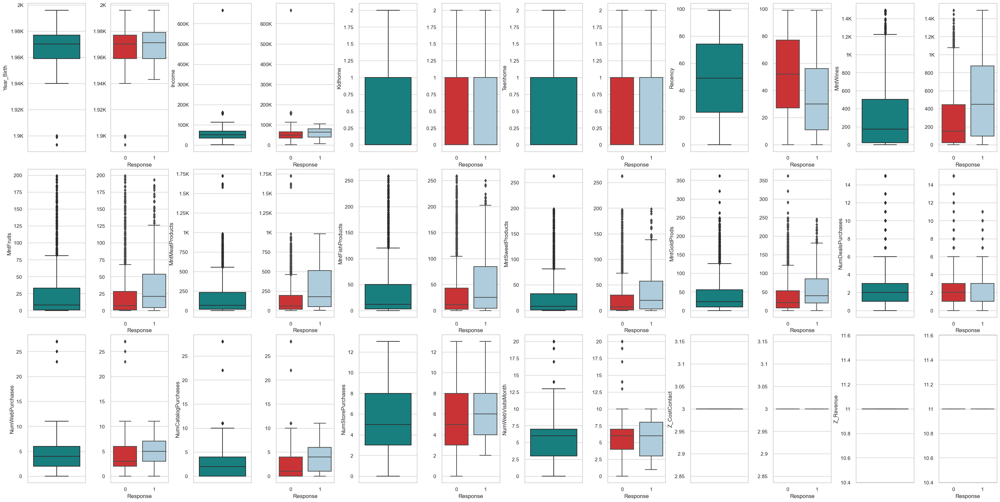

In [35]:
from math import log10, floor
def format_func(value, tick_number=None):
    num_thousands = 0 if abs(value) < 1000 else floor (log10(abs(value))/3)
    value = round(value / 1000**num_thousands, 2)
    return f'{value:g}'+' KMGTPEZY'[num_thousands]

plt.figure(figsize=(30, 15))
n = 3
j = 0

colors=["#e31a1c", "#a6cee3"]

for i in range(0, len(num_cols)*2, 2):
    ax1 = plt.subplot(n, math.ceil(len(num_cols)*2/n), i+1)
    sns.boxplot(y=df[num_cols[j]], color='#088F8F', orient='v')
    
    ax2 = plt.subplot(n, math.ceil(len(num_cols)*2/n), i+2, sharey=ax1)
    sns.boxplot(x=df["Response"], y=df[num_cols[j]], orient='v', palette=colors)
    
    ax2.yaxis.set_major_formatter(plt.FuncFormatter(format_func))
    
    ax2.set_ylabel(None)
    
    plt.tight_layout(pad=0.1)
    
    j+=1

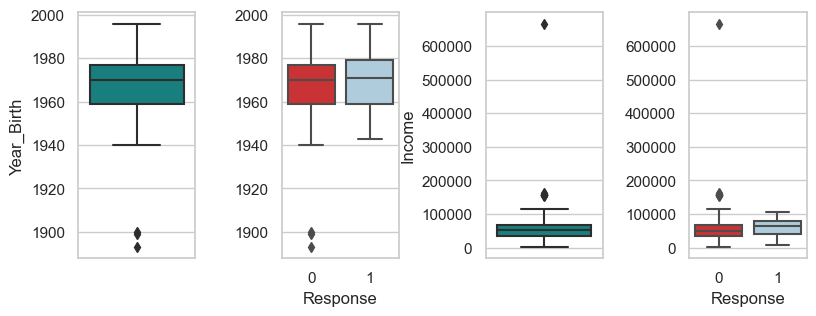

In [36]:
cols = ["Year_Birth","Income"]

plt.figure(figsize=(8, 3))
n = 1
j = 0

colors=["#e31a1c", "#a6cee3"]

for i in range(0, len(cols)*2, 2):
    ax1 = plt.subplot(n, math.ceil(len(cols)*2/n), i+1)
    sns.boxplot(y=df[cols[j]], color='#088F8F', orient='v')
    
    ax2 = plt.subplot(n, math.ceil(len(cols)*2/n), i+2, sharey=ax1)
    sns.boxplot(x=df["Response"], y=df[cols[j]], orient='v', palette=colors)
    
    ax2.set_ylabel(None)
    
    plt.tight_layout(pad=0.1)
    
    j+=1

In [37]:
df[["Year_Birth", "Income"]].describe()

,Year_Birth,Income
count,2240.000000,2240.000000
mean,1968.805804,52280.630804
std,11.984069,25212.272789
min,1893.000000,1730.000000
25%,1959.000000,35303.000000
50%,1970.000000,51342.000000
75%,1977.000000,68487.000000
max,1996.000000,666666.000000


Karena pada kolom `Year_Birth` memiliki nilai min yang sangat jauh di tahun `1893-1900`

dan `Income` memiliki nilai max yang sangat tinggi sebesar `$666.666`

Maka akan dilakukan Penghapusan rows pada nilai ini agar tidak ada ketimpangan nilai. Ada beberapa metode yang dapat kita lakukan :
- **Handling Oulier**
    - IQR (Interquartile Range)
    - Z-Score
- **Manually Trimmed**

**Choice Determination:**

- Untuk kasus saat ini, akan digunakan metode `Manually Trimmed`, agar menghindari penghapusan data yang terlalu banyak jika menggunakan Handling Outlier
- Adapaun pada kolom lainnya `selain Year_Birth dan Income` yang terdapat outlier tidak kita handle karena akan melalui proses `Normal Distribution Transformation` nantinya yang akan `mereduksi outliernya.`

### **IQR (Interquartile Range)**

IQR to be more robust since outliers are not included in the calculation of percentiles.

In [38]:
# def handling_outliers_iqr(data, cols):
#     q1 = data[cols].quantile(q=0.25)
#     q3 = data[cols].quantile(q=0.75)
#     iqr = q3-q1
#     fence_low  = q1 - 1.5*iqr
#     fence_high = q3 + 1.5*iqr
    
#     lower_outlier = data[data[cols] < fence_low]
#     upper_outlier = data[data[cols] > fence_high]
    
#     filter_outliers = (data[cols] >= fence_low) & (data[cols] <= fence_high)
#     filtered = data[filter_outliers]
#     return filtered

# cols = ["Year_Birth","Income"]
# print("Jumlah data sebelum handling outliers :", df.shape[0])

# for i in cols:
#     df = handling_outliers_iqr(df, i)
#     print("Jumlah data setelah handling outliers ({}) : {}".format(i, df.shape[0]))

### **Z-Score**

Z-score is highly dependent on normality. If your data is non-normal (bimodal, extreme outlier, etc) then z-score will give poor results since the outliers are included in the mean and standard deviation calculations.

In [39]:
# from scipy import stats
# def handling_outliers_zscore(data, cols):
#     thres = 3
#     mean = np.mean(df[cols])
#     std = np.std(df[cols])
#     zscore = abs((df[cols]-mean)/std)
#     # zscore = abs(stats.zscore(data[cols]))
    
#     outlier = data[zscore >= thres]
    
#     filter_outliers = zscore < thres # negative value none, bcs absolute
#     filtered = data[filter_outliers]
#     return filtered

# cols = ["Year_Birth","Income"]
# print("Jumlah data sebelum handling outliers :", df.shape[0])

# for i in cols:
#     df = handling_outliers_zscore(df, i) 
#     print("Jumlah data setelah handling outliers ({}) : {}".format(i, df.shape[0]))

### **Manually Trimmed**

- Kolom `Year_Birth`, menghapus nilai yang sangat jauh di tahun `1893-1900`
- Kolom `Income` menghapus nilai yang sangat tinggi sebesar `$666.666`

In [40]:
print("Jumlah data sebelum handling outliers :", df.shape[0])

df = df[~(df["Year_Birth"] <= 1900)]
print("Jumlah data setelah handling outliers (Year_Birth) : {}".format(df.shape[0]))

df = df[~(df["Income"] >= 666666)]
print("Jumlah data setelah handling outliers (Income) : {}".format(df.shape[0]))

Jumlah data sebelum handling outliers : 2240
Jumlah data setelah handling outliers (Year_Birth) : 2237
Jumlah data setelah handling outliers (Income) : 2236


In [41]:
df[["Year_Birth", "Income"]].describe()

,Year_Birth,Income
count,2236.000000,2236.000000
mean,1968.898032,51995.345707
std,11.703281,21615.976711
min,1940.000000,1730.000000
25%,1959.000000,35233.500000
50%,1970.000000,51301.000000
75%,1977.000000,68468.250000
max,1996.000000,162397.000000


**Mengecek hasil Trimmed / Drop Outliers**

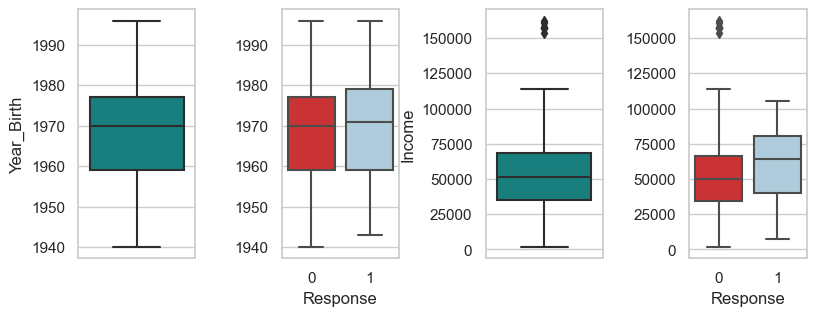

In [42]:
plt.figure(figsize=(8, 3))
n = 1
j = 0

colors=["#e31a1c", "#a6cee3"]

for i in range(0, len(cols)*2, 2):
    ax1 = plt.subplot(n, math.ceil(len(cols)*2/n), i+1)
    sns.boxplot(y=df[cols[j]], color='#088F8F', orient='v')
    
    ax2 = plt.subplot(n, math.ceil(len(cols)*2/n), i+2, sharey=ax1)
    sns.boxplot(x=df["Response"], y=df[cols[j]], orient='v', palette=colors)
    
    ax2.set_ylabel(None)
    
    plt.tight_layout(pad=0.1)
    
    j+=1

In [43]:
df.reset_index(drop=True, inplace=True)

### **Kesimpulan**
Berdasarkan hasil perhitungan menggunakan `Z-score` dan juga `IQR`, dapat diketahui bahwa jumlah baris yang dihapus dari `Year_Birth` dan `Income` berdasarkan `IQR` untuk kolom  tidak jauh berbeda dibandingkan dengan `Z-score`, yaitu :
- IQR :
    - Jumlah data sebelum handling outliers : 2240
    - Jumlah data setelah handling outliers (Year_Birth) : 2237
    - Jumlah data setelah handling outliers (Income) : 2229

- Z_Score :
    - Jumlah data sebelum handling outliers : 2240
    - Jumlah data setelah handling outliers (Year_Birth) : 2237
    - Jumlah data setelah handling outliers (Income) : 2229

Namun, karena kita ingin meminimalisasi penghapusan data maka untuk proses ini kita memiliki `Manually Trimmed` agar tidak terlalu banyak data yang dihapus, jadi hanya berfokus pada data yang memiliki jauh yang sangat tinggi

- Jumlah data sebelum handling outliers : 2240
- Jumlah data setelah handling outliers (Year_Birth) : 2237
- Jumlah data setelah handling outliers (Income) : 2236

## **📌 Feature Engineering / Extraction**

Kita akan melakukan Calculation, Extraction, dan Binning features :
- Age Customer
- Age Group
- Has Child
- Dependents
- Month Customer (Lifetime)
- Spending
- Primer and Tersier product
- Total of Purchases
- Total_Cmp (Accepted Campaign 1-5)
- Ever_Accept (Accepted Campaign 1-5)
- Total Revenue
- Income Segment
- Conversion Rate Web
- Month Joined
- Recency Segment

**Membuat Kolom `Umur / Age`**

Berdasarkan data diketahui basis tahunnya : SAS Institute, 2014

In [44]:
# currentYear = datetime.now().year
currentYear = 2014 # based on data
df['Age'] = currentYear - df['Year_Birth']

**Membuat Kolom `Age Group`** 

[source age group](https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.semanticscholar.org%2Fpaper%2FHuman-Age-Group-Classification-Using-Facial-Bhat-V.K.Patil%2F19ddb412336ce633c1fe21544605c7bd65ff8d66&psig=AOvVaw3Sm17zYYJRrkisQVRyg4rf&ust=1684919686463000&source=images&cd=vfe&ved=0CBMQjhxqFwoTCJDXlY2Ni_8CFQAAAAAdAAAAABAI)

<img src="https://github.com/nurimammasri/Marketing-Campaign-Model-Prediction-by-Datalicious/assets/54845293/b24b4884-4d41-47d8-a4ed-24564f89aff8"  width="300" height="10">

Akan disederhanakan lagi :
- Young Adult < 30
- Adult 30-45 Tahun
- Senior Adult > 45 tahun

In [45]:
def age_group(x):
    if x > 45:
        grup = 'Senior Adult'
    elif x > 30:
        grup = 'Adult'
    else:
        grup = 'Young Adult'
    
    return grup

df['Age_group'] = df["Age"].apply(lambda x: age_group(x))

**Membuat Kolom `Has_child`**

Menggabungkan Kidhome dan Teenhome menjadi feature Has_child, yang mana hasil penjumlahannya yang memiliki anak minimal 1

In [46]:
df['Has_child'] = np.where(df["Kidhome"]+df["Teenhome"] > 0, 1, 0)

**Membuat Kolom `Dependents`**

Jumlah tanggungan dari customer, dari penjumlahan Kidhome dan Teenhome

In [47]:
df['Dependents'] = df['Kidhome'] + df['Teenhome']

**Membuat Kolom `Lifetime`**

Sudah berapa bulan customer sejak pembelian pertama di supermarket

In [48]:
df['Lifetime'] = (2014 - df["Dt_Customer"].dt.year)*12 + df["Dt_Customer"].dt.month

**Membuat Kolom `Spending`**

Jumlah pembelian tiap customer pada keseluruhan product

In [49]:
df['Spending']=df['MntWines']+ \
    df['MntFruits']+ \
    df['MntMeatProducts']+ \
    df['MntFishProducts']+ \
    df['MntSweetProducts']+ \
    df['MntGoldProds']

**Membuat Kolom `Primer and Tersier product`**

Jumlah pembelian tiap customer pada kelompok primer dan tersier product

In [50]:
# primer and tersier product
df['Primer_purchase'] = df['MntFruits']+df['MntMeatProducts']+df['MntFishProducts']
df['Tersier_purchase'] = df['MntWines']+df['MntSweetProducts']+df["MntGoldProds"]

**Membuat Kolom `Total of Purchases`**

In [51]:
df['Total_Purchases'] = df['NumDealsPurchases'] + \
    df['NumWebPurchases'] + \
    df['NumCatalogPurchases'] + \
    df['NumStorePurchases']

**Membuat Kolom `Total_Cmp`**

Berapa kali tiap customer merespon ke 5 campign yang dilaksanakan (AcceptedCmp 1 - 5)

In [52]:
df['Total_Cmp']=df['AcceptedCmp1'].astype("int64")+ \
    df['AcceptedCmp2'].astype("int64")+ \
    df['AcceptedCmp3'].astype("int64")+ \
    df['AcceptedCmp4'].astype("int64")+ \
    df['AcceptedCmp5'].astype("int64")

**Membuat Kolom `Ever_Accept`**

Apakah Customer pernah minimal sekali menerima campign atau tidak pernah sama sekali

In [53]:
df['Ever_Accept']=df['Total_Cmp'].apply(lambda x : 1 if x >= 1 else 0)

**Membuat Kolom `Total Revenue`**

Jumlah Campaign yang diresponse/accept (Campaign 1-5) dikali dengan revenue = 11

In [54]:
# total revenue
df['Total_revenue'] = (df['Total_Cmp']) * df['Z_Revenue']
df[['Z_Revenue', 'Total_revenue']].sample(5)

,Z_Revenue,Total_revenue
866,11,0
1657,11,0
704,11,0
302,11,0
2188,11,0


**Membuat Kolom `Income Segmentation`**

- None -> Missing values
- High -> >= q3(68468)
- Medium -> q1(35335) - q3(68468)
- Low -> < q1(35335)

In [55]:
Q1 = df["Income"].quantile(.25)
print(Q1)
Q3 = df["Income"].quantile(.75)
print(Q3)

def income_sgmt(x):
    if (x is None) or (type(x) not in [int, float]) :
        segment = "None"
    else:
        if x >= Q3:
            segment = "High"
        elif x < Q3 and x >= Q1:
            segment = "Medium"
        else:
            segment = "Low"
    return segment

df["Income_sgmt"] = df["Income"].fillna("None")
df["Income_sgmt"] = df["Income_sgmt"].apply(lambda x: income_sgmt(x))

35233.5
68468.25


In [56]:
df["Income_sgmt"].unique()

array(['Medium', 'High', 'Low'], dtype=object)

**Membuat Kolom `Conversion Rate Web`**

Perbandingan Total Purchases dengan Jumlah Pengunjung Website

In [57]:
df['Conversion_rate_web'] = np.round(df['Total_Purchases'] / df['NumWebVisitsMonth'], 2)
df['Conversion_rate_web'].fillna(0, inplace=True)
df['Conversion_rate_web'].replace([np.inf, -np.inf], 0, inplace=True)

**Membuat Kolom `Month Joined`**

Membuat kolom extraction month dari tanggal Customer pertama kali berbelanja

Note : Untuk nilai tahun tidak digunakan karena berpotensi bias karena dari nilai nya akan increasing tiap waktu, sedangkan month akan repeat pada tiap periode

In [58]:
df['Month_joined'] = df['Dt_Customer'].dt.month

**Membuat Kolom `Recency_sgmt`**

In [59]:
np.sort(df['Recency'].unique())

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [60]:
num_score = 5
cek = pd.qcut(df['Recency'].unique(), num_score, labels=range(num_score, 0, -1))
cek = pd.DataFrame({
    "value":df['Recency'].unique(),
    "score": cek
})

cek.groupby(['score'])[['value']] \
    .agg(['min', 'max']).sort_index(ascending=False) \
    .style.background_gradient(cmap='Reds')

In [61]:
divided = {5: 19, 4: 39, 3: 59, 2: 79}
 
def RScore(x,d):
    if x <= d[5]:
        return 4
    elif x <= d[4]:
        return 3
    elif x <= d[3]: 
        return 2
    elif x <= d[2]: 
        return 1
    else:
        return 0

df['Recency_sgmt'] = df['Recency'].apply(lambda x: RScore(x, divided))
df.groupby(['Recency_sgmt'])[['Recency']].agg(['min', 'max', 'count']).style.background_gradient(cmap='Reds')

Perkiraan pembagian dengan rentang 19 Hari:
- 4 score -> setengah bulan
- 3 score -> 1 bulan
- 2 score -> 1 setengah bulan
- 1 score -> 2 bulan
- 0 score -> 3 bulan

**Mengecek nilai Extraction**

In [62]:
df.sample(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_group,Has_child,Dependents,Lifetime,Spending,Primer_purchase,Tersier_purchase,Total_Purchases,Total_Cmp,Ever_Accept,Total_revenue,Income_sgmt,Conversion_rate_web,Month_joined,Recency_sgmt
168,6637,1988,Graduation,Single,66951.0,0,0,2013-11-02,46,277,162,305,173,76,124,1,3,4,7,1,0,0,0,0,0,0,3,11,0,26,Young Adult,0,0,23,1117,640,477,15,0,0,0,Medium,15.00,11,2
1855,9029,1972,PhD,Married,70116.0,0,0,2013-01-26,73,707,44,603,95,58,29,1,2,8,12,1,0,0,0,0,0,0,3,11,0,42,Adult,0,0,13,1536,742,794,23,0,0,0,High,23.00,1,1
670,3197,1980,Graduation,Married,77353.0,0,1,2013-12-16,38,275,59,107,69,101,59,2,6,4,8,4,0,0,0,0,0,0,3,11,0,34,Adult,1,1,24,670,235,435,20,0,0,0,High,5.00,12,3
2144,1100,1960,Master,Married,41275.0,1,2,2014-03-24,33,24,4,22,0,2,9,4,3,1,3,5,0,0,0,0,0,0,3,11,0,54,Senior Adult,1,3,3,61,26,35,11,0,0,0,Medium,2.20,3,3
1522,2408,1976,Graduation,Married,58597.0,1,1,2012-11-20,20,490,0,184,10,28,21,12,7,4,9,7,0,0,0,0,0,0,3,11,0,38,Adult,1,2,35,733,194,539,32,0,0,0,Medium,4.57,11,3


**Categorical (String)**

- Education - Basic, Graduation, Master, PhD
- Marital_Status - Single, Married, Divorced
- Age_group - Young Adult, Adult, Senior Adult
- Income_sgmt - High, Medium, Low

**Categorical (Int)**

- ID
- Kidhome - 0, 1, 2
- Teenhome - 0, 1, 2
- AcceptedCmp1 - 0, 1
- AcceptedCmp2 - 0, 1
- AcceptedCmp3 - 0, 1
- AcceptedCmp4 - 0, 1
- AcceptedCmp5 - 0, 1
- Ever_Accept - 0, 1
- Complain - 0, 1
- Response - 0, 1
- Has_child - 0, 1
- Recency_sgmt - 0, 1, 2, 3, 4

**Numericals**

- Year_Birth = 1940 - 1996
- Income = 1730.0 - 162397.0
- Kidhome = 0 - 2
- Teenhome = 0 - 2
- Recency = 0 - 99
- Age = 18 - 74
- Dependents = 0 - 3
- Lifetime = 1 - 36
- Spending = 5 - 2525
- Primer_purchase = 1 - 1727
- Tersier_purchase = 3 - 1689
- Total_Purchases = 0 - 44
- NumWebVisitsMonth = 0 - 20
- Conversion_rate_web = 0.0 - 43.0
- Total_Cmp = 0 - 4
- Total_revenue = 0 - 44
- Month_joined = 1 - 12

**Numericals (one)**

- Z_CostContact = 3
- Z_Revenue = 11

**Numericals (Product)**

- MntWines = 0 - 1493
- MntFruits = 0 - 199
- MntMeatProducts = 0 - 1725
- MntFishProducts = 0 - 259
- MntSweetProducts = 0 - 263
- MntGoldProds = 0 - 362

**Numericals (Purchases)**

- NumDealsPurchases = 0 - 15
- NumWebPurchases = 0 - 27
- NumCatalogPurchases = 0 - 28
- NumStorePurchases = 0 - 13

**Timestamp**
- Dt_Customer = 2012-07-30 - 2014-06-29

In [63]:
cat_str = ['Education', 'Marital_Status', 'Age_group', 'Income_sgmt']
cat_int = ['ID', 'Kidhome', 'Teenhome', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 
           'Ever_Accept', 'Complain', 'Response', 'Has_child', 'Recency_sgmt']

num = ['Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Age', 'Dependents', 'Lifetime', 'Spending', 
       'Primer_purchase', 'Tersier_purchase', 'Total_Purchases', 'NumWebVisitsMonth', 'Conversion_rate_web', 
       'Total_Cmp', 'Total_revenue', 'Month_joined']

num_one = ['Z_CostContact', 'Z_Revenue']

num_product = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
num_purchases = ['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']

timestamp = ["Dt_Customer"]

Mengecek Kolom di pembagian type

In [64]:
allcol = cat_str + cat_int + num + num_one + num_product + num_purchases + timestamp
for i in df:
    if i not in allcol:
        print(i)

In [65]:
#cek unique value
cat_cols = cat_str+cat_int
for x in cat_cols: 
    unq = list(df[x].unique())
    sorted(unq)
    
    print (f'===== {x} =====')
    if len(unq) >= 10:
        unq = list(unq[:10])+['.....']
        print (f'{unq}')
    else:
        print (f'{unq}')
    print()

num_cols = num + num_one + num_product + num_purchases
for x in num_cols + timestamp: 
    print("{} = {} - {}".format(x, min(df[x]), max(df[x])))

===== Education =====
['Graduation', 'PhD', 'Master', 'Basic']

===== Marital_Status =====
['Single', 'Married', 'Divorced']

===== Age_group =====
['Senior Adult', 'Young Adult', 'Adult']

===== Income_sgmt =====
['Medium', 'High', 'Low']

===== ID =====
[5524, 2174, 4141, 6182, 5324, 7446, 965, 6177, 4855, 5899, '.....']

===== Kidhome =====
[0, 1, 2]

===== Teenhome =====
[0, 1, 2]

===== AcceptedCmp1 =====
[0, 1]

===== AcceptedCmp2 =====
[0, 1]

===== AcceptedCmp3 =====
[0, 1]

===== AcceptedCmp4 =====
[0, 1]

===== AcceptedCmp5 =====
[0, 1]

===== Ever_Accept =====
[0, 1]

===== Complain =====
[0, 1]

===== Response =====
[1, 0]

===== Has_child =====
[0, 1]

===== Recency_sgmt =====
[2, 3, 0, 4, 1]

Year_Birth = 1940 - 1996
Income = 1730.0 - 162397.0
Kidhome = 0 - 2
Teenhome = 0 - 2
Recency = 0 - 99
Age = 18 - 74
Dependents = 0 - 3
Lifetime = 1 - 36
Spending = 5 - 2525
Primer_purchase = 1 - 1727
Tersier_purchase = 3 - 1689
Total_Purchases = 0 - 44
NumWebVisitsMonth = 0 - 20
Conv

In [66]:
new_cols = list(df.columns.values)
new_cols.remove("Response")
new_cols.append("Response")
df = df[new_cols].copy()

In [67]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Age',
       'Age_group', 'Has_child', 'Dependents', 'Lifetime', 'Spending',
       'Primer_purchase', 'Tersier_purchase', 'Total_Purchases', 'Total_Cmp',
       'Ever_Accept', 'Total_revenue', 'Income_sgmt', 'Conversion_rate_web',
       'Month_joined', 'Recency_sgmt', 'Response'],
      dtype='object')

## **📌 Feature Transformation (Numeric)**

Mengecek Skewness di tiap kolom untuk menentukan jenis Transformation

In [68]:
skew_type_list = []
skew_val_list = []
kurtosis_val_list = []

for column in num_cols:
    data = df[column].dropna(axis=0)
    q1 = data.quantile(q=0.25)
    mean = round(data.mean(), 3)
    median = data.median()
    mode = data.mode()[0]
    q3 = data.quantile(q=0.75)
    # skew_val = round(data.skew(),3)
    skew_val = round(skew(data, nan_policy="omit"),3)
    kurtosis_val = round(kurtosis(data, nan_policy="omit"),3)

    if (mean == median == mode) or (-0.2 < skew_val < 0.2):
        skew_type = "Normal Distribution (Symmetric)"
    elif mean < median < mode:
        skew_type = "Negatively Skewed"
        if skew_val <= -1:
            skew_type = "Highly Negatively Skewed"
        elif -0.5 >= skew_val > -1:
            skew_type = "Moderately Negatively Skewed"
        else :
            skew_type = "Moderately Normal Distribution (Symmetric)"
    else:
        skew_type = "Positively Skewed"
        if skew_val >= 1:
            skew_type = "Highly Positively Skewed"
        elif 0.5 <= skew_val < 1:
            skew_type = "Moderately Positively Skewed"
        else :
            skew_type = "Moderately Normal Distribution (Symmetric)"
    skew_type_list.append(skew_type)
    skew_val_list.append(skew_val)
    kurtosis_val_list.append(kurtosis_val)
            
dist = pd.DataFrame({
    "Column Name":num_cols,
    "Skewness": skew_val_list,
    "Kurtosis": kurtosis_val_list,
    "Type of Distribution": skew_type_list
})

# for bimodial and Uniform

dist.loc[dist["Column Name"].isin(["Z_CostContact", "Z_Revenue"]), "Type of Distribution"] = "Uniform Distribution"
dist.loc[dist["Column Name"].isin(["Kidhome", "Teenhome"]), "Type of Distribution"] = "Bimodal Distribution"
dist = dist.sort_values(["Type of Distribution","Column Name"]).reset_index(drop=True)
dist

C:\Users\nurim\AppData\Local\Temp\ipykernel_19396\1677991082.py:13: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.

C:\Users\nurim\AppData\Local\Temp\ipykernel_19396\1677991082.py:14: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.

C:\Users\nurim\AppData\Local\Temp\ipykernel_19396\1677991082.py:13: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.

C:\Users\nurim\AppData\Local\Temp\ipykernel_19396\1677991082.py:14: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



,Column Name,Skewness,Kurtosis,Type of Distribution
0,Kidhome,0.636,-0.779,Bimodal Distribution
1,Teenhome,0.406,-0.987,Bimodal Distribution
2,Conversion_rate_web,2.332,6.442,Highly Positively Skewed
3,MntFishProducts,1.919,3.086,Highly Positively Skewed
4,MntFruits,2.103,4.058,Highly Positively Skewed
5,MntGoldProds,1.884,3.548,Highly Positively Skewed
6,MntMeatProducts,2.084,5.515,Highly Positively Skewed
7,MntSweetProducts,2.134,4.360,Highly Positively Skewed
8,MntWines,1.175,0.597,Highly Positively Skewed
9,NumCatalogPurchases,1.880,8.030,Highly Positively Skewed


In [69]:
exclude = ["Kidhome", "Teenhome", "Dependents", "Total_Cmp"]

log_cols = sorted(list(dist[
    dist["Type of Distribution"].str.contains("Positively Skewed") & 
    ~dist["Column Name"].isin(exclude)
]["Column Name"].values))

norm_cols = sorted(list(dist[
    dist["Type of Distribution"].str.contains("Normal Distribution") & 
    ~dist["Column Name"].isin(exclude)
]["Column Name"].values))

print("Log Transformation =", log_cols)
print("Normalisasi/Standardization =", norm_cols)

Log Transformation = ['Conversion_rate_web', 'MntFishProducts', 'MntFruits', 'MntGoldProds', 'MntMeatProducts', 'MntSweetProducts', 'MntWines', 'NumCatalogPurchases', 'NumDealsPurchases', 'NumStorePurchases', 'NumWebPurchases', 'Primer_purchase', 'Spending', 'Tersier_purchase', 'Total_revenue']
Normalisasi/Standardization = ['Age', 'Income', 'Lifetime', 'Month_joined', 'NumWebVisitsMonth', 'Recency', 'Total_Purchases', 'Year_Birth']


Dari hasil temuan, kita dapat menentukan beberapa transformasi yang akan kita lakukan :
- **Scaling and Converting to a Normal Distribution :**
    - log Transformation
    - Box-Cox Transformation
    - Yeo-Johnson Transformation
    
    **Adapun daftar column yang akan kita transform pada proses ini :**
        - Conversion_rate_web
        - MntFishProducts
        - MntFruits
        - MntGoldProds
        - MntMeatProducts
        - MntSweetProducts
        - MntWines
        - NumCatalogPurchases
        - NumDealsPurchases
        - NumStorePurchases
        - NumWebPurchases
        - Primer_purchase
        - Spending
        - Tersier_purchase
        - Total_revenue
    
- **Just Scaling :**
    - Normalization
    - Standardization
    
    **Adapun daftar column yang akan kita transform pada proses ini :**
        - Age
        - Income
        - Lifetime
        - Month_joined
        - NumWebVisitsMonth
        - Recency
        - Total_Purchases
        - Year_Birth

- Sedangkan untuk beberapa kolom yang **tidak perlu melakukan Transformasi** karena rentang nilai yang masih wajar sebagai berikut :
    - Kidhome
    - Teenhome
    - Dependents
    - Total_Cmp

**Choice Determination:**

- Pada proses `Scaling and Converting to a Normal Distribution` ini kita menggunakan `Yeo-Johnson Transformation`, karena dari hasilnya kita bisa melihat hasil bentuk curve yang lebih Normal Distribusi
- Pada proses `Just Scaling` ini kita menggunakan `Normalization` karena lebih robust untuk algoritma yang akan kita gunakan 

### **Log Transformation**

Numerical variables may have high skewed and non-normal distribution (Gaussian Distribution) caused by outliers, highly exponential distributions, etc. Therefore we go for data transformation.

In Log transformation each variable of x will be replaced by log(x) with base 10, base 2, or natural log.

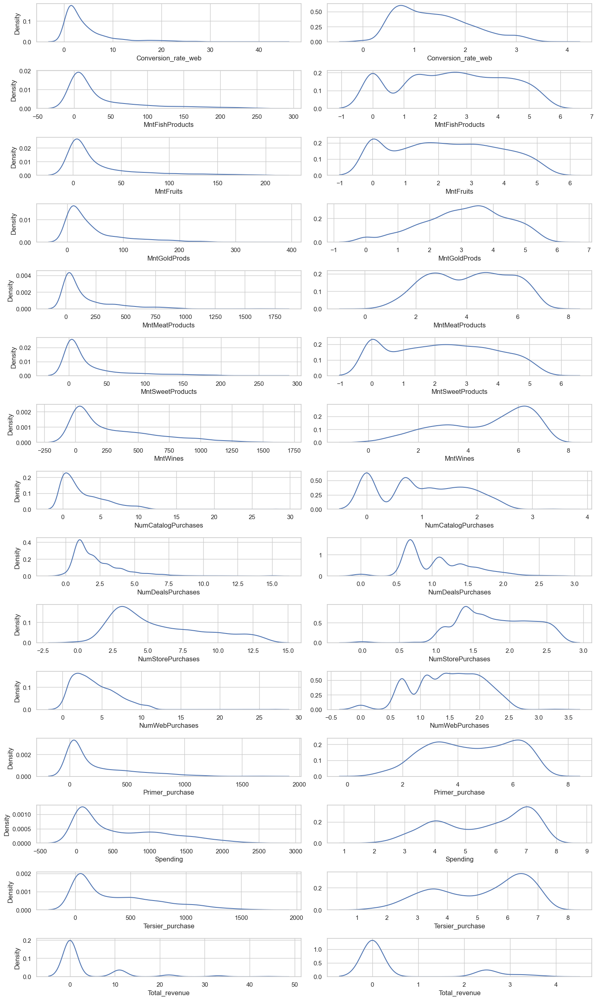

In [70]:
fig, ax = plt.subplots(len(log_cols),2,figsize=(15,25))
for i in range(0,len(log_cols)):
    kde1 = sns.kdeplot(df[log_cols[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(np.log(df[log_cols[i]]+1), ax=ax[i][1])
    kde2.set_ylabel(None)
    plt.tight_layout()

In [71]:
# add 1 bcs err : divide by zero encountered in log
# df[log_cols] = np.log(df[log_cols]+1)
# df[log_cols] = np.log1p(df[log_cols])

In [72]:
# df[log_cols].describe()

### **Box-Cox Transformation**

Box-cox transformation works pretty well for many data natures. The below image is the mathematical formula for Box-cox transformation.

![image](https://github.com/nurimammasri/Marketing-Campaign-Model-Prediction-by-Datalicious/assets/54845293/fae1d9a3-8c7e-486d-aa10-51872c01a177)

All the values of lambda vary from -5 to 5 are considered and the best value for the data is selected. The “Best” value is one that results in the best skewness of the distribution. Log transformation will take place when we have lambda is zero.

- **with Scipy**

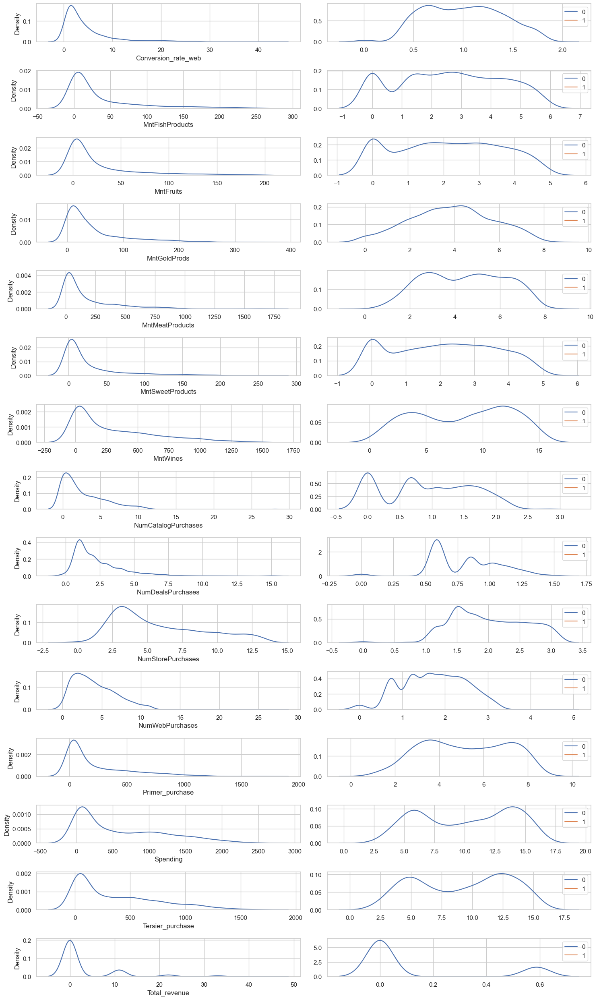

In [73]:
from scipy.stats import boxcox
fig, ax = plt.subplots(len(log_cols),2,figsize=(15,25))
for i in range(0,len(log_cols)):
    kde1 = sns.kdeplot(df[log_cols[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(boxcox(df[log_cols[i]]+1), warn_singular=False, ax=ax[i][1])
    kde2.set_ylabel(None)
    plt.tight_layout()

In [74]:
# for i in log_cols:
#     df[i], parameters = boxcox(df[i]+1)

In [75]:
# df[log_cols].describe()

- **with Sklearn**

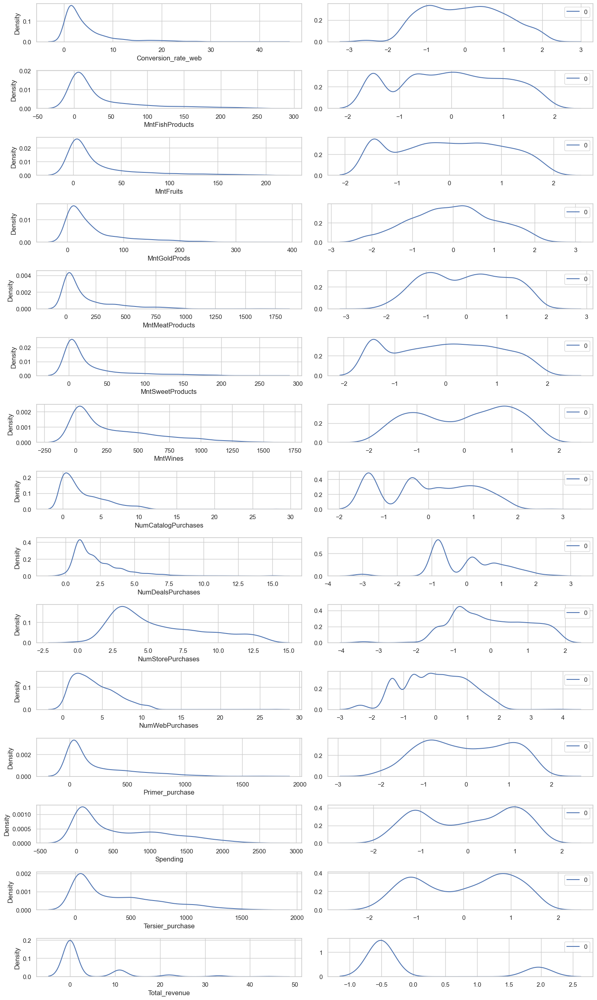

In [76]:
from sklearn.preprocessing import PowerTransformer

fig, ax = plt.subplots(len(log_cols),2,figsize=(15,25))
for i in range(0,len(log_cols)):
    pt = PowerTransformer(method='box-cox')
    data = pt.fit_transform(df[[log_cols[i]]]+1)
    kde1 = sns.kdeplot(df[log_cols[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(data, ax=ax[i][1])
    kde2.set_ylabel(None)
    plt.tight_layout()

In [77]:
# pt = PowerTransformer(method='box-cox')
# df[log_cols] = pt.fit_transform(df[log_cols]+1)

In [78]:
# df[log_cols].describe()

### **Yeo-Johnson Transformation**

- The advantage of the Yeo-Johnson transformation over the box-cox transformation is that, by default, the input (or parameter) of the Yeo-Johnson transformation can be a negative value. Unlike the Box-Cox transform, it does not require the values for each input variable to be strictly positive.

- This is a huge advantage over the box-cox transformation since we don’t have to generate strictly positive values before applying the transformation.

- It supports zero values and negative values. This means we can apply it to our dataset without scaling it first.

<img src="https://github.com/nurimammasri/Marketing-Campaign-Model-Prediction-by-Datalicious/assets/54845293/93654477-b936-48a0-be29-94d7d6c71764"  width="300" height="100">

References :
- https://statisticaloddsandends.wordpress.com/2021/02/19/the-box-cox-and-yeo-johnson-transformations-for-continuous-variables/
- https://www.stat.umn.edu/arc/yjpower.pdf

- **with scipy**

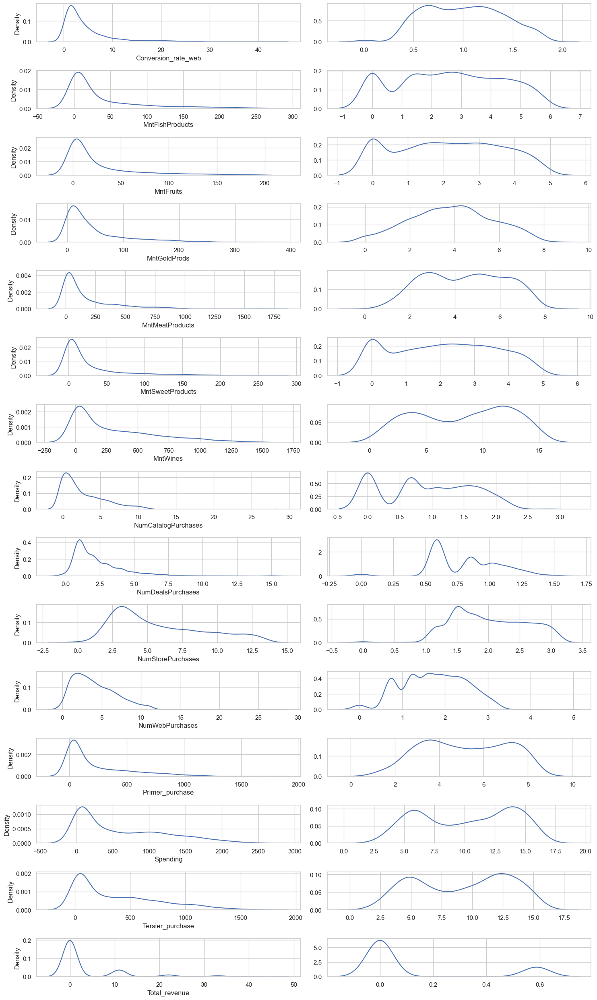

In [79]:
from scipy.stats import yeojohnson

fig, ax = plt.subplots(len(log_cols),2,figsize=(15,25))
for i in range(0,len(log_cols)):
    data, fitted_lambda = yeojohnson(df[log_cols[i]],lmbda=None)
    kde1 = sns.kdeplot(df[log_cols[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(data, ax=ax[i][1])
    kde2.set_ylabel(None)
    plt.tight_layout()

In [80]:
# for i in log_cols:
#     df[i], fitted_lambda = yeojohnson(df[i], lmbda=None)

In [81]:
# df[log_cols].describe()

- **with sklearn**

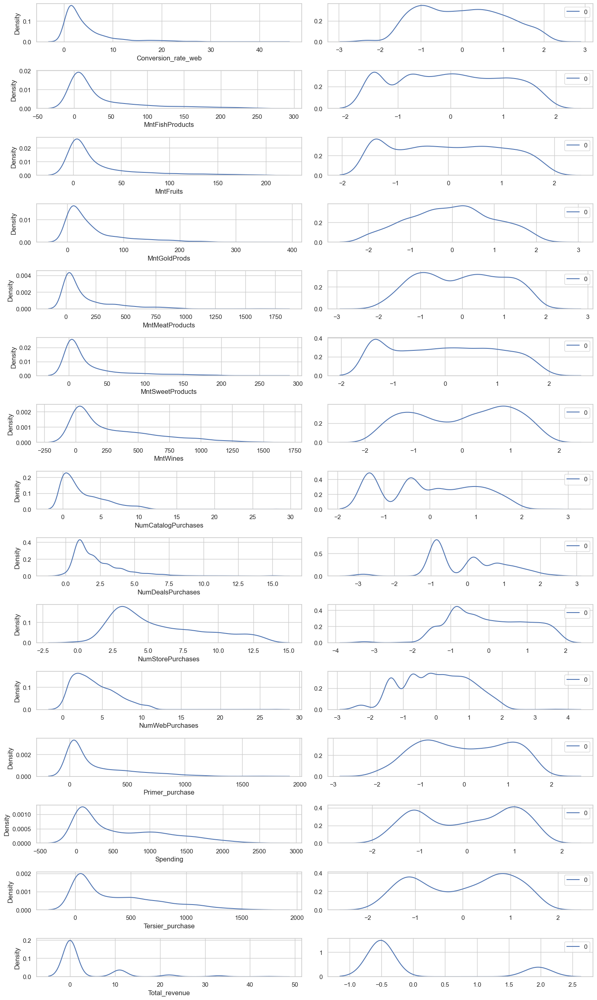

In [82]:
from sklearn.preprocessing import PowerTransformer

fig, ax = plt.subplots(len(log_cols),2,figsize=(15,25))
for i in range(0,len(log_cols)):
    pt = PowerTransformer(method='yeo-johnson')
    data = pt.fit_transform(df[[log_cols[i]]]+1)
    kde1 = sns.kdeplot(df[log_cols[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(data, ax=ax[i][1])
    kde2.set_ylabel(None)
    plt.tight_layout()

In [83]:
pt = PowerTransformer(method='yeo-johnson')
df[log_cols] = pt.fit_transform(df[log_cols])

In [84]:
df[log_cols].describe()

,Conversion_rate_web,MntFishProducts,MntFruits,MntGoldProds,MntMeatProducts,MntSweetProducts,MntWines,NumCatalogPurchases,NumDealsPurchases,NumStorePurchases,NumWebPurchases,Primer_purchase,Spending,Tersier_purchase,Total_revenue
count,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03,2.236000e+03
mean,2.955298e-16,1.112209e-17,-1.763646e-16,-8.818229e-17,1.747757e-17,2.812300e-16,3.495514e-17,-5.878820e-17,-4.448836e-16,-3.860954e-16,1.382317e-16,-7.467690e-17,2.351528e-16,-9.930439e-17,7.944351e-18
std,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00,1.000224e+00
min,-2.602504e+00,-1.509682e+00,-1.454849e+00,-2.138575e+00,-2.511714e+00,-1.434003e+00,-1.970872e+00,-1.338023e+00,-3.011224e+00,-3.392032e+00,-2.362005e+00,-2.314924e+00,-2.069143e+00,-1.976478e+00,-5.103128e-01
25%,-8.424338e-01,-7.007989e-01,-9.853113e-01,-6.882051e-01,-8.385940e-01,-9.711568e-01,-9.104855e-01,-1.338023e+00,-8.201550e-01,-8.627790e-01,-7.093807e-01,-8.349123e-01,-9.800995e-01,-9.755613e-01,-5.103128e-01
50%,-2.079832e-02,3.254224e-03,-1.431804e-03,3.731807e-03,3.471239e-02,-1.681003e-03,1.261694e-01,1.589299e-01,1.581372e-01,-4.692181e-02,1.851832e-01,-3.838851e-02,1.312892e-01,1.334070e-01,-5.103128e-01
75%,7.479659e-01,8.389835e-01,8.296137e-01,6.910780e-01,8.423659e-01,8.167801e-01,8.746546e-01,7.999743e-01,7.441576e-01,8.062471e-01,8.238423e-01,8.913990e-01,9.161492e-01,8.693208e-01,-5.103128e-01
max,2.363106e+00,1.862577e+00,1.884177e+00,2.492608e+00,2.222716e+00,2.012128e+00,1.812958e+00,2.767807e+00,2.658365e+00,1.780425e+00,3.933317e+00,2.046915e+00,1.757460e+00,1.840735e+00,1.985443e+00


### **Normalization**

In [85]:
from sklearn.preprocessing import MinMaxScaler
# create a scaler object
scaler = MinMaxScaler()
# fit and transform the data
df[norm_cols] = pd.DataFrame(scaler.fit_transform(df[norm_cols]), columns=df[norm_cols].columns)

In [86]:
df[norm_cols].describe()

,Age,Income,Lifetime,Month_joined,NumWebVisitsMonth,Recency,Total_Purchases,Year_Birth
count,2236.000000,2236.000000,2236.000000,2236.000000,2236.000000,2236.000000,2236.000000,2236.000000
mean,0.483964,0.312854,0.489522,0.496910,0.265944,0.496124,0.338012,0.516036
std,0.208987,0.134539,0.306805,0.317167,0.121344,0.292498,0.174497,0.208987
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.339286,0.208528,0.342857,0.181818,0.150000,0.242424,0.181818,0.339286
50%,0.464286,0.308533,0.485714,0.454545,0.300000,0.494949,0.340909,0.535714
75%,0.660714,0.415382,0.657143,0.818182,0.350000,0.747475,0.477273,0.660714
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### **Standardization**

In [87]:
# from sklearn.preprocessing import StandardScaler

# # create a scaler object
# std_scaler = StandardScaler()
# std_scaler
# # fit and transform the data
# df[norm_cols] = pd.DataFrame(std_scaler.fit_transform(df[norm_cols]), columns=df[norm_cols].columns)

In [88]:
# df[norm_cols].describe()

### **Kesimpulan**

Berdasarkan hasil pengecekan pada beberapa fitur yang telah diproses menggunakan transformation sebelumnya, dapat diketahui bahwa keseluruhan nilai skewnessnya sudah memiliki rentang yang lebih seragam (tidak jauh dan tidak terlalu bervariasi). Sehingga dapat disimpulkan bahwa teknik fitur transformation yang telah kami lakukan sudah valid dan kami.

## **📌 Feature Encoding (Categoric)**


Mengecek feature categorical yang masih memiliki nilai betype string/object

In [89]:
#cek unique value
for x in cat_str: 
    unq = list(df[x].unique())
    sorted(unq)
    
    print (f'===== {x} =====')
    if len(unq) >= 10:
        unq = list(unq[:10])+['.....']
        print (f'{unq}')
    else:
        print (f'{unq}')
    print()

===== Education =====
['Graduation', 'PhD', 'Master', 'Basic']

===== Marital_Status =====
['Single', 'Married', 'Divorced']

===== Age_group =====
['Senior Adult', 'Young Adult', 'Adult']

===== Income_sgmt =====
['Medium', 'High', 'Low']



In [90]:
cat_str

['Education', 'Marital_Status', 'Age_group', 'Income_sgmt']

Dari hasil temuan, kita dapat menentukan beberapa encoding yang akan kita lakukan :
- **Label Encoding :**
    - LabelEncoder
    - Manually Mapped
    
    **Adapun daftar column yang akan kita proses :**
    - `Education` - Basic (0), Graduation (1), Master (2), PhD (3)
    - `Age_group` - Young Adult (0), Adult (1), Senior Adult (2)
    - `Income_sgmt` - Low (0), Medium (1), High (2)
    
- **One Hot Encoding :**
    - get_dummies
    - OneHotEncoder
    
    **Adapun daftar column yang akan kita proses :**
    - `Marital_Status` - Single, Married, Divorced

**Choice Determination:**

- Pada proses `Label Encoding` ini kita menggunakan `Manually Mapped`, karena kita bisa menentukan secara fleksible urutan/order dari categorical feature
- Pada proses `One Hot Encoding` ini kita menggunakan `OneHotEncoder`, karena hasil encodingnya lebih rapi dan lebih mudah untuk dilakukan adjust

### **Label Encoding**

1. Menggunakan `LabelEncoder`

In [91]:
# from sklearn.preprocessing import LabelEncoder

# cat = cat_str.copy()
# cat.remove("Marital_Status")

# le = LabelEncoder()

# for i in cat_str:
#     le.fit(df[i])
#     df[i] = le.transform(df[i])
#     print(le.classes_)

2. Menggunakan Metode `Mapping`

In [92]:
map_edu = {
    'Basic' : 0,
    'Graduation' : 1,
    'Master' : 2,
    'PhD' : 3
}

df['Education'] = df['Education'].map(map_edu)
df['Education'].unique()

array([1, 3, 2, 0], dtype=int64)

In [93]:
map_age = {
    'Young Adult' : 0,
    'Adult' : 1,
    'Senior Adult' : 2
}

df['Age_group'] = df['Age_group'].map(map_age)
df['Age_group'].unique()

array([2, 0, 1], dtype=int64)

In [94]:
map_income = {
    'Low' : 0,
    'Medium' : 1,
    'High' : 2
}

df['Income_sgmt'] = df['Income_sgmt'].map(map_income)
df['Income_sgmt'].unique()

array([1, 2, 0], dtype=int64)

In [95]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Age,Age_group,Has_child,Dependents,Lifetime,Spending,Primer_purchase,Tersier_purchase,Total_Purchases,Total_Cmp,Ever_Accept,Total_revenue,Income_sgmt,Conversion_rate_web,Month_joined,Recency_sgmt,Response
0,5524,0.303571,1,Single,0.351086,0,0,2012-09-04,0.585859,1.058011,1.409686,1.420252,1.603700,1.387832,1.090527,0.744158,1.328316,1.726261,-0.418298,0.35,0,0,0,0,0,0,3,11,0.696429,2,0,0,0.914286,1.315785,1.477134,1.116046,0.568182,0,0,-0.510313,1,0.322257,0.727273,2,1
1,2174,0.250000,1,Single,0.277680,1,1,2014-03-08,0.383838,-1.212159,-0.985311,-1.378336,-0.870349,-0.971157,-0.938568,0.158137,-1.359951,-0.374162,-1.419908,0.25,0,0,0,0,0,0,3,11,0.750000,2,1,2,0.057143,-1.442462,-1.409056,-1.363875,0.136364,0,0,-0.510313,1,-0.859340,0.181818,3,0
2,4141,0.446429,1,Married,0.434956,0,0,2013-08-21,0.262626,0.745578,1.064234,0.445709,1.329530,0.552570,0.448706,-0.820155,1.328316,0.158930,1.242818,0.20,0,0,0,0,0,0,3,11,0.553571,2,0,0,0.542857,0.660253,0.740554,0.671920,0.477273,0,0,-0.510313,2,0.729193,0.636364,3,0
3,6182,0.785714,1,Married,0.155079,1,0,2014-02-10,0.262626,-1.212159,-0.380323,-0.707871,-0.097459,-0.518536,-1.043656,0.158137,-0.709381,-1.338023,-0.418298,0.30,0,0,0,0,0,0,3,11,0.214286,0,1,1,0.028571,-1.118746,-0.650506,-1.340485,0.181818,0,0,-0.510313,0,-0.753151,0.090909,3,0
4,5324,0.732143,3,Married,0.352051,1,0,2014-01-19,0.949495,0.122520,0.986785,0.397927,0.788455,0.699398,-0.342328,1.442609,0.526159,0.524042,0.272951,0.25,0,0,0,0,0,0,3,11,0.267857,1,1,1,0.000000,0.177763,0.515865,0.035887,0.431818,0,0,-0.510313,1,0.389599,0.000000,0,0


### **One Hot Encoding**

1. Menggunakan `get_dummies`

In [96]:
# # Not Auto Drop Columns
# ohe = pd.get_dummies(df["Marital_Status"])
# df.drop("Marital_Status", axis=1, inplace=True)
# df = df.join(ohe)

# # cara 2 : Auto drop Column
# # df = pd.get_dummies(data=df, columns=["Marital_Status"])

# df.head()

2. Menggunakan `OneHotEncoder`

In [97]:
from sklearn.preprocessing import OneHotEncoder

oh = OneHotEncoder()
df_ohe = pd.DataFrame(
    oh.fit_transform(df[["Marital_Status"]]).toarray(),
    columns=list(oh.categories_[0])
)
print(oh.categories_[0])

df.drop("Marital_Status", axis=1, inplace=True)

df = pd.concat([df, df_ohe], axis=1)

['Divorced' 'Married' 'Single']


### **Kesimpulan**

Berdasarkan hasil pengecekan pada beberapa fitur yang telah diproses menggunakan encoding sebelumnya, dapat diketahui bahwa keseluruhan nilai telah beripe numeric sesuai dengan nilai yang kita assign. Sehingga dapat disimpulkan bahwa teknik fitur encoding yang telah kami lakukan sudah valid dan kami.

## **📌 Feature Selection**

### **1. Drop Unnecessary Feature**

- Drop kolom `ID` karena memiliki banyak kategori dan tidak berguna untuk pemodelan
- Drop kolom `Year_Birth` karena sudah dilakukan Feature extraction untuk mengambil data Umur/Age pada range tahun saat ini 2014 (sesuai pada data)
- Drop kolom `Dt_Customer` karena tidak terlalu mempengaruhi model prediksi
- Drop kolom `Z_CostContact` (3) dan `Z_Revenue` (11) karena  hanya memiliki satu nilai, tidak memberikan informasi yang signifikan terhadap model prediksi

In [98]:
df.drop(['ID', 'Year_Birth', 'Dt_Customer', 'Z_CostContact', 'Z_Revenue'], inplace=True, axis=1)

### **2. Univariate Selection**

In [99]:
# define X and y
X = df.drop(['Response'], axis=1) #features
y = df['Response'] #target

- #### **ANOVA F-value**

`ANOVA F-value` estimates the degree of linearity between the input feature (i.e., independent features) and the output feature (i.e., dependent feature). A high F-value indicates a high degree of linearity and a low F-value indicates a low degree of linearity.

Scikit-learn provides two functions to calculate F-value:

1. `sklearn.feature_selection.f_regression` for regression problems
2. `sklearn.feature_selection.f_classif` for classification problems

Disadvantage:

ANOVA F-value only captures the linear relationships between input and output feature.

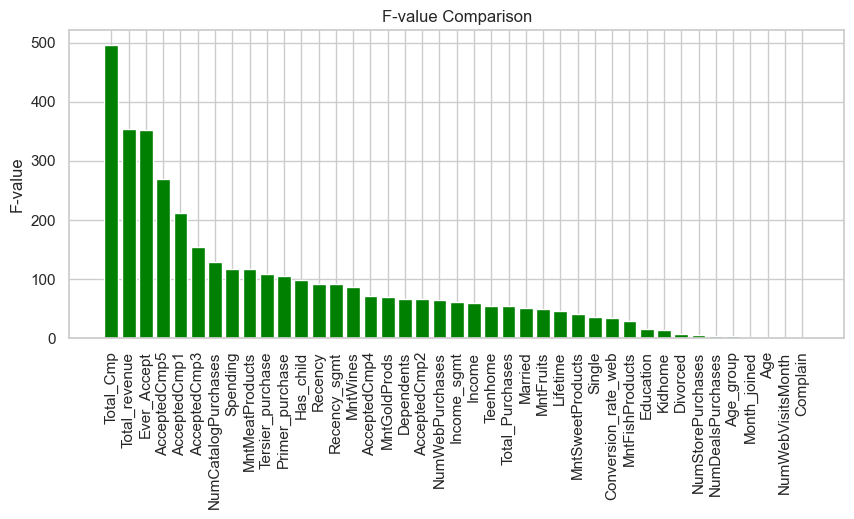

In [100]:
from sklearn.feature_selection import f_classif
feature_names = X.columns

# create f_classif object
f_value = f_classif(X, y)

# print the name and F-value of each feature
# for feature in zip(feature_names, f_value[0]):
#     print(feature)

fs = pd.DataFrame({
    "feature_names":feature_names,
    "f_value":f_value[0]
}).sort_values("f_value", ascending=False)
    
# Create a bar chart
plt.figure(figsize=(10,4))
plt.bar(data=fs, x="feature_names", height="f_value", color="green")
plt.xticks(rotation="vertical")
plt.ylabel("F-value")
plt.title("F-value Comparison")
plt.show()

Mengambil 20 top feature

In [101]:
feature_importance = []
for i in fs["feature_names"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance  

['Total_Cmp',
 'Total_revenue',
 'Ever_Accept',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp3',
 'NumCatalogPurchases',
 'Spending',
 'MntMeatProducts',
 'Tersier_purchase',
 'Primer_purchase',
 'Has_child',
 'Recency',
 'Recency_sgmt',
 'MntWines',
 'AcceptedCmp4',
 'MntGoldProds',
 'Dependents',
 'AcceptedCmp2',
 'NumWebPurchases']

- #### **Variance Threshold**

Variance Threshold removes the features whose variance is below the pre-defined `threshold` value. By default, it removes all zero-variance features, i.e. features that have the same value in all samples.

Advantage:

This can be used for unsupervised learning.

Disadvantage:

Variance Threshold only considers the relationship among the features but not the relationship between input features with the output feature.

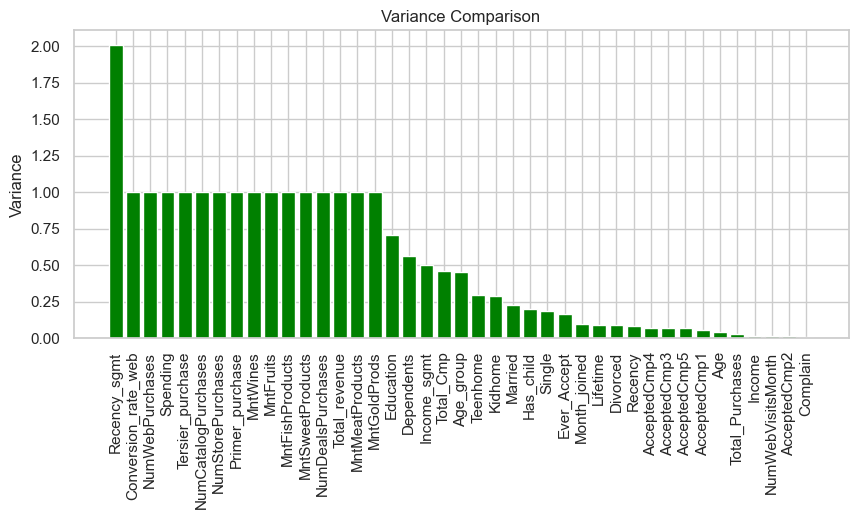

In [102]:
# import VarianceThreshold
from sklearn.feature_selection import VarianceThreshold
# create VarianceThreshold object
selector = VarianceThreshold(threshold=0.0)
# train and transform
selector.fit_transform(X)
# print the name and variance of each feature
# for feature in zip(feature_names, selector.variances_):
#     print(feature)

fs = pd.DataFrame({
    "feature_names":feature_names,
    "variances":selector.variances_
}).sort_values("variances", ascending=False)
    
# Create a bar chart
plt.figure(figsize=(10,4))
plt.bar(data=fs, x="feature_names", height="variances", color="green")
plt.xticks(rotation="vertical")
plt.ylabel("Variance")
plt.title("Variance Comparison")
plt.show()

Mengambil 20 top feature

In [103]:
for i in fs["feature_names"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance  

['Total_Cmp',
 'Total_revenue',
 'Ever_Accept',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp3',
 'NumCatalogPurchases',
 'Spending',
 'MntMeatProducts',
 'Tersier_purchase',
 'Primer_purchase',
 'Has_child',
 'Recency',
 'Recency_sgmt',
 'MntWines',
 'AcceptedCmp4',
 'MntGoldProds',
 'Dependents',
 'AcceptedCmp2',
 'NumWebPurchases',
 'Conversion_rate_web',
 'NumStorePurchases',
 'MntFruits',
 'MntFishProducts',
 'MntSweetProducts',
 'NumDealsPurchases',
 'Education',
 'Income_sgmt']

- #### **Mutual information**

Mutual information (MI) measures the dependence of one variable to another by quantifying the amount of information obtained about one feature, through the other feature. MI is symmetric and non-negative and is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.

Scikit-learn provides two functions to calculate F-value:

- `sklearn.feature_selection.mutual_info_regression` for regression problems
- `sklearn.feature_selection.mutual_info_classif` for classification problems

Advantage:

MI can capture non-linear relationships between input and output feature.

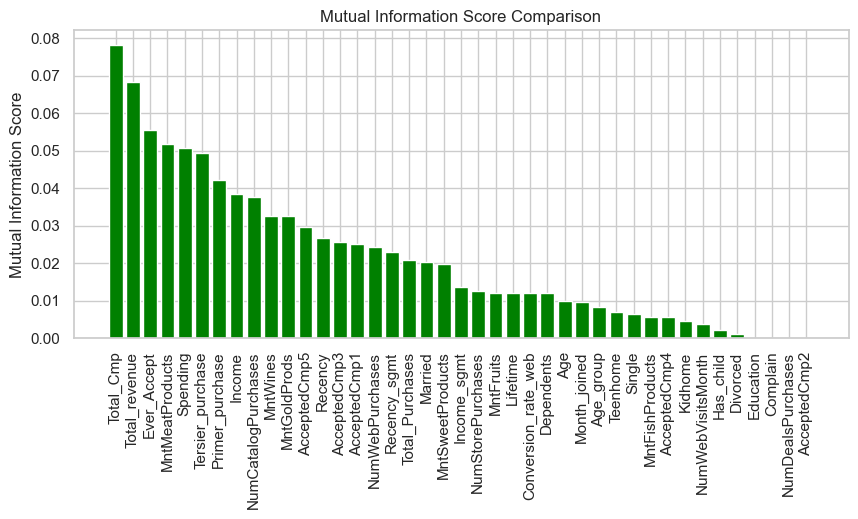

In [104]:
# import mutual_info_classif
from sklearn.feature_selection import mutual_info_classif
# create mutual_info_classif object
MI_score = mutual_info_classif(X, y, random_state=0)
# Print the name and mutual information score of each feature
# for feature in zip(feature_names, MI_score):
#     print(feature)

fs = pd.DataFrame({
    "feature_names":feature_names,
    "MI_score":MI_score
}).sort_values("MI_score", ascending=False)
    
# Create a bar chart
plt.figure(figsize=(10,4))
plt.bar(data=fs, x="feature_names", height="MI_score", color="green")
plt.xticks(rotation="vertical")
plt.ylabel("Mutual Information Score")
plt.title("Mutual Information Score Comparison")
plt.show()

Mengambil 20 top feature

In [105]:
for i in fs["feature_names"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance  

['Total_Cmp',
 'Total_revenue',
 'Ever_Accept',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp3',
 'NumCatalogPurchases',
 'Spending',
 'MntMeatProducts',
 'Tersier_purchase',
 'Primer_purchase',
 'Has_child',
 'Recency',
 'Recency_sgmt',
 'MntWines',
 'AcceptedCmp4',
 'MntGoldProds',
 'Dependents',
 'AcceptedCmp2',
 'NumWebPurchases',
 'Conversion_rate_web',
 'NumStorePurchases',
 'MntFruits',
 'MntFishProducts',
 'MntSweetProducts',
 'NumDealsPurchases',
 'Education',
 'Income_sgmt',
 'Income',
 'Total_Purchases',
 'Married']

- #### **Scikit-learn’s SelectKBest**

SelectKBest selects the features using a function (in this case ANOVA F-value) and then "removes all but the k highest scoring features".

Statistical tests can be used to select those features that have the strongest relationship with the output variable. `Mutual information, ANOVA F-test and chi square` are some of the most popular methods of univariate feature selection.

---

ERROR :

`Input X must be non-negative`

The error message you got that:

Tells that: Pearson's chi-square test (goodness of fit) does not apply to negative values. It occurred because the chi-square test assumes frequencies distribution and a frequency can't be a negative number. But, `sklearn.feature_selection.chi2` asserts the input as non-negative.

If data transformation is for some reason not possible (e.g. a negative value is an important factor), then you should pick another statistic to score your features:

```
sklearn.feature_selection.f_classif computes ANOVA f-value
sklearn.feature_selection.mutual_info_classif
```

In [106]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, f_classif, mutual_info_classif

# apply SelectKBest class to extract top 10 best features

# computes chi2
# semuanya harus positif
# bestfeatures = SelectKBest(score_func=chi2, k=10)

# computes ANOVA f-value
bestfeatures = SelectKBest(score_func=f_classif, k=10)

fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
featureScores.sort_values('Score', ascending=False, inplace=True)
print(featureScores.nlargest(10,'Score'))  #print 10 best features

                  Specs       Score
31            Total_Cmp  495.889239
33        Total_revenue  354.134798
32          Ever_Accept  351.524183
18         AcceptedCmp5  269.590003
19         AcceptedCmp1  211.130800
16         AcceptedCmp3  154.206347
13  NumCatalogPurchases  129.077831
27             Spending  117.971705
7       MntMeatProducts  117.687083
29     Tersier_purchase  108.789997


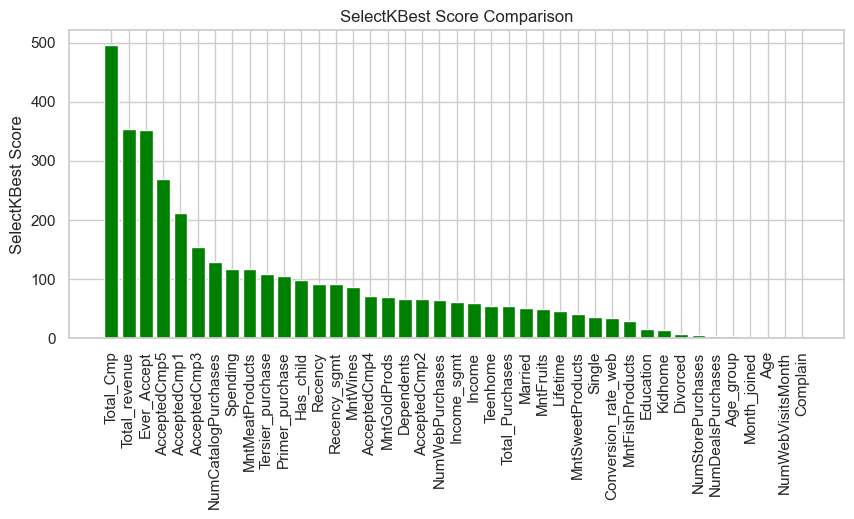

In [107]:
# Create a bar chart
plt.figure(figsize=(10,4))
plt.bar(data=featureScores, x="Specs", height="Score", color="green")
plt.xticks(rotation="vertical")
plt.ylabel("SelectKBest Score")
plt.title("SelectKBest Score Comparison")
plt.show()

Mengambil 20 top feature

In [108]:
for i in featureScores["Specs"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance  

['Total_Cmp',
 'Total_revenue',
 'Ever_Accept',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp3',
 'NumCatalogPurchases',
 'Spending',
 'MntMeatProducts',
 'Tersier_purchase',
 'Primer_purchase',
 'Has_child',
 'Recency',
 'Recency_sgmt',
 'MntWines',
 'AcceptedCmp4',
 'MntGoldProds',
 'Dependents',
 'AcceptedCmp2',
 'NumWebPurchases',
 'Conversion_rate_web',
 'NumStorePurchases',
 'MntFruits',
 'MntFishProducts',
 'MntSweetProducts',
 'NumDealsPurchases',
 'Education',
 'Income_sgmt',
 'Income',
 'Total_Purchases',
 'Married']

### **3. Feature Importance**

You can get the feature importance of each feature of your dataset by using the feature importance property of the model.

Feature importance gives you a score for each feature of your data, the higher the score more important or relevant is the feature towards your output variable.

Feature importance is an inbuilt class that comes with Tree Based Classifiers, we will be using Extra Tree Classifier for extracting the top 10 features for the dataset.

[0.02647419 0.02702015 0.01024854 0.01276463 0.04404644 0.02686784
 0.0265529  0.03044835 0.02308751 0.02722758 0.02585385 0.02290229
 0.02344878 0.02885243 0.02904697 0.02943147 0.02130198 0.00788224
 0.02656502 0.02232943 0.00509402 0.00152625 0.02721401 0.01912698
 0.01550283 0.01280306 0.03928454 0.02845189 0.02669226 0.02529865
 0.02303446 0.02846331 0.03533476 0.05584742 0.01341996 0.02512877
 0.02531431 0.046275   0.01033862 0.02598723 0.01750909]


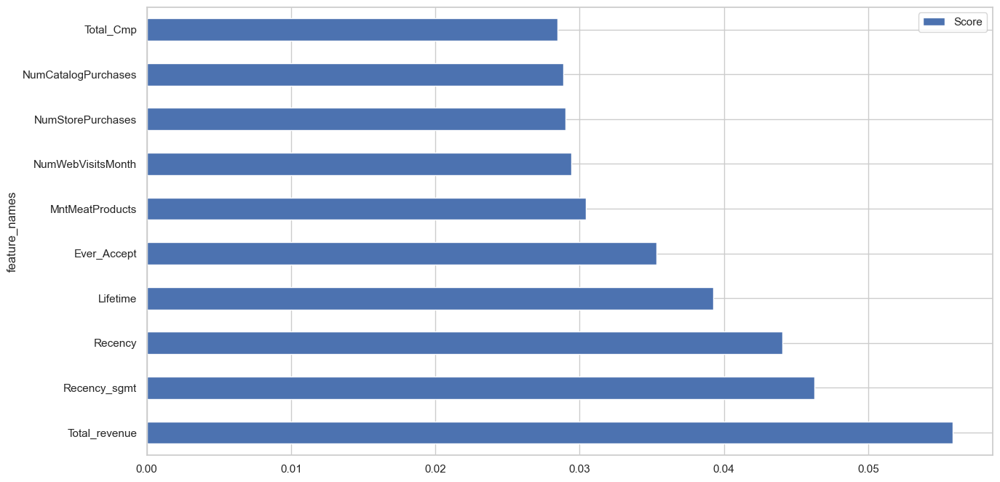

In [109]:
from sklearn.ensemble import ExtraTreesClassifier

model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances = pd.DataFrame(feat_importances).reset_index(names="feature_names") \
    .rename(columns={0:"Score"}) \
    .sort_values("Score", ascending=False).reset_index(drop=True)
feat_importances.nlargest(10, "Score").plot(x="feature_names", y="Score", kind='barh')
plt.show()

Mengambil 20 top feature

In [110]:
for i in feat_importances["feature_names"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance  

['Total_Cmp',
 'Total_revenue',
 'Ever_Accept',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp3',
 'NumCatalogPurchases',
 'Spending',
 'MntMeatProducts',
 'Tersier_purchase',
 'Primer_purchase',
 'Has_child',
 'Recency',
 'Recency_sgmt',
 'MntWines',
 'AcceptedCmp4',
 'MntGoldProds',
 'Dependents',
 'AcceptedCmp2',
 'NumWebPurchases',
 'Conversion_rate_web',
 'NumStorePurchases',
 'MntFruits',
 'MntFishProducts',
 'MntSweetProducts',
 'NumDealsPurchases',
 'Education',
 'Income_sgmt',
 'Income',
 'Total_Purchases',
 'Married',
 'Lifetime',
 'NumWebVisitsMonth',
 'Age']

### **4. Correlation Matrix with Heatmap**

- Correlation states how the features are related to each other or the target variable.

- Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)

- Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

- Cek Feature Redundan pada korelasi Antar Feature, Drop salah satunya, yang rendah korelsinya dengan Response (target)

<Axes: >

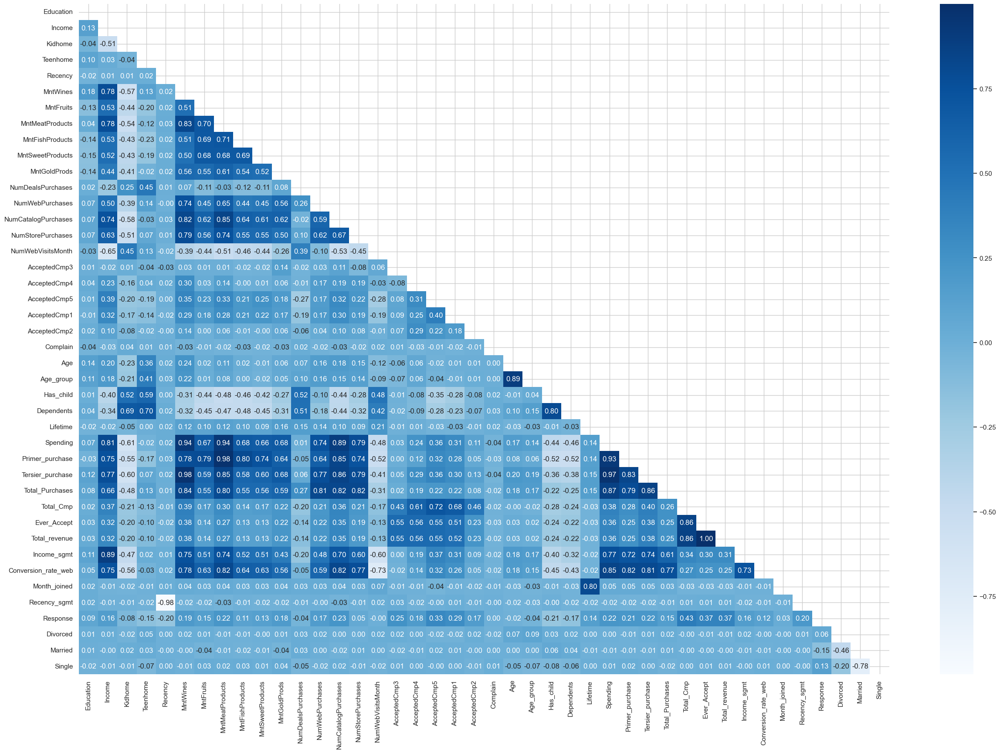

In [111]:
plt.figure(figsize=(30,20))
corr = df.corr(numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=np.bool_)) 
sns.heatmap(corr, cmap='Blues', annot=True, fmt='.2f', mask=mask)

**Checking Correlation with Target (Response)**

In [112]:
corr = df.corrwith(df["Response"], numeric_only=True)
corr = corr.reset_index(name='corr value')
corr["Corr Type"] = corr["corr value"].apply(lambda x : "Positif" if x >= 0 else "Negatif")
corr["corr value"] = corr["corr value"].apply(lambda x : abs(x))
corr = corr.sort_values('corr value', ascending=False, ignore_index=True)
corr.head(10)

,index,corr value,Corr Type
0,Response,1.000000,Positif
1,Total_Cmp,0.426206,Positif
2,Total_revenue,0.369906,Positif
3,Ever_Accept,0.368726,Positif
4,AcceptedCmp5,0.328148,Positif
5,AcceptedCmp1,0.293849,Positif
6,AcceptedCmp3,0.254106,Positif
7,NumCatalogPurchases,0.233715,Positif
8,Spending,0.223961,Positif
9,MntMeatProducts,0.223704,Positif


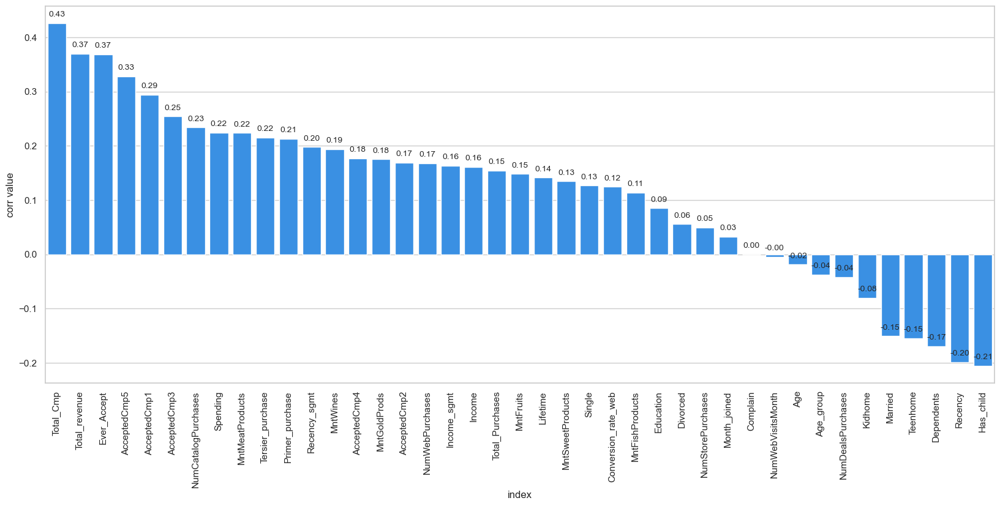

In [113]:
corr = df.corrwith(df["Response"], numeric_only=True)
corr = corr.reset_index(name='corr value')
corr = corr.sort_values('corr value', ascending=False)[1:]

plt.figure(figsize=(20, 8))
ax = sns.barplot(x='index', y="corr value", data=corr, order=corr["index"], color='dodgerblue')
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():0.2f}', 
        (p.get_x() + p.get_width() / 2., p.get_height()), 
        ha = 'center', 
        va = 'center', 
        xytext = (0, 10), 
        fontsize=10,
        textcoords = 'offset points')
plt.xticks(rotation=90)
plt.show()

In [114]:
target = "Response"
high_corr_cols = [i for i in list(corr[corr["corr value"] > 0.15]["index"].values) if i != target]
print(high_corr_cols)

['Total_Cmp', 'Total_revenue', 'Ever_Accept', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp3', 'NumCatalogPurchases', 'Spending', 'MntMeatProducts', 'Tersier_purchase', 'Primer_purchase', 'Recency_sgmt', 'MntWines', 'AcceptedCmp4', 'MntGoldProds', 'AcceptedCmp2', 'NumWebPurchases', 'Income_sgmt', 'Income', 'Total_Purchases']


Mengambil 20 top feature

In [115]:
for i in corr["index"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance  

['Total_Cmp',
 'Total_revenue',
 'Ever_Accept',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp3',
 'NumCatalogPurchases',
 'Spending',
 'MntMeatProducts',
 'Tersier_purchase',
 'Primer_purchase',
 'Has_child',
 'Recency',
 'Recency_sgmt',
 'MntWines',
 'AcceptedCmp4',
 'MntGoldProds',
 'Dependents',
 'AcceptedCmp2',
 'NumWebPurchases',
 'Conversion_rate_web',
 'NumStorePurchases',
 'MntFruits',
 'MntFishProducts',
 'MntSweetProducts',
 'NumDealsPurchases',
 'Education',
 'Income_sgmt',
 'Income',
 'Total_Purchases',
 'Married',
 'Lifetime',
 'NumWebVisitsMonth',
 'Age']

### **5. Multicollinearity Check (Drop Redundancy)**

- Multicollinearity means independent variables in a model are correlated.
- Multicollinearity among independent variables can reduce the performance of the model.
- Multicollinearity reduces the statistical significance of the independent variables.

Dari feature yang telah kita pilih dari gabungan Top 20 akan di lakukan pengecekan kembali melalui `redudansi antar feature`. Pada proses ini kita memilih antar feature yang memiliki korelasi diatas `threshold > 0.70`, yang kemudian akan di `bandingkan korelasinya dengan Target` untuk `drop salah satu feature`

#### **1. Correlation Coefficient**

<Axes: >

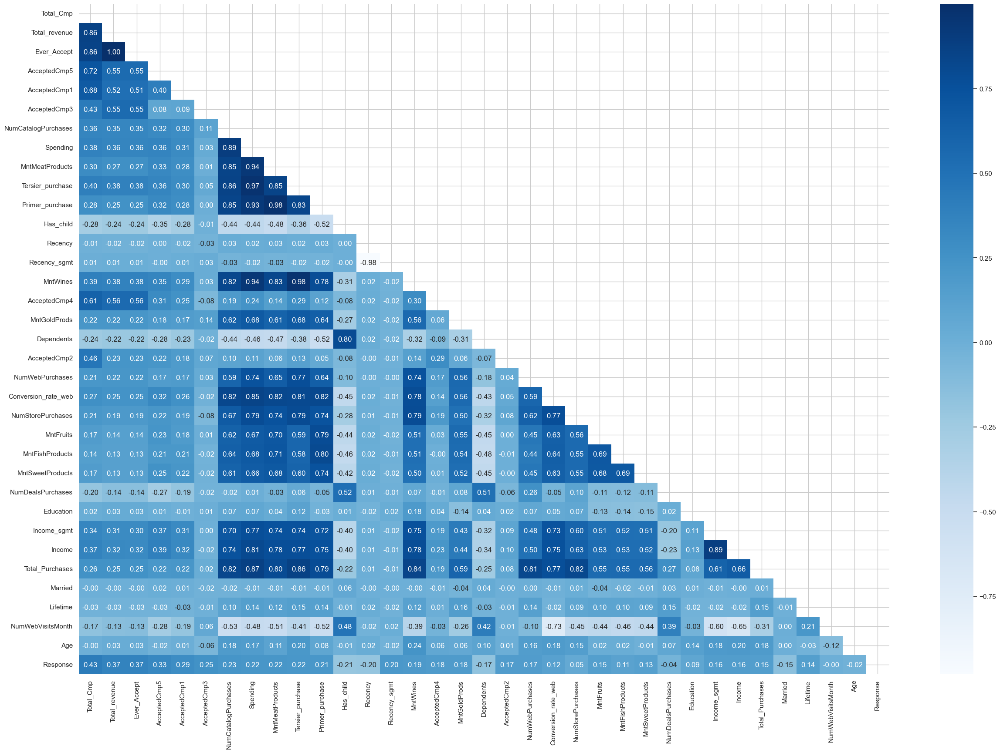

In [116]:
plt.figure(figsize=(30,20))
corr = df[feature_importance+["Response"]].corr(numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=np.bool_)) 
sns.heatmap(corr, cmap='Blues', annot=True, fmt='.2f', mask=mask)

**Manampilkan Korelasi Feature > Threshold 0.70**

Akan ada info mengenai Feature apa saja yang perlu di drop

In [117]:
def corrtarget(x):
    target = "Response"
    return df[x].corr(df[target])

def corrresp(x):
    target = "Response"
    col1 = x["A"]
    col2 = x["B"]
    
    cor1 = df[col1].corr(df[target])
    cor2 = df[col2].corr(df[target])
    
    if cor1 < cor2:
        return col1
    else:
        return col2
    return col1

In [118]:
corr_matrix = df[feature_importance].corr()
target = "Response"

# Flatten correlation matrix.
flat_cm = corr_matrix.stack().reset_index()
flat_cm.columns = ['A', 'B', 'correlation']    
flat_cm = flat_cm.loc[flat_cm.correlation < 1, :]
flat_cm = flat_cm.sort_values("correlation", ascending=False)
redundan = flat_cm[flat_cm["correlation"] >= 0.7].reset_index(drop=True)
redundan['A vs Target'] = redundan['A'].apply(lambda x: corrtarget(x))
redundan['B vs Target'] = redundan['B'].apply(lambda x: corrtarget(x))
redundan = redundan.drop_duplicates(subset=["correlation"])
redundan["drop"] = redundan.apply(corrresp, axis=1)
redundan

,A,B,correlation,A vs Target,B vs Target,drop
0,Ever_Accept,Total_revenue,0.999982,0.368726,0.369906,Ever_Accept
2,MntMeatProducts,Primer_purchase,0.977667,0.223704,0.212989,Primer_purchase
4,MntWines,Tersier_purchase,0.976146,0.193849,0.215490,MntWines
6,Tersier_purchase,Spending,0.970442,0.215490,0.223961,Tersier_purchase
8,MntMeatProducts,Spending,0.937875,0.223704,0.223961,MntMeatProducts
10,MntWines,Spending,0.937196,0.193849,0.223961,MntWines
12,Spending,Primer_purchase,0.929771,0.223961,0.212989,Primer_purchase
14,Spending,NumCatalogPurchases,0.894305,0.223961,0.233715,Spending
16,Income,Income_sgmt,0.890373,0.160914,0.163239,Income
18,Spending,Total_Purchases,0.873134,0.223961,0.154715,Total_Purchases


#### **2. VIF (Variance Inflation Factor)**

How do we calculate Multi-collinearity ?

This is where VIF (Variance Inflation Factor) come into the picture. The variance inflation factor (VIF) identifies the strength of correlation among the predictors (features).

Multicollinearity reduces the statistical significance of the independent variables. VIF is used to detect these variables. A large variance inflation factor (VIF) on an independent variable indicates a highly collinear relationship to the other variables that should be considered or adjusted for in the structure of the model and selection of independent variables.

<img src="https://github.com/nurimammasri/Marketing-Campaign-Model-Prediction-by-Datalicious/assets/54845293/31840298-732d-41dd-b9e8-1f07c31e0c7d"  width="200" height="50">

VIF value will always be greater than 1. Here are some rules for VIF

- 1 = not correlated.
- Between 1 and 5 = moderately correlated.
- Greater than 5 = highly correlated.

If all the independent variables are orthogonal to each other, then VIF = 1.0. If there is perfect correlation, then VIF = infinity.

In [119]:
# calculate VIF scores for each feature
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif 
from statsmodels.tools.tools import add_constant

X = add_constant(df[feature_importance])

vif_df = pd.DataFrame([vif(X.values, i) 
               for i in range(X.shape[1])], 
              index=X.columns).reset_index()
vif_df.columns = ['feature','vif_score']
vif_df = vif_df.loc[vif_df.feature!='const']
vif_df['vif_score'] = round(vif_df['vif_score'], 4)
vif_df.sort_values("vif_score", ascending=False, inplace=True)
vif_df

C:\Users\nurim\anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning:

divide by zero encountered in double_scalars



,feature,vif_score
1,Total_Cmp,inf
4,AcceptedCmp5,inf
5,AcceptedCmp1,inf
6,AcceptedCmp3,inf
19,AcceptedCmp2,inf
16,AcceptedCmp4,inf
2,Total_revenue,278530.9228
3,Ever_Accept,273120.2871
8,Spending,185.2288
10,Tersier_purchase,158.2816


**Drop Redundant Features**

In [120]:
for i in list(redundan["drop"].unique()):
    feature_importance.remove(i)
    
feature_importance = sorted(feature_importance)
feature_importance

['AcceptedCmp1',
 'AcceptedCmp2',
 'AcceptedCmp3',
 'AcceptedCmp4',
 'Age',
 'Dependents',
 'Education',
 'Lifetime',
 'Married',
 'MntGoldProds',
 'NumCatalogPurchases',
 'NumDealsPurchases',
 'NumWebVisitsMonth',
 'Recency',
 'Recency_sgmt',
 'Total_Cmp']

### **Kesimpulan**

Berdasarkan hasil pengecekan pada beberapa fitur yang telah diproses menggunakan feature selection :
- Drop Unnecessary Feature
- Univariate Selection
    - Anova F-value
    - Variance Threshold
    - Mutual Information
    - SelectKBest
- Feature Importance
- Pearson Correlation
- Multicollinearity Check (Drop Redundancy)

Maka telah didapatkan feature yang akan digunakan pada proses modelling sebagai berikut :

In [121]:
df[feature_importance].head()

,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,Age,Dependents,Education,Lifetime,Married,MntGoldProds,NumCatalogPurchases,NumDealsPurchases,NumWebVisitsMonth,Recency,Recency_sgmt,Total_Cmp
0,0,0,0,0,0.696429,0,1,0.914286,0.0,1.090527,1.726261,0.744158,0.35,0.585859,2,0
1,0,0,0,0,0.750000,2,1,0.057143,0.0,-0.938568,-0.374162,0.158137,0.25,0.383838,3,0
2,0,0,0,0,0.553571,0,1,0.542857,1.0,0.448706,0.158930,-0.820155,0.20,0.262626,3,0
3,0,0,0,0,0.214286,1,1,0.028571,1.0,-1.043656,-1.338023,0.158137,0.30,0.262626,3,0
4,0,0,0,0,0.267857,1,3,0.000000,1.0,-0.342328,0.524042,1.442609,0.25,0.949495,0,0


## **📌 Data Splitting**

I will split the data into training set and testing set with proportion of 75:25.

In [122]:
# define X and y
X = df.drop(['Response'], axis=1)[feature_importance] #features
y = df['Response'] #target

In [123]:
from sklearn.model_selection import train_test_split

# splitting tha data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify= y, random_state=42)
print(X_train.shape, X_test.shape)

(1677, 16) (559, 16)


## **📌 Handling Imbalanced Data**

Status risiko highly imbalanced, dengan 15% Response dan 85% No Response. Itu sebabnya diperlukan resampling.

**Note**: Saat menerapkan  machine learning algorithms dengan data yang tidak seimbang, model yang diperoleh akan lebih condong ke kelas mayoritas. Artinya model akan memprediksi kelas mayoritas bukan kelas minoritas.

Jika kita ingin melakukan klasifikasi, maka seharusnya melakukan `stratified train_test_split` terlebih dahulu untuk menjaga ketidakseimbangannya (imbalance). Sehingga dataset test dan train memiliki distribusi yang sama, kemudian jangan pernah menyentuh test set lagi. Kemudian lakukan pengambilan sampel ulang hanya pada data train.

**Summary** : You must apply `SMOTE` after splitting into `training and test`, not before. Doing SMOTE before is bogus and defeats the purpose of having a separate test set.

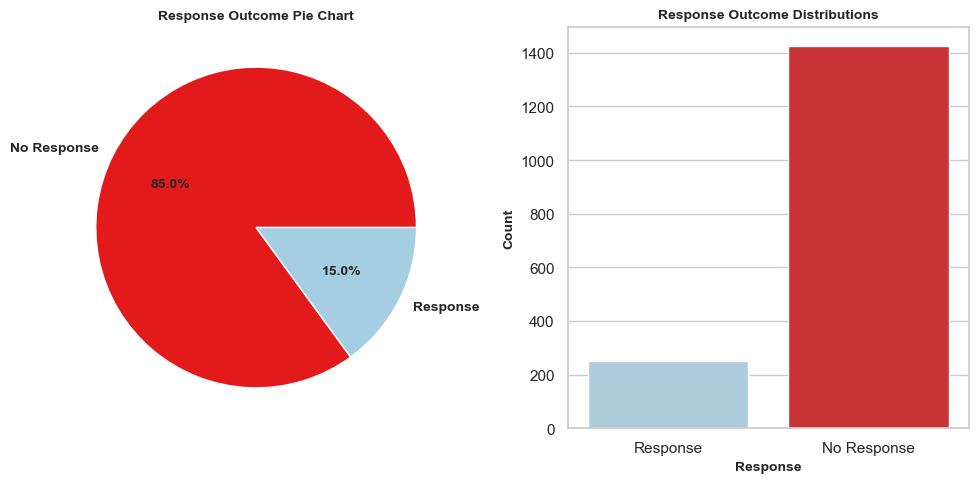

In [124]:
fig = plt.figure(figsize = (10, 5))

plt.subplot(121)
plt.pie(y_train.value_counts(),
        labels = ['No Response', 'Response'], 
        autopct = '%.1f%%', 
        radius = 1, 
        colors=["#e31a1c", "#a6cee3"],
        textprops={'fontsize': 10, 'fontweight': 'bold'})
plt.title('Response Outcome Pie Chart', fontsize = 10, fontweight = 'bold')

plt.subplot(122)
resp = y_train.apply(lambda x: "No Response" if x == 0 else "Response")
t = sns.countplot(x=resp, palette=["#a6cee3", "#e31a1c"])
t.set_xlabel('Response', fontweight = 'bold', fontsize = 10)
t.set_ylabel('Count', fontweight = 'bold', fontsize = 10)

plt.title('Response Outcome Distributions', fontsize = 10, fontweight = 'bold')
plt.tight_layout()

In [125]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler, SMOTE

print('Before OverSampling, the shape of X_train: {}'.format(X_train.shape))
print('Before OverSampling, the shape of y_train: {} \n'.format(y_train.shape))

print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1))) # Response
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0))) # No Response

# Undersampling
# us = RandomUnderSampler(sampling_strategy = 0.5)
# X_balanced_res, y_balanced_res = us.fit_resample(X_train,y_train)

# Oversampling
# os = RandomOverSampler(sampling_strategy = 0.5)
# X_balanced_res, y_balanced_res = os.fit_resample(X_train,y_train)

# Oversampling SMOTE
sm = SMOTE(sampling_strategy=0.5, random_state = 2)
X_balanced_res, y_balanced_res = sm.fit_resample(X_train,y_train)

print('After OverSampling, the shape of X_train: {}'.format(X_balanced_res.shape))
print('After OverSampling, the shape of y_train: {} \n'.format(y_balanced_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_balanced_res == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_balanced_res == 0)))

X_train = X_balanced_res
y_train = y_balanced_res

Before OverSampling, the shape of X_train: (1677, 16)
Before OverSampling, the shape of y_train: (1677,) 

Before OverSampling, counts of label '1': 251
Before OverSampling, counts of label '0': 1426 

After OverSampling, the shape of X_train: (2139, 16)
After OverSampling, the shape of y_train: (2139,) 

After OverSampling, counts of label '1': 713
After OverSampling, counts of label '0': 1426


# **====== STAGE 3 ======**
`Stage 3 (ML Modelling & Evaluation)`

# **🔥 Modelling & Evaluation 🔥**

## **📌 Machine Learning Techniques**

Here are some algorithms that will be tested to determine the best model to predict customer response in Marketing Campign:
1. Decision Tree
2. Random Forest
3. Logistic Regression
4. Gaussian Naive Bayes
5. K-Nearest Neighbor
6. MLP Classifier (Neural Network)
7. Adaboost Classifier
8. XGBoost Classifier
9. Gradient Boosting Classifier
10. Support Vector Machine

**Target Explanation**

> * `True Positive (TP)`, when a case was positive and predicted positive
> * `False Positive (FP)`, when a case was negative but predicted positive
> * `True Negative (TN)`, when a case was negative and predicted negative
> * `False Negative (FN)`, when a case was positive but predicted negative

> * `Positive / 1` = Customer yang Response
> * `Negative / 0` = Customer yang tidak Response

> * `False Negative` = Customer yang Response tetapi diprediksi tidak Response
> * `False Positive` = Customer yang tidak Response tetapi diprediksi Response

**Parameter Evaluasi Model**

- `Precision` as Primary Parameter Evaluation

    - Meningkatkan Response Rate 
    - Mereduksi False Positif (Customer yang diprediksi akan merespon, namun kenyataannya tidak)

- `Recall` as Secondary Parameter Evaluation

    - Mengoptimalkan Revenue Rate
    - Mereduksi False Negative (Customer yang diprediksi tidak mengikuti campaign, namun pada kenyataannya berkeinginan ikut campaign)
    
- `F1 Score` for check positif and negative score (Imbalance Data)

**Interpretation**

- `Precision` – What percent of your predictions were correct? :

    Dari test data yang diprediksi positif (Response), berarti x% yg sesungguhnya positif (Response)

- `Recall` – What percent of the positive cases did we catch? :

    Dari semua yang sebenarnya positif (Response), yang berhasil diprediksi positif (Response) x%

**`Target Metrics` =  `Precision` / `Recall` & `F1 Score`**

- `Precision` adalah rasio prediksi benar positif dibandingkan dengan keseluruhan hasil yang diprediksi positf. Pilih algoritma yang memiliki `Precision` tinggi, jika skenario yang dipilih adalah `False Negative lebih baik terjadi daripada False Positif`.

    `Precission = (TP) / (TP+FP)`

- `Recall` adalah rasio kasus dengan prediksi benar positif dibandingkan dengan keseluruhan data yang benar positif. Pilih algoritma yang memiliki `Recall` tinggi, jika skenario yang dipilih adalah `False Positive lebih baik terjadi daripada False Negative`.
    
    `Recall = (TP) / (TP + FN)`

- `F1-Score` atau dikenal juga dengan nama F-Measure didapatkan dari perbandingan rata-rata presisi dengan recall yang dibobotkan

    `F1 Score = 2 * (Recall*Precission) / (Recall + Precission)`


**Description Classification Report :**

It is a python method under sklearn metrics API, useful when we need class-wise metrics alongside global metrics. It provides precision, recall, and F1 score at individual and global levels. 

* The `precision` will be "how many are correctly classified among that class" ( Percentage of correct positive predictions relative to total positive predictions.)

* The `recall` means "how many of this class you find over the whole number of element of this class". (Percentage of correct positive predictions relative to total actual positives.)

* The `f1-score` is the harmonic mean between precision & recall. The closer to 1, the better the model.

* The `support` is the number of occurence of the given class in dataset. These values simply tell us how many players belonged to each class in the test dataset. (to check balanced dataset/Proportion)

* `Accuracy` is The sum of the true positives and true negatives over the total number of samples.

* `Macro Average` is The mean average of the precision/recall/F1-score of all the classes.

* `Weighted Average` is Calculates the scores for each class independent of one another but when it adds them together it takes into account the number of true classifications of each class.


**References**

- https://rey1024.medium.com/mengenal-accuracy-precission-recall-dan-specificity-serta-yang-diprioritaskan-b79ff4d77de8
- https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html
- https://www.statology.org/sklearn-classification-report/
- https://muthu.co/understanding-the-classification-report-in-sklearn/#:~:text=A%20Classification%20report%20is%20used,classification%20report%20as%20shown%20below.

In [126]:
from sklearn.linear_model import LogisticRegression #logistic regression
from sklearn.naive_bayes import GaussianNB #gaussian naive bayes
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier #decision tree
from sklearn.ensemble import RandomForestClassifier #random forest
from sklearn.neighbors import KNeighborsClassifier #k-nearest neighbor
from sklearn.svm import SVC # Support Vector Machine/Classifier
from sklearn.neural_network import MLPClassifier #neural network
from sklearn.ensemble import GradientBoostingClassifier #gradient boosting
from xgboost import XGBClassifier #xgboost
from sklearn.ensemble import AdaBoostClassifier #Adaboost

from sklearn import metrics
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve #roc score
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.inspection import permutation_importance
import shap

from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from scipy.stats import uniform

import warnings
warnings.filterwarnings('ignore')

## **📌 Function for Model Evaluation**

In [127]:
train_classifier_list = []
train_modelname_list = []
train_accuracy_list = []
train_precision_list = []
train_recall_list = []
train_f1_score_list= [] 
train_roc_auc_score_list = []
train_cross_val_f1_list = []
train_cross_val_rocauc_list = []

test_classifier_list = []
test_modelname_list = []
test_accuracy_list = []
test_precision_list = []
test_recall_list = []
test_f1_score_list= [] 
test_roc_auc_score_list = []
test_cross_val_f1_list = []
test_cross_val_rocauc_list = []

In [128]:
from sklearn.utils import shuffle
from sklearn.model_selection import KFold
X_s, y_s = shuffle(X, y, random_state=42)
kf = KFold(10, shuffle=True, random_state=0)

In [129]:
def eval_classification(model, model_name, save=True):
    # predict train
    y_train_pred = model.predict(X_train)
    y_train_pred_prob = model.predict_proba(X_train)
    
    # predict test
    y_test_pred = model.predict(X_test)
    y_test_pred_prob = model.predict_proba(X_test)
    
    # cross validation
    cv_score_f1 = cross_validate(model, X_s, y_s, cv=kf, scoring='f1', return_train_score=True)
    cv_score_rocauc = cross_validate(model, X_s, y_s, cv=kf, scoring='roc_auc', return_train_score=True)
    
    
    accuracy_train = round(accuracy_score(y_train, y_train_pred), 3)
    precision_train = round(precision_score(y_train, y_train_pred), 3)
    recall_train = round(recall_score(y_train, y_train_pred), 3)
    f1_s_train = round(f1_score(y_train, y_train_pred), 3)
    csf_score_train = round(cv_score_f1['train_score'].mean(), 3)
    rocauc_score_train = round(roc_auc_score(y_train, y_train_pred_prob[:, 1]), 3)
    csr_score_train = round(cv_score_rocauc['train_score'].mean(), 3)
    
    accuracy_test = round(accuracy_score(y_test, y_test_pred), 3)
    precision_test = round(precision_score(y_test, y_test_pred), 3)
    recall_test = round(recall_score(y_test, y_test_pred), 3)
    f1_s_test = round(f1_score(y_test, y_test_pred), 3)
    csf_score_test = round(cv_score_f1['test_score'].mean(), 3)
    rocauc_score_test = round(roc_auc_score(y_test, y_test_pred_prob[:, 1]), 3)
    csr_score_test = round(cv_score_rocauc['test_score'].mean(), 3)
    
    if save :
    
        # save report detail train
        train_classifier_list.append(model)
        train_modelname_list.append(model_name)
        train_accuracy_list.append(accuracy_train)
        train_precision_list.append(precision_train)
        train_recall_list.append(recall_train)
        train_f1_score_list.append(f1_s_train)
        train_cross_val_f1_list.append(csf_score_train)
        train_roc_auc_score_list.append(rocauc_score_train)
        train_cross_val_rocauc_list.append(csr_score_train)

        # save report detail test
        test_classifier_list.append(model)
        test_modelname_list.append(model_name)
        test_accuracy_list.append(accuracy_test)
        test_precision_list.append(precision_test)
        test_recall_list.append(recall_test)
        test_f1_score_list.append(f1_s_test)
        test_cross_val_f1_list.append(csf_score_test)
        test_roc_auc_score_list.append(rocauc_score_test)
        test_cross_val_rocauc_list.append(csr_score_test)
    
    
    metrics_summary = pd.DataFrame({
        'Evaluation Metrics' : ["Accuracy", "Precision", "Recall", "F1 Score", "F1 Score (crossval)", "ROC AUC", "ROC AUC (crossval)"],
        'Train' : [accuracy_train, precision_train, recall_train, f1_s_train, csf_score_train, rocauc_score_train, csr_score_train],
        'Test' : [accuracy_test, precision_test, recall_test, f1_s_test, csf_score_test, rocauc_score_test, csr_score_test]})
    
    metrics_summary["Diff Range"] = metrics_summary['Train'] - metrics_summary['Test']
    return metrics_summary.reset_index(drop = True).style.background_gradient(cmap='Purples')
    
# define function to see the best tuning hyperparameter 
def show_best_hyperparameter(model):
    print(model.best_estimator_.get_params())

In [130]:
def model_eval_train(classifier, model_name, X_train, y_train):
    # predict data train
    y_train_pred = classifier.predict(X_train)
    y_train_pred_prob = classifier.predict_proba(X_train)

    # print classification report
    print('Classification Report Training Model ('+model_name+'):\n')
    accuracy = round(accuracy_score(y_train, y_train_pred), 3)
    precision = round(precision_score(y_train, y_train_pred), 3)
    recall = round(recall_score(y_train, y_train_pred), 3)
    f1_s = round(f1_score(y_train, y_train_pred), 3)
    rocauc_score = round(roc_auc_score(y_train, y_train_pred_prob[:, 1]), 3)
    
    # c_val_score = round(cross_val_score(classifier, X_s, y_s, cv=kf, scoring='roc_auc').mean()  , 3)
    cv_score_f1 = cross_validate(classifier, X_s, y_s, cv=kf, scoring='f1', return_train_score=True)
    csf_score = round(cv_score_f1['train_score'].mean(), 3)
    
    cv_score_rocauc = cross_validate(classifier, X_s, y_s, cv=kf, scoring='roc_auc', return_train_score=True)
    csr_score = round(cv_score_rocauc['train_score'].mean(), 3)
    
    print(f'Accuracy = {accuracy}')
    print(f'Precision = {precision}')
    print(f'Recall = {recall}')
    print(f'F1 Score = {f1_s}')
    print(f'Cross Val F1 (k=5) = {csf_score}')
    print(f'ROC AUC = {rocauc_score}')
    print(f'Cross Val ROC AUC (k=5) = {csr_score}\n')

    print(classification_report(y_train, y_train_pred))

    # form confusion matrix as a dataFrame
    conf_matrix = pd.DataFrame((confusion_matrix(y_train, y_train_pred)), ('No Response', 'Response'), ('No Response', 'Response'))
    tn, fp, fn, tp = confusion_matrix(y_train, y_train_pred).ravel()

    print("==== Actual Data (Train) =====")
    print("Total =", len(y_train))
    print("No Response =", len(y_train[y_train == 0]))
    print("Response =", len(y_train[y_train == 1]))
    print("==== Predicted Data (Train) =====")
    print("TP = {}, FP = {}, TN = {}, FN = {}".format(tp, fp, tn, fn))
    print("Predictly Correct =", tn+tp)
    print("Predictly Wrong =", fn+fp, "\n")

    # plot confusion matrix
    plt.figure(figsize=[8,5])
    heatmap = sns.heatmap(conf_matrix, annot=True, annot_kws={'size': 13}, fmt='d', cmap='PuBu')
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=13)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=13)

    plt.title('Confusion Matrix for Training Model ('+model_name+')\n', fontsize=13, color='black')
    plt.ylabel('Actual Label', fontsize=13)
    plt.xlabel('\nPredicted Label', fontsize=13)
    plt.show()
    print("\n")

    # ROC AUC Curve
    plt.figure(figsize=[8,5])
    fpr, tpr, threshold = roc_curve(y_train, y_train_pred_prob[:, 1])
    plt.plot(fpr, tpr, label = model_name+' (Area (Score) = %0.2f)'%rocauc_score)
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([0.0,1.0])
    plt.ylim([0.0,1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Customer Purchase Deposit')
    plt.legend(loc="lower right")
    plt.show()

In [131]:
def model_eval_test(classifier, model_name, X_test, y_test):

     # predict data test
    y_test_pred = classifier.predict(X_test)
    y_test_pred_prob = classifier.predict_proba(X_test)
    

    # print classification report
    print('Classification Report Testing Model ('+model_name+'):\n')
    accuracy = round(accuracy_score(y_test, y_test_pred), 3)
    precision = round(precision_score(y_test, y_test_pred), 3)
    recall = round(recall_score(y_test, y_test_pred), 3)
    f1_s = round(f1_score(y_test, y_test_pred), 3)
    rocauc_score = round(roc_auc_score(y_test, y_test_pred_prob[:, 1]), 3)
    
    # c_val_score = round(cross_val_score(classifier, X_s, y_s , cv=kf , scoring='roc_auc').mean()  , 3)
    cv_score_f1 = cross_validate(classifier, X_s, y_s, cv=kf, scoring='f1', return_train_score=True)
    csf_score = round(cv_score_f1['test_score'].mean(), 3)
    
    cv_score_rocauc = cross_validate(classifier, X_s, y_s, cv=kf, scoring='roc_auc', return_train_score=True)
    csr_score = round(cv_score_rocauc['test_score'].mean(), 3)
    
    print(f'Accuracy = {accuracy}')
    print(f'Precision = {precision}')
    print(f'Recall = {recall}')
    print(f'F1 Score = {f1_s}')
    print(f'Cross Val F1 (k=5) = {csf_score}')
    print(f'ROC AUC = {rocauc_score}')
    print(f'Cross Val ROC AUC (k=5) = {csr_score}\n')
    
    print(classification_report(y_test, y_test_pred))

    # form confusion matrix as a dataFrame
    conf_matrix = pd.DataFrame((confusion_matrix(y_test, y_test_pred)), ('No Response', 'Response'), ('No Response', 'Response'))
    tn, fp, fn, tp = confusion_matrix(y_test, y_test_pred).ravel()

    print("==== Actual Data (Test) =====")
    print("Total =", len(y_test))
    print("No Response =", len(y_test[y_test == 0]))
    print("Response =", len(y_test[y_test == 1]))
    print("==== Predicted Data (Test) =====")
    print("TP = {}, FP = {}, TN = {}, FN = {}".format(tp, fp, tn, fn))
    print("Predictly Correct =", tn+tp)
    print("Predictly Wrong =", fn+fp, "\n")

    # plot confusion matrix
    plt.figure(figsize=[8,5])
    heatmap = sns.heatmap(conf_matrix, annot=True, annot_kws={'size': 13}, fmt='d', cmap='PuBuGn')
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=13)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=13)

    plt.title('Confusion Matrix for Testing Model ('+model_name+')\n', fontsize=13, color='black')
    plt.ylabel('Actual Label', fontsize=13)
    plt.xlabel('\nPredicted Label', fontsize=13)
    plt.show()
    print("\n")

    # ROC AUC Curve
    plt.figure(figsize=[8,5])
    fpr, tpr, threshold = roc_curve(y_test, y_test_pred_prob[:, 1])
    plt.plot(fpr, tpr, label = model_name+' (Area (Score) = %0.2f)'%rocauc_score)
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([0.0,1.0])
    plt.ylim([0.0,1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Customer Purchase Deposit')
    plt.legend(loc="lower right")
    plt.show()

In [132]:
def feature_importance_plot(classifier, model_name, X_train=None):
    
    model_name = model_name.replace(" (HT)", "")
    model_name = model_name.replace(" (HT2)", "")
    
    # important features
    # K-Nearest Neighbors/MLP Classifier = No Function/Method to Check Feature Importance
    if model_name == "Logistic Regression":
        # Logistic Regression
        imp = pd.DataFrame(data={
            'Attribute': X_train.columns,
            'Importance': log_model.coef_[0]
        })
        imp = imp.sort_values(by='Importance', ascending=False).set_index("Attribute")
        ft_imp = imp["Importance"]
    elif model_name in ["Naive Bayes", "K-Nearest Neighbors", "MLP Classifier", "Support Vector Machine"]:
        imp = pd.DataFrame(data={
            'Attribute': X_train.columns,
            'Importance': permutation_importance(classifier, X_test, y_test).importances_mean
        })
        imp = imp.sort_values(by='Importance', ascending=False).set_index("Attribute")
        ft_imp = imp["Importance"]
    else: 
        # Decision Tree
        # Random Forest
        # XGBoost Classifier
        # Gradient Boosting Classifier
        ft_imp = classifier.feature_importances_

    importances = pd.Series(ft_imp, index=X.columns).sort_values(ascending=False)

    plt.figure(figsize=(10,7))
    fig = importances.plot(kind ='barh', color='#7faadb', width=0.8)
    plt.title('Features Importance Plot '+model_name+'\n', fontsize=14)

    # Annotate every single Bar with its value, based on it's width   
    N = len(importances)
    thickness = range(1, N+1)
    thick_sum = sum(thickness) 
    barmax = max(importances) 
    for i, p in enumerate(fig.patches):
            fig.annotate("%.2f" % (p.get_width()),
                        (p.get_x() + p.get_width(), p.get_y() + 1),
                        xytext=(5, 15), textcoords='offset points')
            fig.set_ylim(N, -1)
            fig.set_xlim(0,barmax*1.4)

    fig.figure.tight_layout()
    plt.show()

In [133]:
def shap_plot(model, model_name, data=None):
    
    model_name = model_name.replace(" (HT)", "")
    model_name = model_name.replace(" (HT2)", "")
    tree = ["Decision Tree", "Random Forest", 
            "XGBoost Classifier", "Gradient Boosting Classifier"]

    shap.initjs()
    
    if model_name in tree:
        
        if model_name in ["XGBoost Classifier", "Gradient Boosting Classifier"] :
            explainer = shap.TreeExplainer(model)
            shap_values = explainer.shap_values(data)
            expected = explainer.expected_value
        else:
            explainer = shap.TreeExplainer(model)
            shap_values = explainer.shap_values(data)[1]
            expected = explainer.expected_value[1]
        

        fig = plt.figure()
        ax0 = fig.add_subplot(121)
        shap.summary_plot(shap_values, data, show = False) 
        ax1 = fig.add_subplot(122)
        shap.summary_plot(shap_values, data, plot_type='bar', show = False, cmap = "plasma")
        plt.gcf().set_size_inches(20,8)
        plt.tight_layout() 
        plt.show()

        return shap.force_plot(expected, shap_values[0], data.iloc[0,:], plot_cmap = "PkYg", show = False)

    else :
        explainer = shap.Explainer(model.predict, data)
        shap_values = explainer(data)

        fig = plt.figure()
        ax0 = fig.add_subplot(121)
        shap.summary_plot(shap_values.values, data, show = False) 
        ax1 = fig.add_subplot(122)
        shap.summary_plot(shap_values.values, data, plot_type='bar', show = False, cmap = "plasma")
        plt.gcf().set_size_inches(20,8)
        plt.tight_layout() 
        plt.show()

        return shap.force_plot(shap_values.base_values[0], shap_values.values[0], data.iloc[0,:], plot_cmap = "PkYg", show = False)

## **📌 Modelling**

Pada tahap awal modelling ini, kami  menggunakan beberapa algoritma Machine Learning. Harapannya agar output model comparison yang dihasilkan lebih kaya dan decision yang dipilih lebih akurat.

### **1. Decision Tree**

Decision tree membagi data berdasarkan serangkaian keputusan yang dibuat pada fitur-fitur. Setiap node internal pada pohon keputusan mewakili keputusan berdasarkan fitur-fitur tersebut, sedangkan daun pohon mewakili label atau kelas hasil klasifikasi.

In [134]:
# train the model
dt_model = DecisionTreeClassifier(random_state=42).fit(X_train,y_train)
print(dt_model)
eval_classification(dt_model, "Decision Tree")

DecisionTreeClassifier(random_state=42)


,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.997000,0.823000,0.174000
1,Precision,1.000000,0.417000,0.583000
2,Recall,0.990000,0.482000,0.508000
3,F1 Score,0.995000,0.447000,0.548000
4,F1 Score (crossval),0.972000,0.477000,0.495000
5,ROC AUC,1.000000,0.686000,0.314000
6,ROC AUC (crossval),1.000000,0.705000,0.295000


**Observation:** 
- Precision dan Recall memiliki gap cukup besar >0.40
- F1 Score train < F1 Score test dengan gap 0.50

#### **Performance of Training Model**

Classification Report Training Model (Decision Tree):

Accuracy = 0.997
Precision = 1.0
Recall = 0.99
F1 Score = 0.995
Cross Val F1 (k=5) = 0.972
ROC AUC = 1.0
Cross Val ROC AUC (k=5) = 1.0

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1426
           1       1.00      0.99      1.00       713

    accuracy                           1.00      2139
   macro avg       1.00      1.00      1.00      2139
weighted avg       1.00      1.00      1.00      2139

==== Actual Data (Train) =====
Total = 2139
No Response = 1426
Response = 713
==== Predicted Data (Train) =====
TP = 706, FP = 0, TN = 1426, FN = 7
Predictly Correct = 2132
Predictly Wrong = 7 



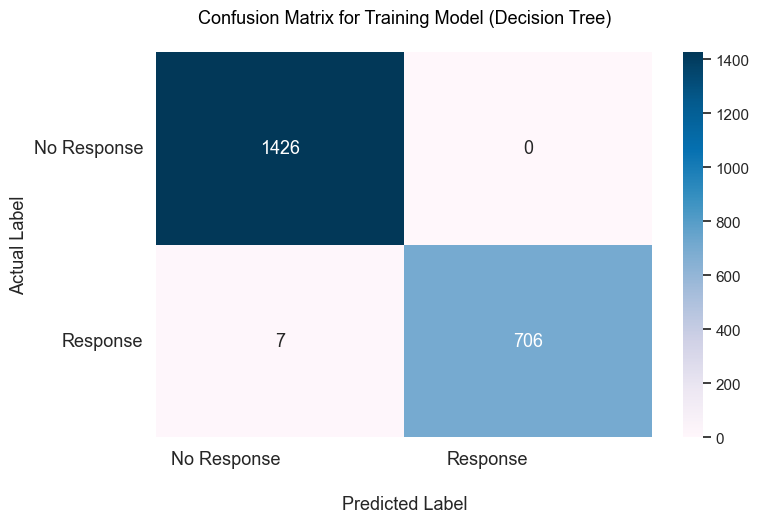

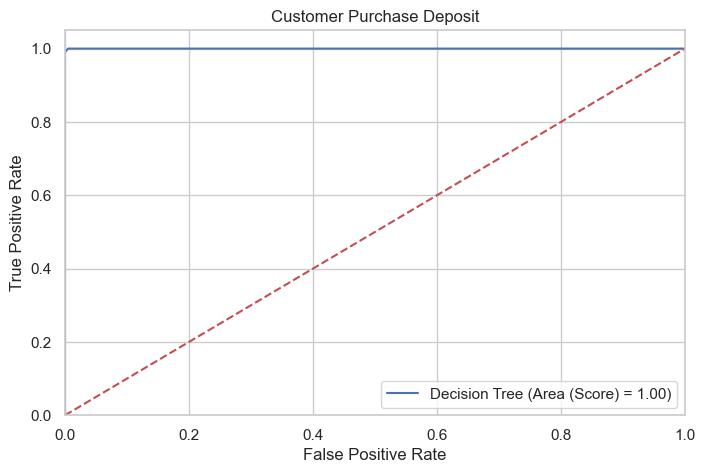

In [135]:
model_eval_train(dt_model, "Decision Tree", X_train, y_train)

#### **Performance of Testing Model**

Classification Report Testing Model (Decision Tree):

Accuracy = 0.823
Precision = 0.417
Recall = 0.482
F1 Score = 0.447
Cross Val F1 (k=5) = 0.477
ROC AUC = 0.686
Cross Val ROC AUC (k=5) = 0.705

              precision    recall  f1-score   support

           0       0.91      0.88      0.89       476
           1       0.42      0.48      0.45        83

    accuracy                           0.82       559
   macro avg       0.66      0.68      0.67       559
weighted avg       0.83      0.82      0.83       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 40, FP = 56, TN = 420, FN = 43
Predictly Correct = 460
Predictly Wrong = 99 



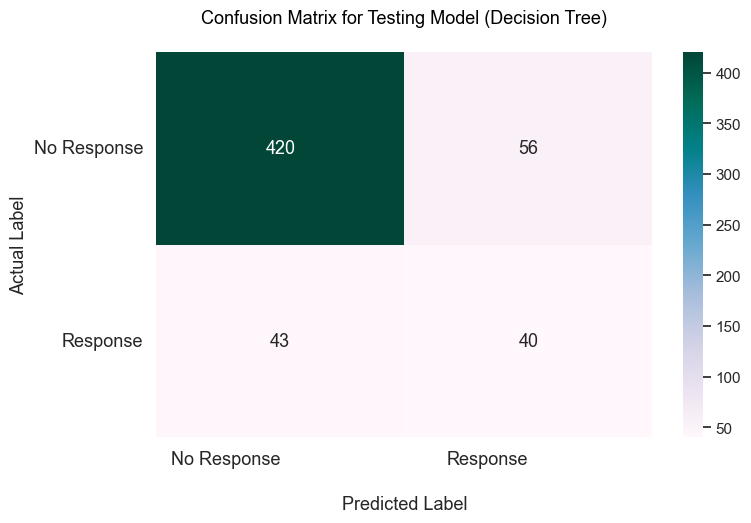

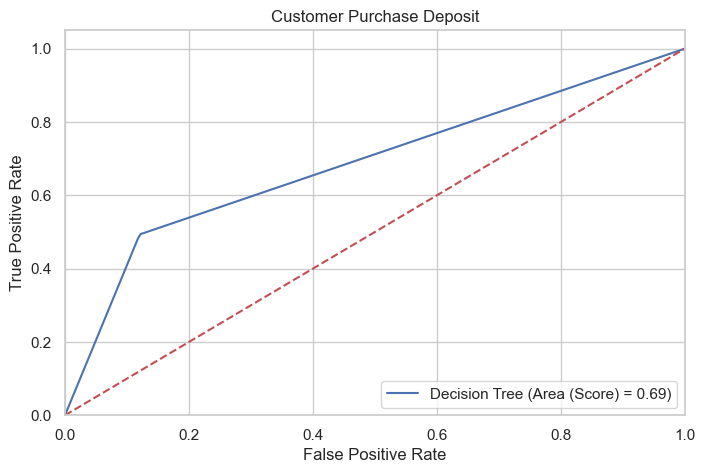

In [136]:
model_eval_test(dt_model, "Decision Tree", X_test, y_test)

In [137]:
acc_dt_train=round(dt_model.score(X_train,y_train)*100,2)
acc_dt_test=round(dt_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_dt_train))
print("Testing Accuracy: {} %".format(acc_dt_test))

Training Accuracy: 99.67 %
Testing Accuracy: 82.29 %


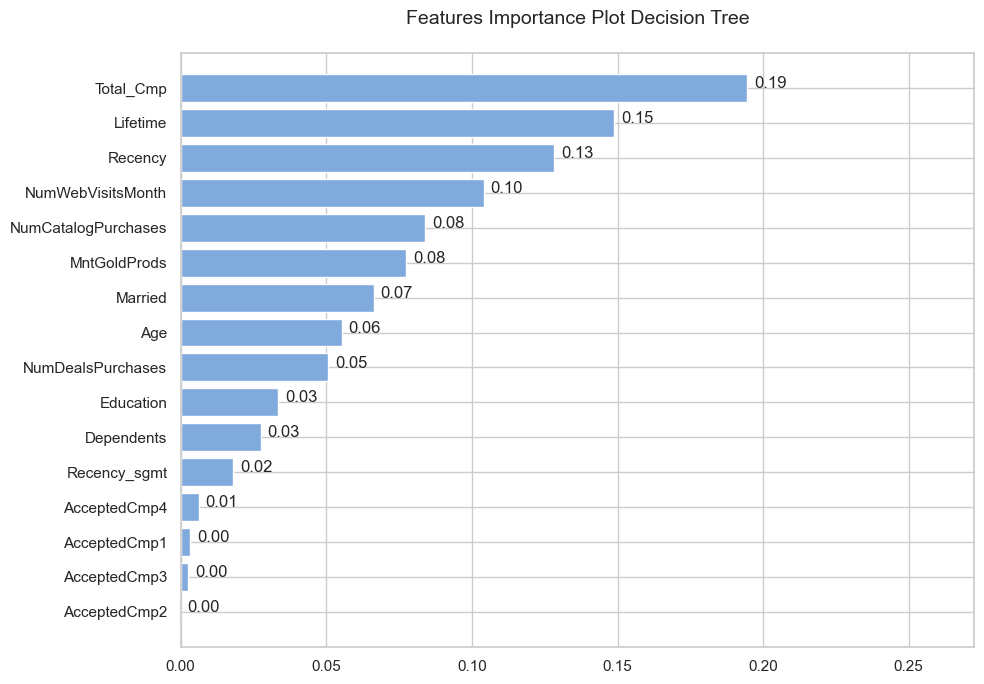

In [138]:
feature_importance_plot(dt_model, "Decision Tree")

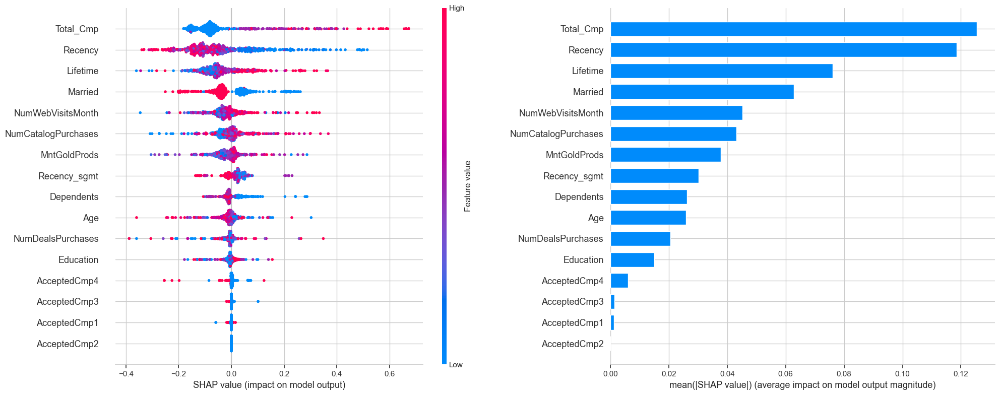

In [139]:
shap_plot(dt_model, "Decision Tree", X_test)

### **2. Random Forest**

Metode ini menggabungkan prediksi dari beberapa decision tree untuk menghasilkan prediksi akhir yang lebih stabil dan akurat.

In [140]:
# train the model
rf_model = RandomForestClassifier(random_state=42).fit(X_train, y_train)
print(rf_model)
eval_classification(rf_model, "Random Forest")

RandomForestClassifier(random_state=42)


,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.997000,0.898000,0.099000
1,Precision,0.996000,0.686000,0.310000
2,Recall,0.994000,0.578000,0.416000
3,F1 Score,0.995000,0.627000,0.368000
4,F1 Score (crossval),0.973000,0.542000,0.431000
5,ROC AUC,1.000000,0.887000,0.113000
6,ROC AUC (crossval),1.000000,0.882000,0.118000


**Observation:** 
- Precision memiliki gap lumayan kecil 0.15
- Recall memiliki gap cukup besar 0.53
- F1 Score train < F1 Score test dengan gap cukup besar 0.40

#### **Performance of Training Model**

Classification Report Training Model (Random Forest):

Accuracy = 0.997
Precision = 0.996
Recall = 0.994
F1 Score = 0.995
Cross Val F1 (k=5) = 0.973
ROC AUC = 1.0
Cross Val ROC AUC (k=5) = 1.0

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1426
           1       1.00      0.99      1.00       713

    accuracy                           1.00      2139
   macro avg       1.00      1.00      1.00      2139
weighted avg       1.00      1.00      1.00      2139

==== Actual Data (Train) =====
Total = 2139
No Response = 1426
Response = 713
==== Predicted Data (Train) =====
TP = 709, FP = 3, TN = 1423, FN = 4
Predictly Correct = 2132
Predictly Wrong = 7 



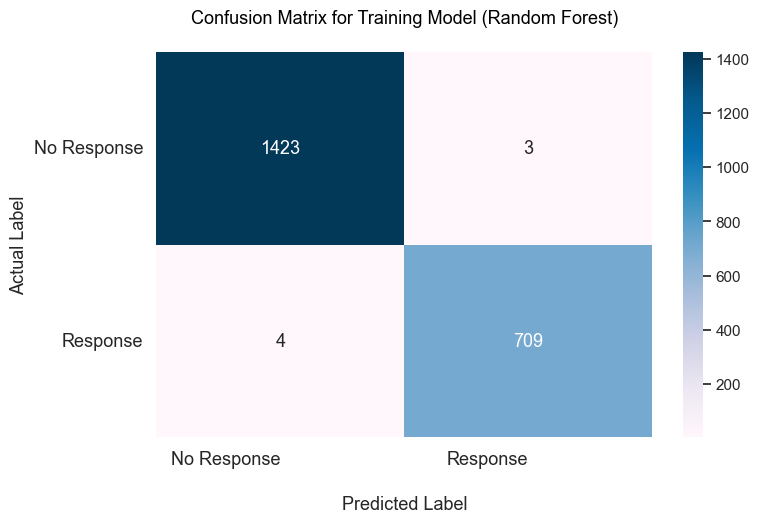

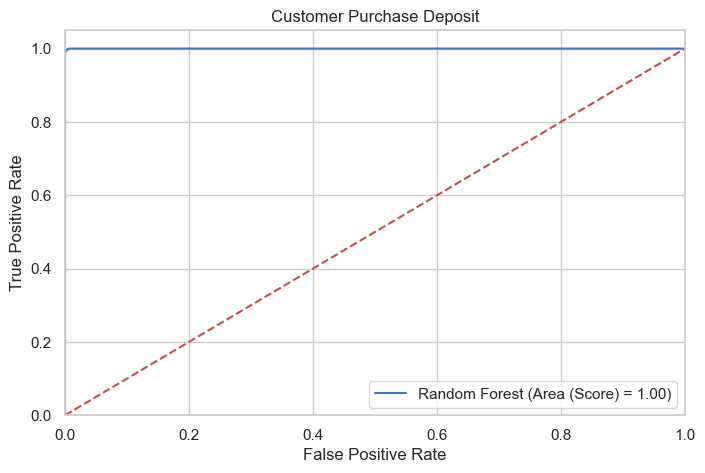

In [141]:
model_eval_train(rf_model, "Random Forest", X_train, y_train)

#### **Performance of Testing Model**

Classification Report Testing Model (Random Forest):

Accuracy = 0.898
Precision = 0.686
Recall = 0.578
F1 Score = 0.627
Cross Val F1 (k=5) = 0.542
ROC AUC = 0.887
Cross Val ROC AUC (k=5) = 0.882

              precision    recall  f1-score   support

           0       0.93      0.95      0.94       476
           1       0.69      0.58      0.63        83

    accuracy                           0.90       559
   macro avg       0.81      0.77      0.78       559
weighted avg       0.89      0.90      0.89       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 48, FP = 22, TN = 454, FN = 35
Predictly Correct = 502
Predictly Wrong = 57 



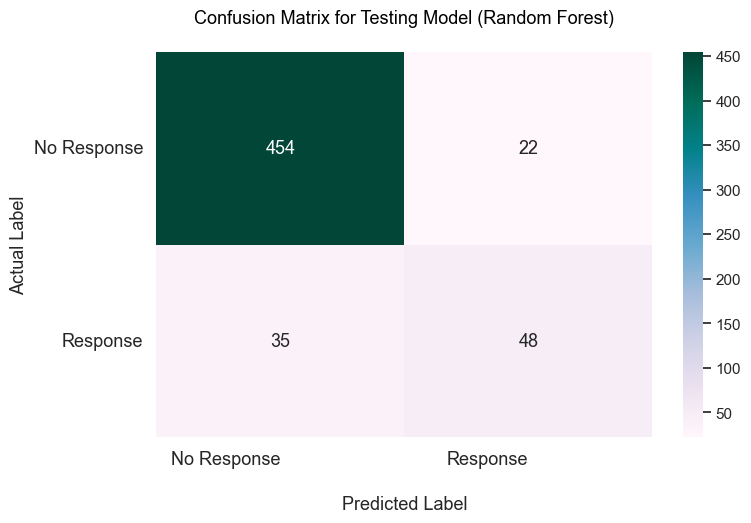

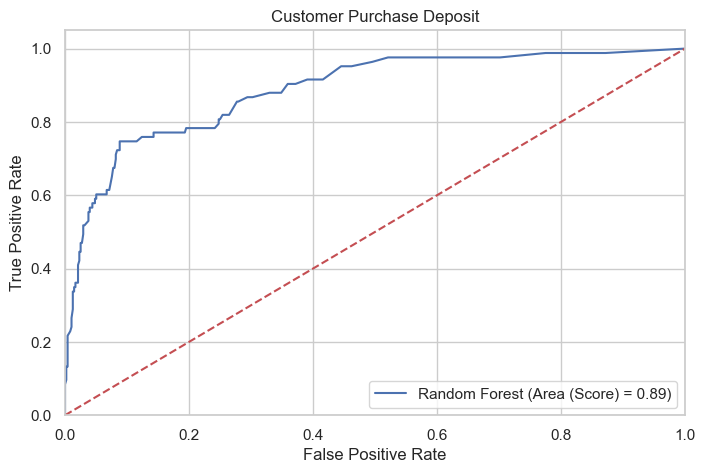

In [142]:
model_eval_test(rf_model, "Random Forest", X_test, y_test)

In [143]:
acc_rf_train=round(rf_model.score(X_train,y_train)*100,2)
acc_rf_test=round(rf_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_rf_train))
print("Test Accuracy: {} %".format(acc_rf_test))

Training Accuracy: 99.67 %
Test Accuracy: 89.8 %


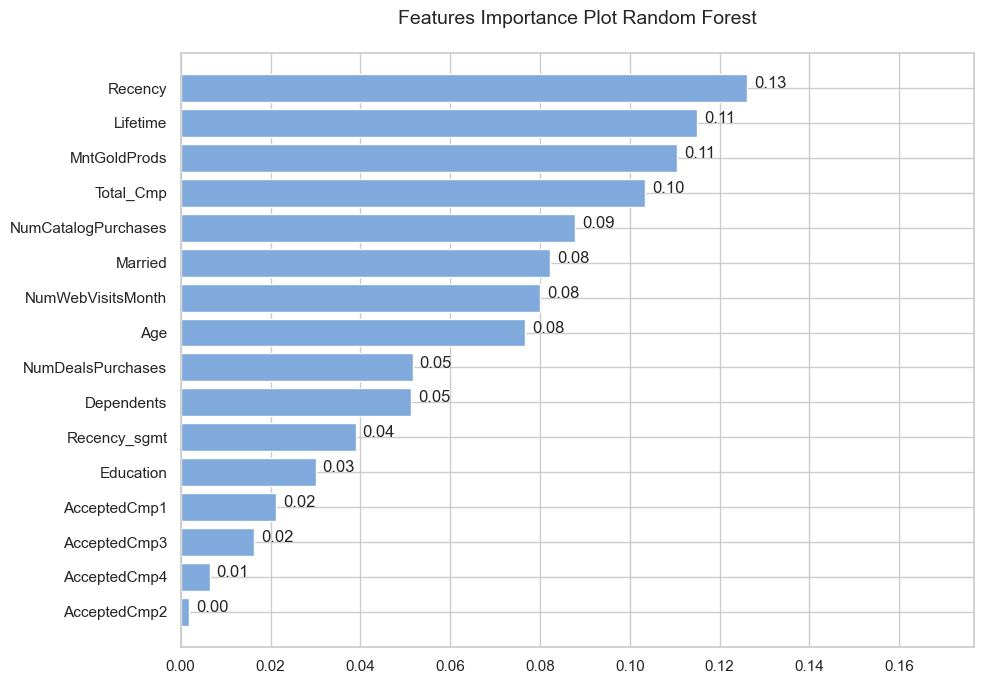

In [144]:
feature_importance_plot(rf_model, "Random Forest")

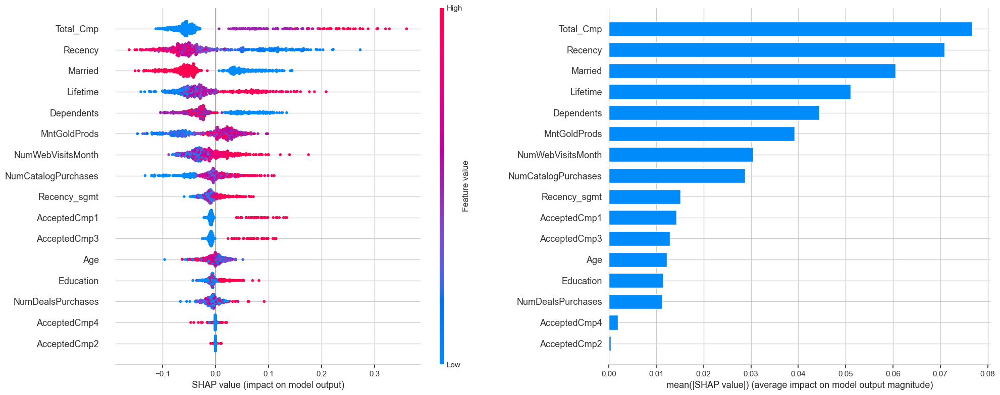

In [145]:
shap_plot(rf_model, "Random Forest", X_test)

### **3. Logistic Regression**

Metode ini digunakan untuk memodelkan hubungan antara variabel independen dan variabel dependen biner atau multi-kategori. Regresi logistik menghasilkan probabilitas kelas sebagai output.

In [146]:
# train the model
log_model = LogisticRegression(solver='lbfgs', max_iter=len(X_train), random_state=42).fit(X_train, y_train)
print(log_model)
eval_classification(log_model, "Logistic Regression")

LogisticRegression(max_iter=2139, random_state=42)


,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.793000,0.859000,-0.066000
1,Precision,0.737000,0.519000,0.218000
2,Recall,0.589000,0.651000,-0.062000
3,F1 Score,0.655000,0.578000,0.077000
4,F1 Score (crossval),0.502000,0.481000,0.021000
5,ROC AUC,0.868000,0.885000,-0.017000
6,ROC AUC (crossval),0.879000,0.876000,0.003000


**Observation:** 
- Precision memiliki gap 0
- Recall memiliki gap cukup kecil under -0.01
- F1 Score train < F1 Score test dengan gap cukup kecil under -0.01

#### **Performance of Training Model**

Classification Report Training Model (Logistic Regression):

Accuracy = 0.793
Precision = 0.737
Recall = 0.589
F1 Score = 0.655
Cross Val F1 (k=5) = 0.502
ROC AUC = 0.868
Cross Val ROC AUC (k=5) = 0.879

              precision    recall  f1-score   support

           0       0.81      0.89      0.85      1426
           1       0.74      0.59      0.65       713

    accuracy                           0.79      2139
   macro avg       0.78      0.74      0.75      2139
weighted avg       0.79      0.79      0.79      2139

==== Actual Data (Train) =====
Total = 2139
No Response = 1426
Response = 713
==== Predicted Data (Train) =====
TP = 420, FP = 150, TN = 1276, FN = 293
Predictly Correct = 1696
Predictly Wrong = 443 



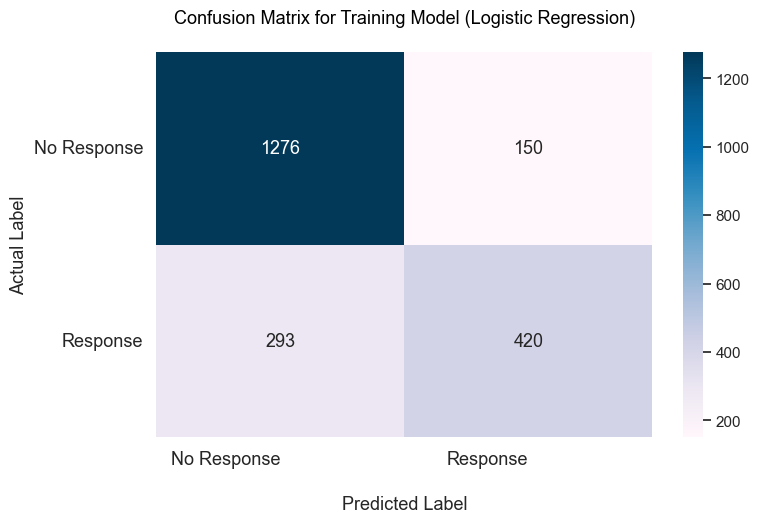

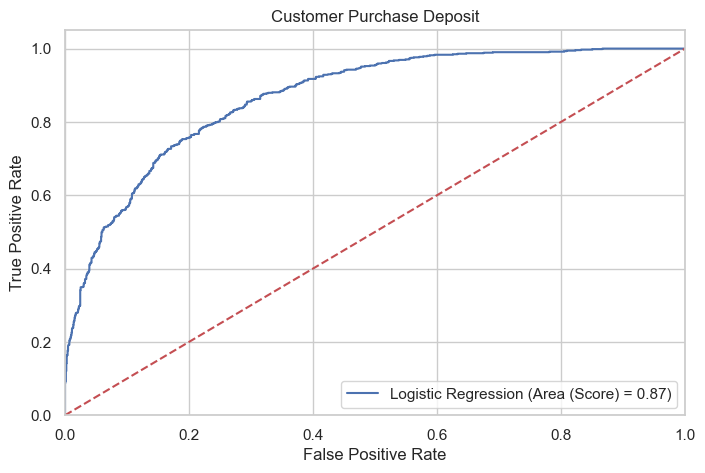

In [147]:
model_eval_train(log_model, "Logistic Regression", X_train, y_train)

#### **Performance of Testing Model**

Classification Report Testing Model (Logistic Regression):

Accuracy = 0.859
Precision = 0.519
Recall = 0.651
F1 Score = 0.578
Cross Val F1 (k=5) = 0.481
ROC AUC = 0.885
Cross Val ROC AUC (k=5) = 0.876

              precision    recall  f1-score   support

           0       0.94      0.89      0.92       476
           1       0.52      0.65      0.58        83

    accuracy                           0.86       559
   macro avg       0.73      0.77      0.75       559
weighted avg       0.87      0.86      0.87       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 54, FP = 50, TN = 426, FN = 29
Predictly Correct = 480
Predictly Wrong = 79 



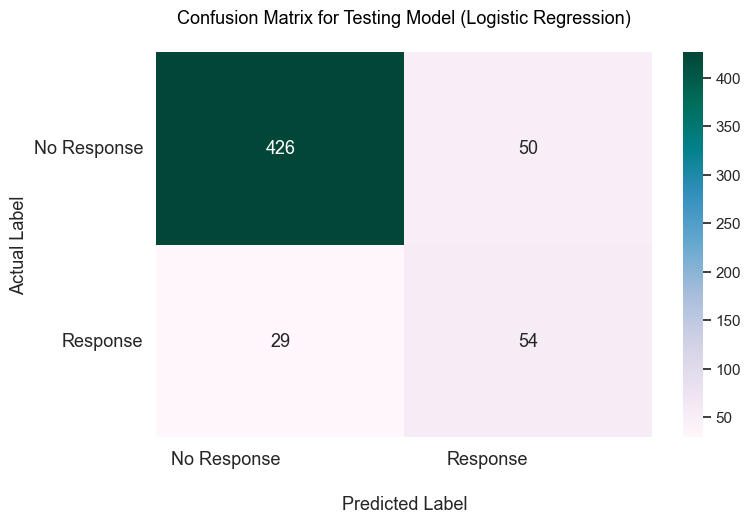

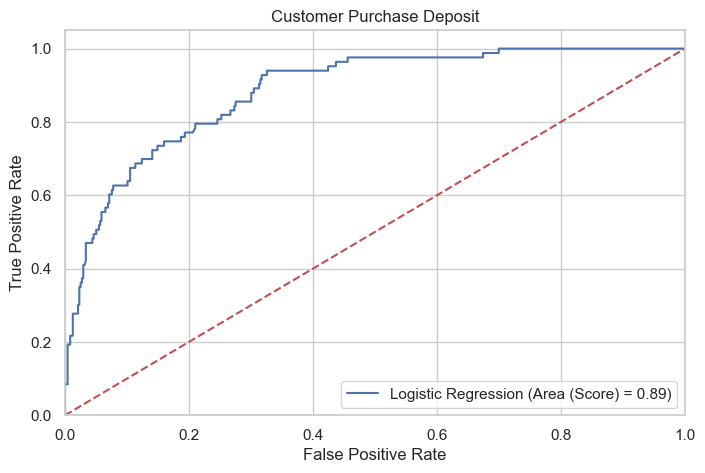

In [148]:
model_eval_test(log_model, "Logistic Regression", X_test, y_test)

In [149]:
acc_log_train=round(log_model.score(X_train,y_train)*100,2)
acc_log_test=round(log_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_log_train))
print("Test Accuracy: {} %".format(acc_log_test))

Training Accuracy: 79.29 %
Test Accuracy: 85.87 %


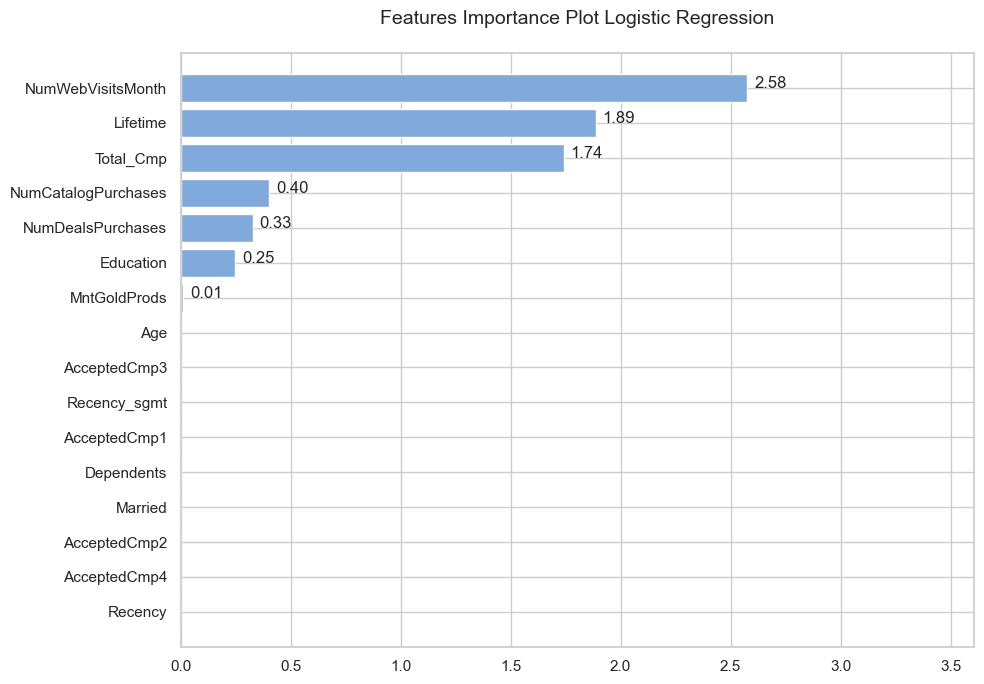

In [150]:
feature_importance_plot(log_model, "Logistic Regression", X_train)

Permutation explainer: 560it [00:29, 14.26it/s]                                                                        


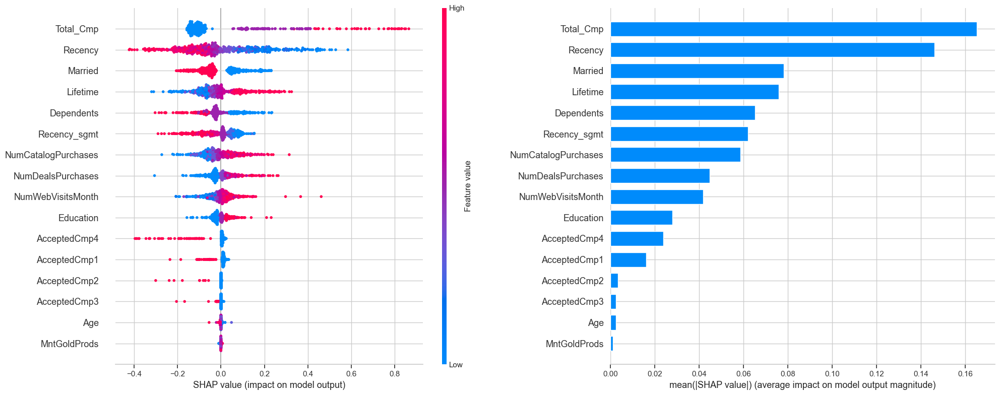

In [151]:
shap_plot(log_model, "Logistic Regression", X_test)

### **4. Naive Bayes**

Metode ini didasarkan pada Teorema Bayes dan mengasumsikan independensi fitur. Naive Bayes menghitung probabilitas kelas berdasarkan probabilitas fitur dan mengambil keputusan berdasarkan probabilitas tertinggi.

In [152]:
# train the model
gnb_model = GaussianNB().fit(X_train, y_train)
print(gnb_model)
eval_classification(gnb_model, "Naive Bayes")

GaussianNB()


,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.736000,0.819000,-0.083000
1,Precision,0.653000,0.413000,0.240000
2,Recall,0.443000,0.518000,-0.075000
3,F1 Score,0.528000,0.460000,0.068000
4,F1 Score (crossval),0.466000,0.466000,0.000000
5,ROC AUC,0.799000,0.832000,-0.033000
6,ROC AUC (crossval),0.826000,0.823000,0.003000


**Observation:** 
- Precision memiliki gap lumayan kecil 0.01
- Recall memiliki gap cukup kecil under -0.01
- F1 Score train < F1 Score test dengan gap 0

#### **Performance of Training Model**

Classification Report Training Model (Naive Bayes):

Accuracy = 0.736
Precision = 0.653
Recall = 0.443
F1 Score = 0.528
Cross Val F1 (k=5) = 0.466
ROC AUC = 0.799
Cross Val ROC AUC (k=5) = 0.826

              precision    recall  f1-score   support

           0       0.76      0.88      0.82      1426
           1       0.65      0.44      0.53       713

    accuracy                           0.74      2139
   macro avg       0.71      0.66      0.67      2139
weighted avg       0.72      0.74      0.72      2139

==== Actual Data (Train) =====
Total = 2139
No Response = 1426
Response = 713
==== Predicted Data (Train) =====
TP = 316, FP = 168, TN = 1258, FN = 397
Predictly Correct = 1574
Predictly Wrong = 565 



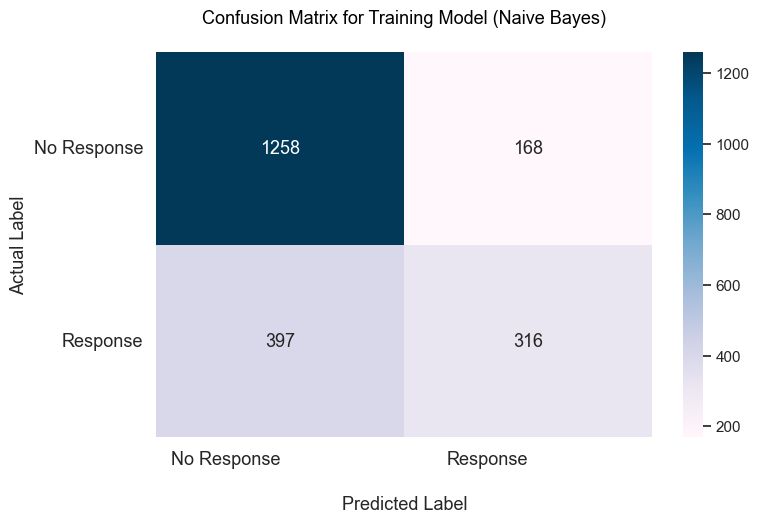

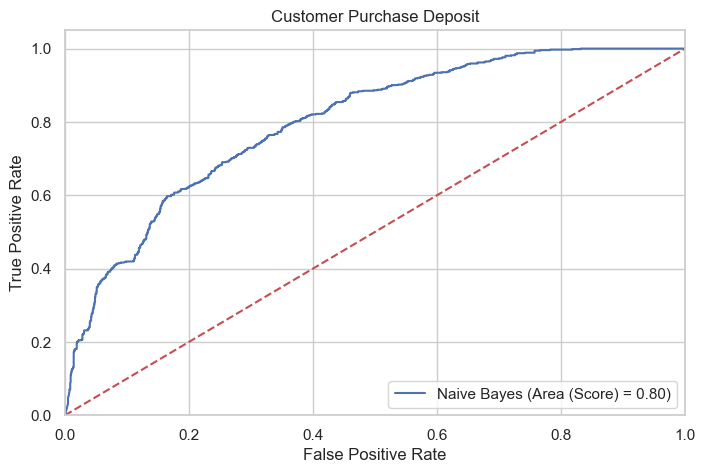

In [153]:
model_eval_train(gnb_model, "Naive Bayes", X_train, y_train)

#### **Performance of Testing Model**

Classification Report Testing Model (Naive Bayes):

Accuracy = 0.819
Precision = 0.413
Recall = 0.518
F1 Score = 0.46
Cross Val F1 (k=5) = 0.466
ROC AUC = 0.832
Cross Val ROC AUC (k=5) = 0.823

              precision    recall  f1-score   support

           0       0.91      0.87      0.89       476
           1       0.41      0.52      0.46        83

    accuracy                           0.82       559
   macro avg       0.66      0.69      0.68       559
weighted avg       0.84      0.82      0.83       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 43, FP = 61, TN = 415, FN = 40
Predictly Correct = 458
Predictly Wrong = 101 



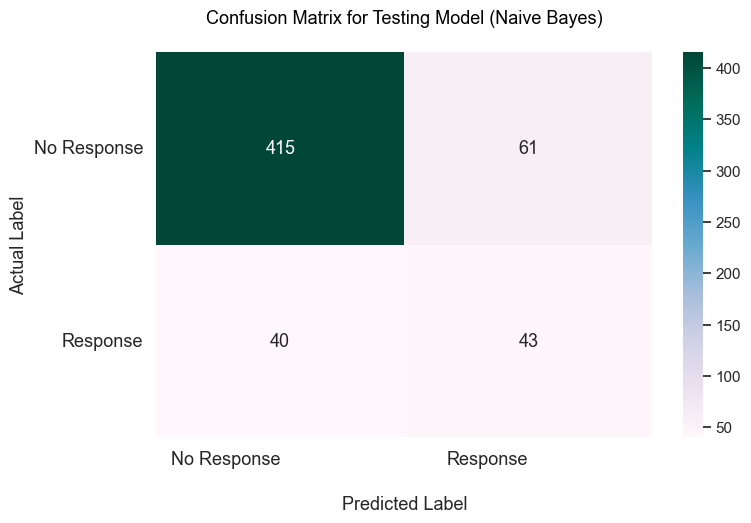

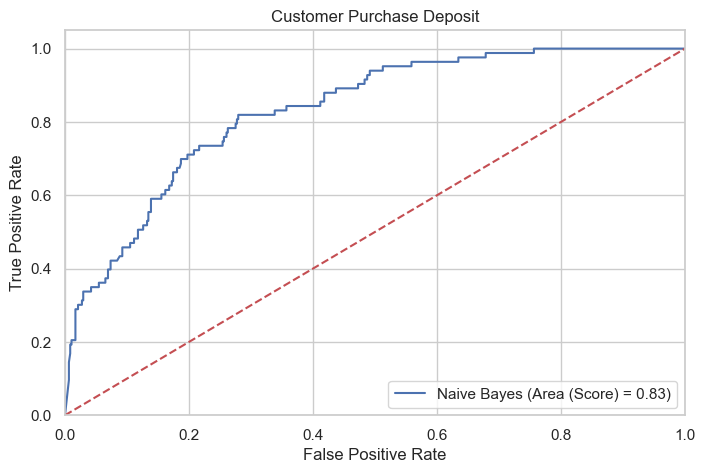

In [154]:
model_eval_test(gnb_model, "Naive Bayes", X_test, y_test)

In [155]:
acc_gnb_train=round(gnb_model.score(X_train,y_train)*100,2)
acc_gnb_test=round(gnb_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_gnb_train))
print("Test Accuracy: {} %".format(acc_gnb_test))

Training Accuracy: 73.59 %
Test Accuracy: 81.93 %


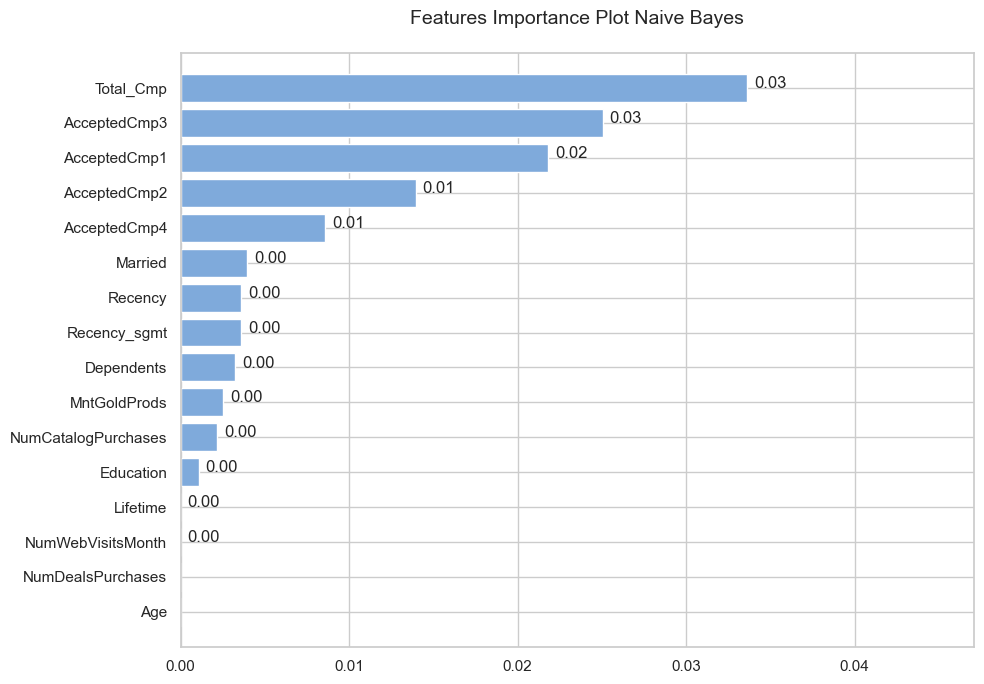

In [156]:
feature_importance_plot(gnb_model, "Naive Bayes", X_train)

Permutation explainer: 560it [00:21, 13.68it/s]                                                                        


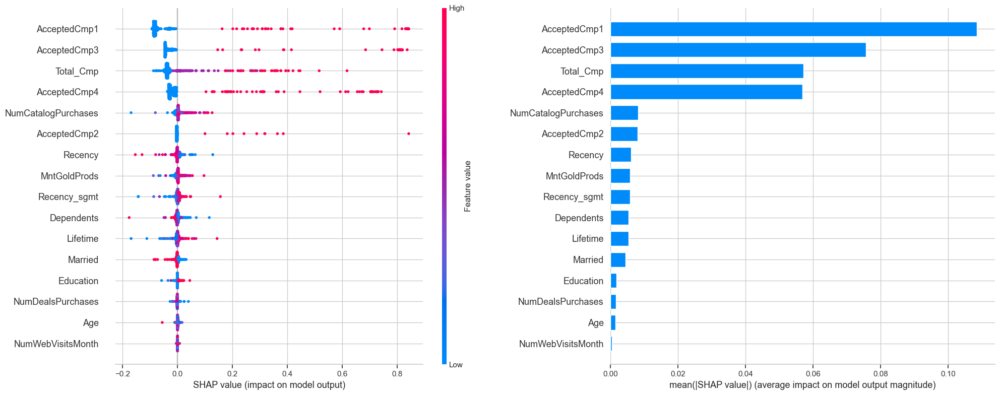

In [157]:
shap_plot(gnb_model, "Naive Bayes", X_test)

### **5. K-Nearest Neighbors**

Memprediksi label data berdasarkan kelas mayoritas dari K tetangga terdekat dalam ruang fitur. K adalah parameter yang menentukan jumlah tetangga yang akan digunakan dalam klasifikasi.

In [158]:
# train the model
knn_model = KNeighborsClassifier().fit(X_train,y_train)
print(knn_model)
eval_classification(knn_model, "K-Nearest Neighbors")

KNeighborsClassifier()


,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.900000,0.810000,0.090000
1,Precision,0.805000,0.403000,0.402000
2,Recall,0.924000,0.578000,0.346000
3,F1 Score,0.860000,0.475000,0.385000
4,F1 Score (crossval),0.595000,0.437000,0.158000
5,ROC AUC,0.970000,0.794000,0.176000
6,ROC AUC (crossval),0.941000,0.782000,0.159000


**Observation:** 
- Precision memiliki gap lumayan kecil 0.09
- Recall memiliki gap lumayan kecil 0.09
- F1 Score train < F1 Score test dengan gap cukup kecil 0.10

#### **Performance of Training Model**

Classification Report Training Model (K-Nearest Neighbors):

Accuracy = 0.9
Precision = 0.805
Recall = 0.924
F1 Score = 0.86
Cross Val F1 (k=5) = 0.595
ROC AUC = 0.97
Cross Val ROC AUC (k=5) = 0.941

              precision    recall  f1-score   support

           0       0.96      0.89      0.92      1426
           1       0.80      0.92      0.86       713

    accuracy                           0.90      2139
   macro avg       0.88      0.91      0.89      2139
weighted avg       0.91      0.90      0.90      2139

==== Actual Data (Train) =====
Total = 2139
No Response = 1426
Response = 713
==== Predicted Data (Train) =====
TP = 659, FP = 160, TN = 1266, FN = 54
Predictly Correct = 1925
Predictly Wrong = 214 



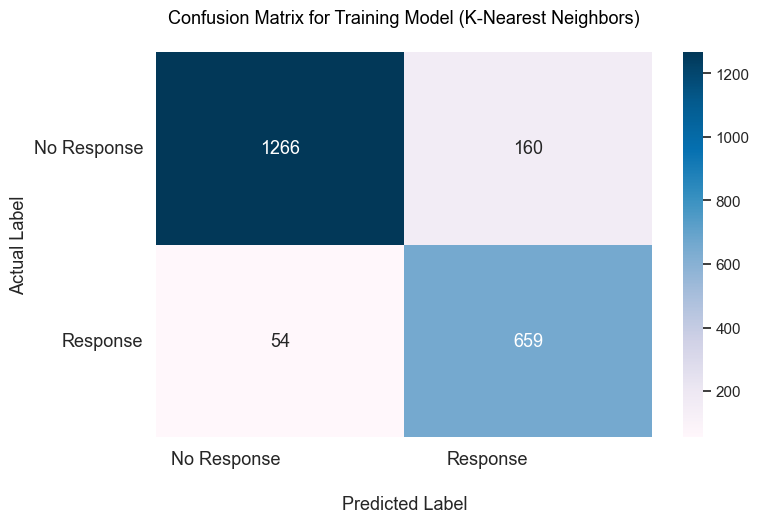

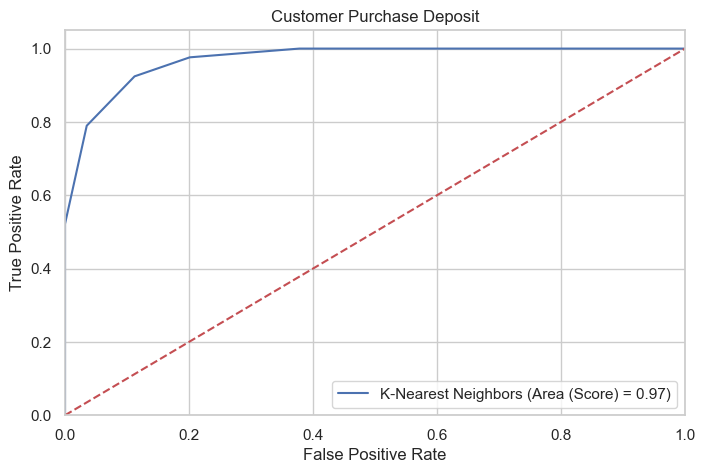

In [159]:
model_eval_train(knn_model, "K-Nearest Neighbors", X_train, y_train)

#### **Performance of Testing Model**

Classification Report Testing Model (K-Nearest Neighbors):

Accuracy = 0.81
Precision = 0.403
Recall = 0.578
F1 Score = 0.475
Cross Val F1 (k=5) = 0.437
ROC AUC = 0.794
Cross Val ROC AUC (k=5) = 0.782

              precision    recall  f1-score   support

           0       0.92      0.85      0.88       476
           1       0.40      0.58      0.48        83

    accuracy                           0.81       559
   macro avg       0.66      0.71      0.68       559
weighted avg       0.84      0.81      0.82       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 48, FP = 71, TN = 405, FN = 35
Predictly Correct = 453
Predictly Wrong = 106 



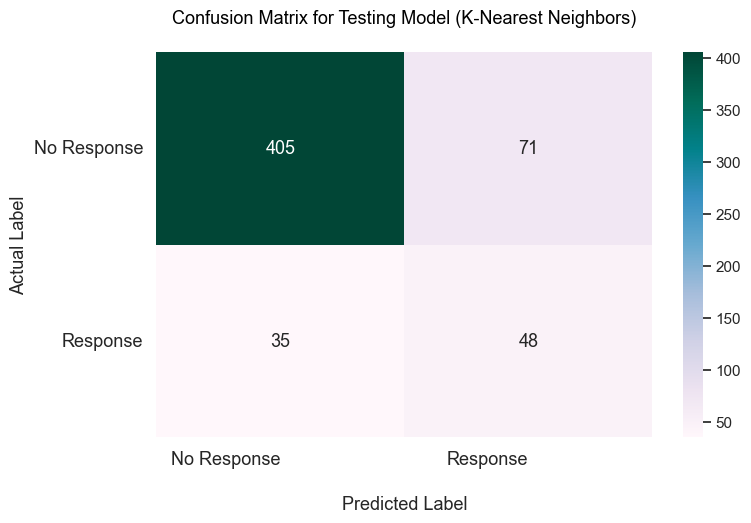

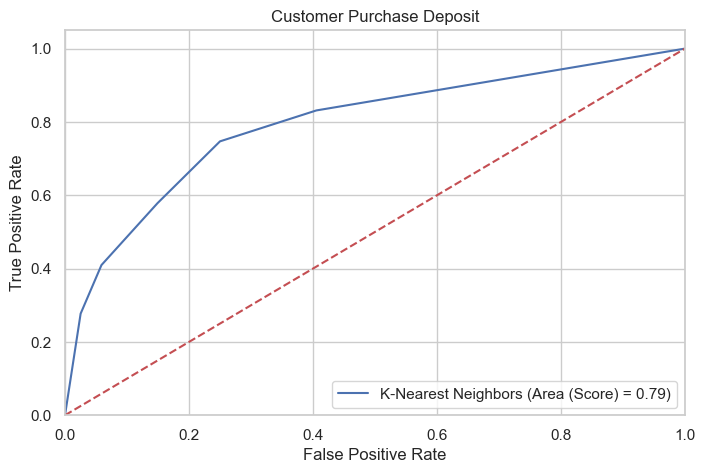

In [160]:
model_eval_test(knn_model, "K-Nearest Neighbors", X_test, y_test)

In [161]:
acc_knn_train=round(knn_model.score(X_train,y_train)*100,2)
acc_knn_test=round(knn_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_knn_train))
print("Test Accuracy: {} %".format(acc_knn_test))

Training Accuracy: 90.0 %
Test Accuracy: 81.04 %


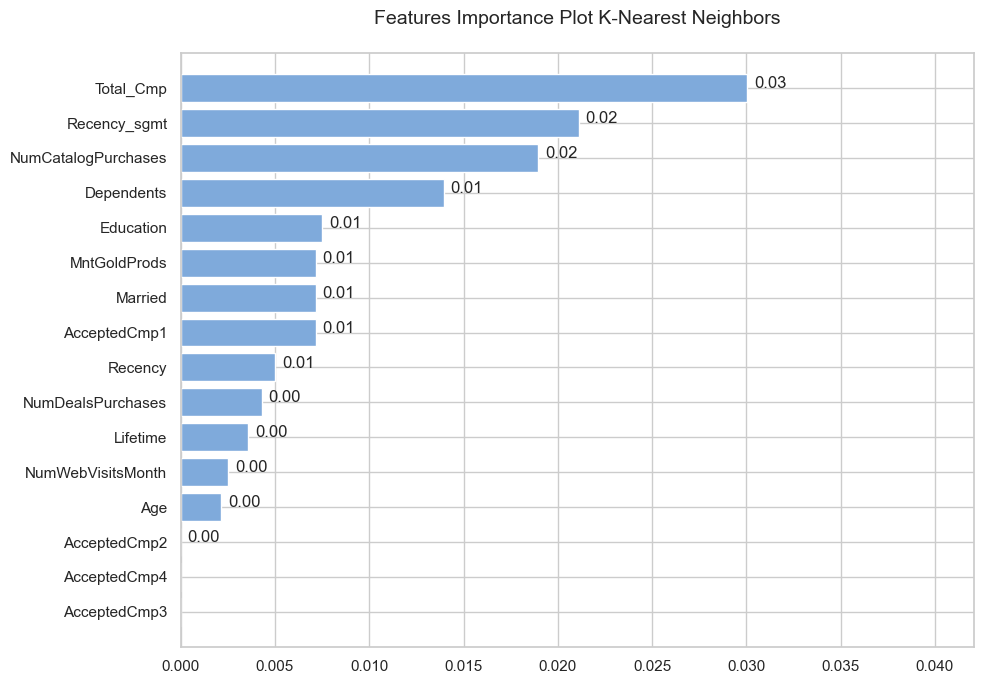

In [162]:
feature_importance_plot(knn_model, "K-Nearest Neighbors", X_train)

In [163]:
# shap_plot(knn_model, "K-Nearest Neighbors", X_test)

### **6. MLP Classifier (Neural Network)**

MLPClassifier adalah singkatan dari Multi-layer Perceptron classifier yang dalam namanya terhubung ke Neural Network. Tidak seperti algoritme klasifikasi lain seperti Support Vectors Machine atau Naive Bayes Classifier, MLPClassifier mengandalkan Neural Network yang mendasari untuk melakukan tugas klasifikasi.

In [164]:
# train the model
mlp_model = MLPClassifier(random_state=42, max_iter=len(X_train)).fit(X_train, y_train)

eval_classification(mlp_model, "MLP Classifier")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.968000,0.844000,0.124000
1,Precision,0.941000,0.481000,0.460000
2,Recall,0.965000,0.602000,0.363000
3,F1 Score,0.953000,0.535000,0.418000
4,F1 Score (crossval),0.689000,0.527000,0.162000
5,ROC AUC,0.994000,0.855000,0.139000
6,ROC AUC (crossval),0.951000,0.885000,0.066000


**Observation:** 
- Precision memiliki gap lumayan besar 0.31
- Recall memiliki gap cukup besar 0.28
- F1 Score train < F1 Score test dengan gap cukup besar 0.30

#### **Performance of Training Model**

Classification Report Training Model (MLP Classifier):

Accuracy = 0.968
Precision = 0.941
Recall = 0.965
F1 Score = 0.953
Cross Val F1 (k=5) = 0.689
ROC AUC = 0.994
Cross Val ROC AUC (k=5) = 0.951

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      1426
           1       0.94      0.96      0.95       713

    accuracy                           0.97      2139
   macro avg       0.96      0.97      0.96      2139
weighted avg       0.97      0.97      0.97      2139

==== Actual Data (Train) =====
Total = 2139
No Response = 1426
Response = 713
==== Predicted Data (Train) =====
TP = 688, FP = 43, TN = 1383, FN = 25
Predictly Correct = 2071
Predictly Wrong = 68 



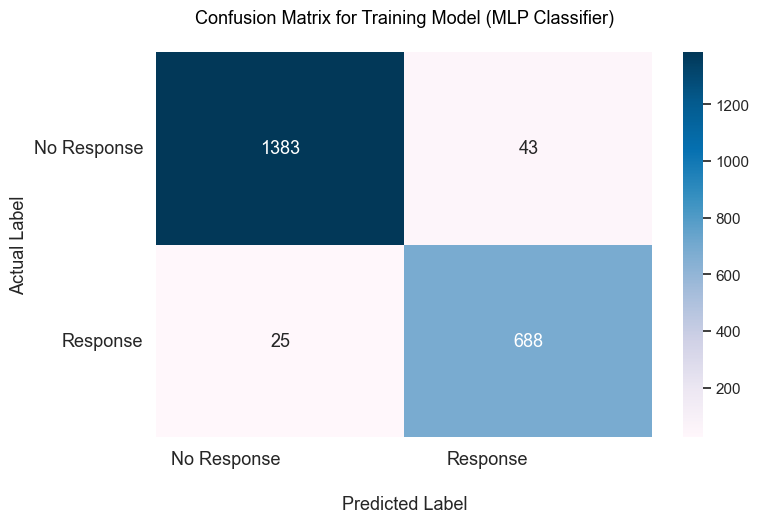

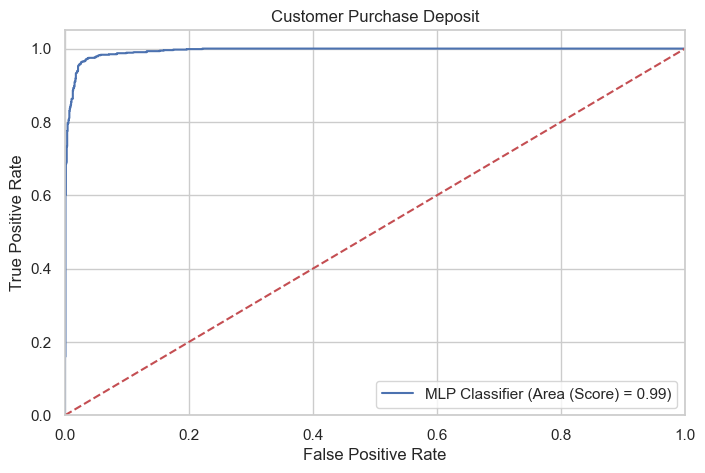

In [165]:
model_eval_train(mlp_model, "MLP Classifier", X_train, y_train)

#### **Performance of Testing Model**

Classification Report Testing Model (MLP Classifier):

Accuracy = 0.844
Precision = 0.481
Recall = 0.602
F1 Score = 0.535
Cross Val F1 (k=5) = 0.527
ROC AUC = 0.855
Cross Val ROC AUC (k=5) = 0.885

              precision    recall  f1-score   support

           0       0.93      0.89      0.91       476
           1       0.48      0.60      0.53        83

    accuracy                           0.84       559
   macro avg       0.70      0.74      0.72       559
weighted avg       0.86      0.84      0.85       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 50, FP = 54, TN = 422, FN = 33
Predictly Correct = 472
Predictly Wrong = 87 



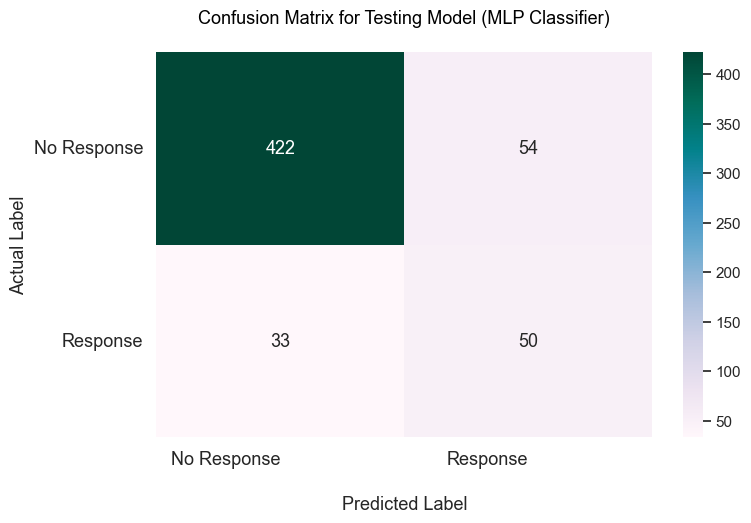

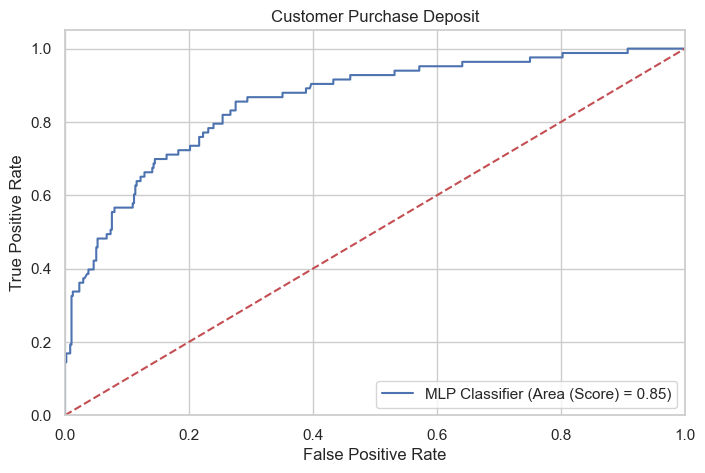

In [166]:
model_eval_test(mlp_model, "MLP Classifier", X_test, y_test)

In [167]:
acc_mlp_train=round(mlp_model.score(X_train,y_train)*100,2)
acc_mlp_test=round(mlp_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_mlp_train))
print("Test Accuracy: {} %".format(acc_mlp_test))

Training Accuracy: 96.82 %
Test Accuracy: 84.44 %


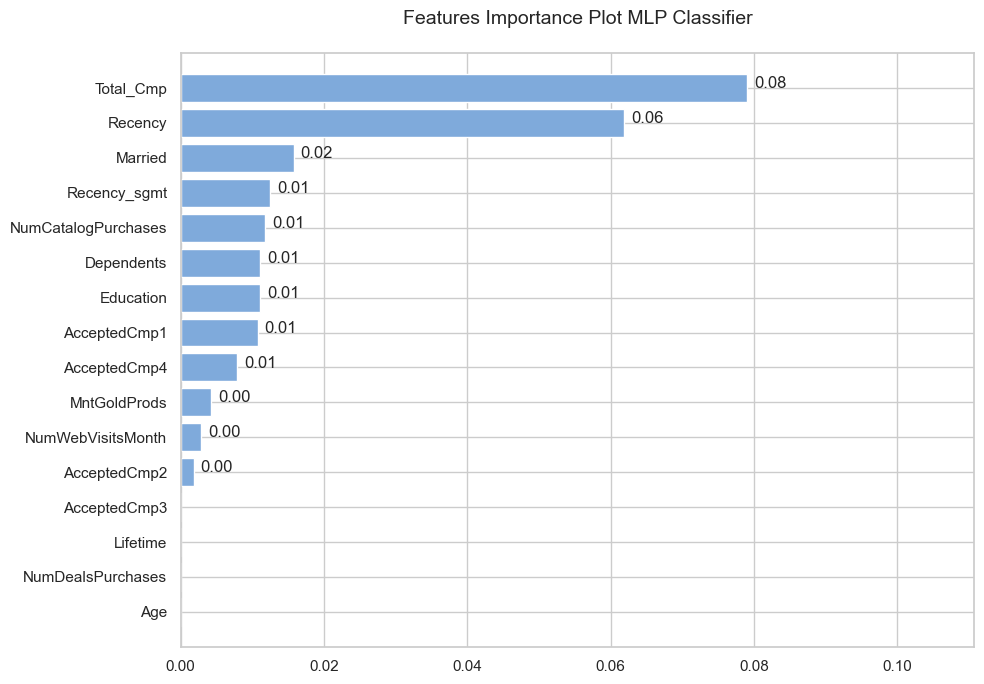

In [168]:
feature_importance_plot(mlp_model, "MLP Classifier", X_train)

Permutation explainer: 560it [00:31, 12.12it/s]                                                                        


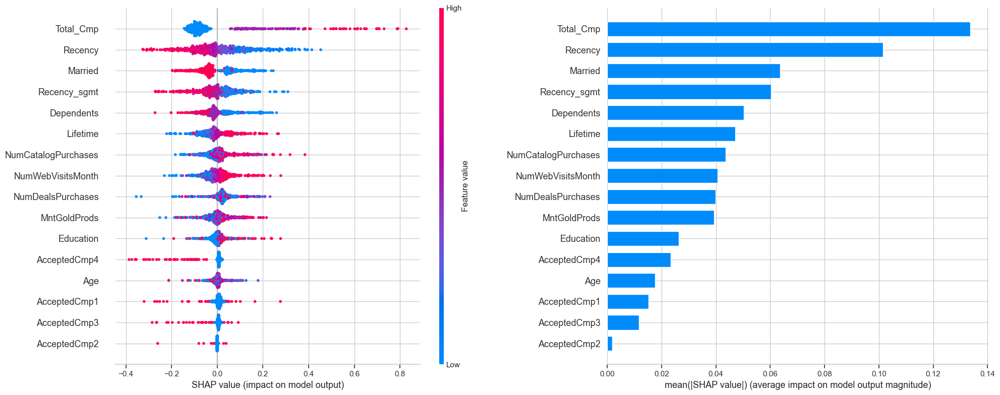

In [169]:
shap_plot(mlp_model, "MLP Classifier", X_test)

### **7. Adaboost Classifier**

is meta-estimator that begins by fitting a classifier on the original dataset and then fits additional copies of the classifier on the same dataset but where the weights of incorrectly classified instances are adjusted such that subsequent classifiers focus more on difficult cases.

In [170]:
# train the model
adab_model = AdaBoostClassifier(random_state=42).fit(X_train, y_train)
eval_classification(adab_model, "Adaboost Classifier")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.866000,0.846000,0.020000
1,Precision,0.834000,0.484000,0.350000
2,Recall,0.746000,0.554000,0.192000
3,F1 Score,0.788000,0.517000,0.271000
4,F1 Score (crossval),0.592000,0.549000,0.043000
5,ROC AUC,0.942000,0.873000,0.069000
6,ROC AUC (crossval),0.921000,0.886000,0.035000


**Observation:** 
- Precision memiliki gap lumayan kecil 0.07
- Recall memiliki gap cukup kecil 0.02
- F1 Score train < F1 Score test dengan gap cukup kecil 0.04

#### **Performance of Training Model**

Classification Report Training Model (Adaboost Classifier):

Accuracy = 0.866
Precision = 0.834
Recall = 0.746
F1 Score = 0.788
Cross Val F1 (k=5) = 0.592
ROC AUC = 0.942
Cross Val ROC AUC (k=5) = 0.921

              precision    recall  f1-score   support

           0       0.88      0.93      0.90      1426
           1       0.83      0.75      0.79       713

    accuracy                           0.87      2139
   macro avg       0.86      0.84      0.84      2139
weighted avg       0.86      0.87      0.86      2139

==== Actual Data (Train) =====
Total = 2139
No Response = 1426
Response = 713
==== Predicted Data (Train) =====
TP = 532, FP = 106, TN = 1320, FN = 181
Predictly Correct = 1852
Predictly Wrong = 287 



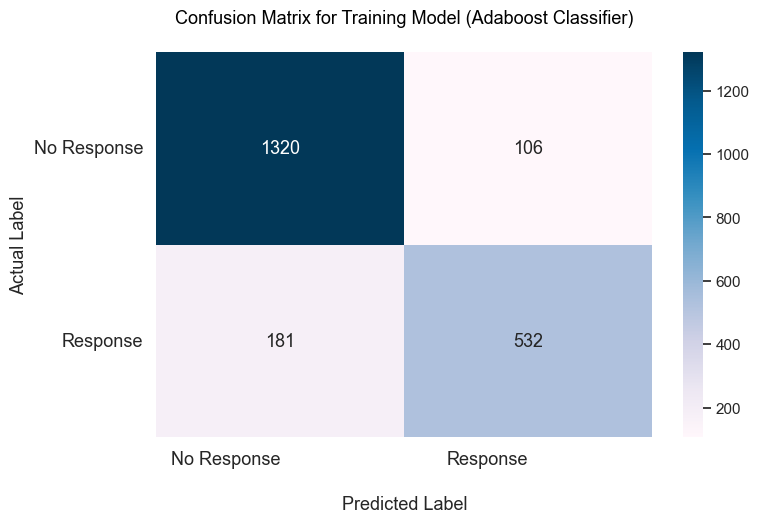

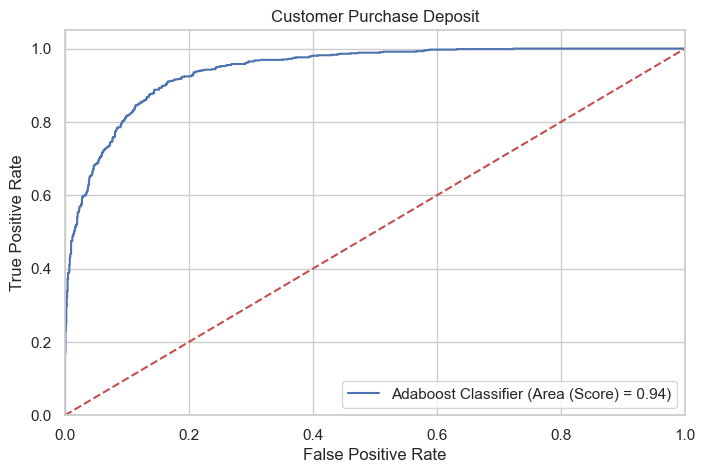

In [171]:
model_eval_train(adab_model, "Adaboost Classifier", X_train, y_train)

#### **Performance of Testing Model**

Classification Report Testing Model (Adaboost Classifier):

Accuracy = 0.846
Precision = 0.484
Recall = 0.554
F1 Score = 0.517
Cross Val F1 (k=5) = 0.549
ROC AUC = 0.873
Cross Val ROC AUC (k=5) = 0.886

              precision    recall  f1-score   support

           0       0.92      0.90      0.91       476
           1       0.48      0.55      0.52        83

    accuracy                           0.85       559
   macro avg       0.70      0.73      0.71       559
weighted avg       0.86      0.85      0.85       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 46, FP = 49, TN = 427, FN = 37
Predictly Correct = 473
Predictly Wrong = 86 



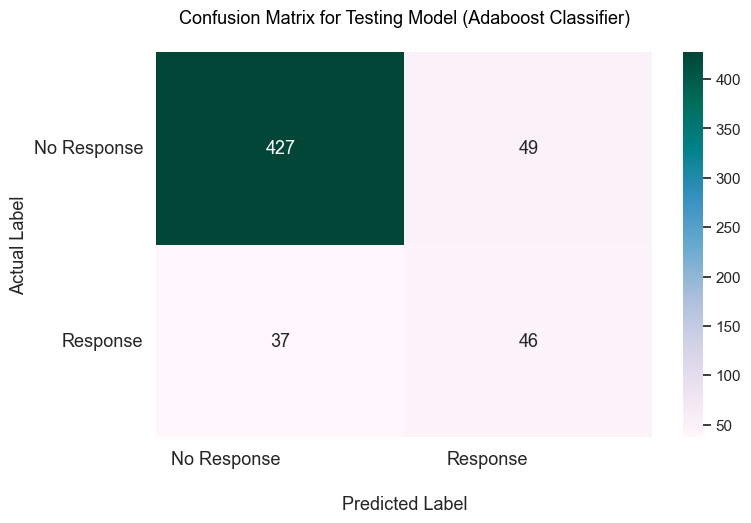

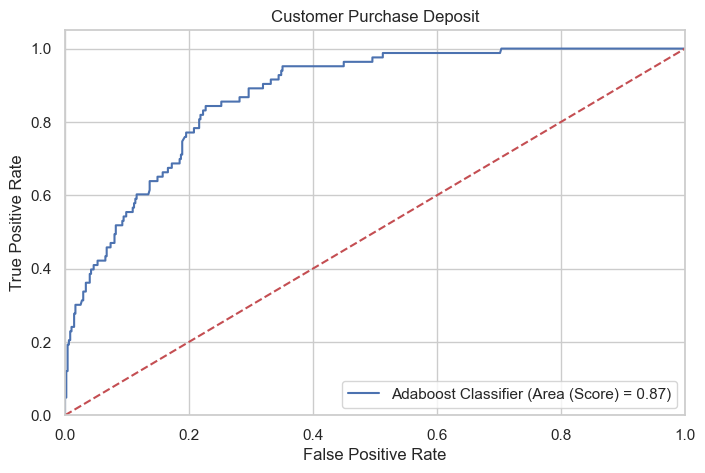

In [172]:
model_eval_test(adab_model, "Adaboost Classifier", X_test, y_test)

In [173]:
acc_adab_train=round(adab_model.score(X_train,y_train)*100,2)
acc_adab_test=round(adab_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_adab_train))
print("Test Accuracy: {} %".format(acc_adab_test))

Training Accuracy: 86.58 %
Test Accuracy: 84.62 %


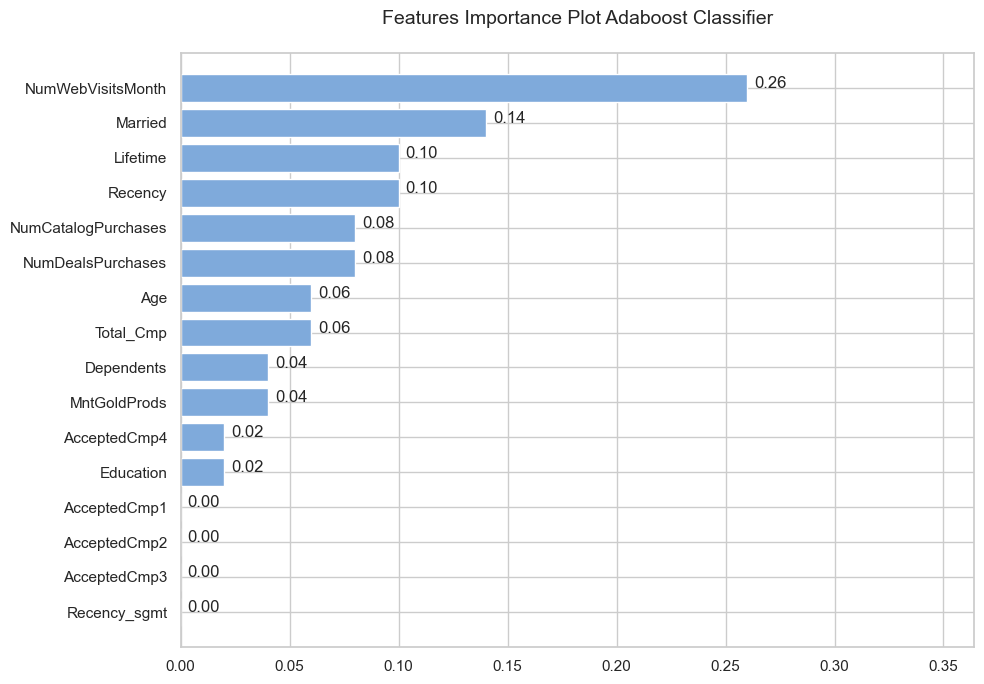

In [174]:
feature_importance_plot(adab_model, "Adaboost Classifier")

Permutation explainer: 560it [03:28,  2.54it/s]                                                                        


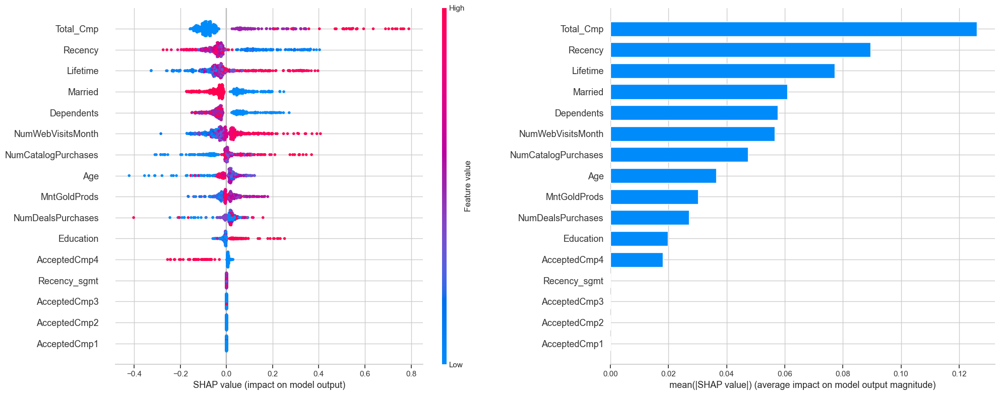

In [175]:
shap_plot(adab_model, "Adaboost Classifier", X_test)

### **8. XGBoost Classifier**

XGBoost (Extream Gradient Boosting) merupakan pengembangan dari algoritma Gradient Tree Boosting yang berbasis algoritma ensemble, secara efisien dapat menangani permasalahan machine learning yang berskala besar.

In [176]:
# train the model
xgb_model = XGBClassifier(random_state=42).fit(X_train, y_train)
eval_classification(xgb_model, "XGBoost Classifier")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.997000,0.889000,0.108000
1,Precision,0.994000,0.644000,0.350000
2,Recall,0.996000,0.566000,0.430000
3,F1 Score,0.995000,0.603000,0.392000
4,F1 Score (crossval),0.973000,0.537000,0.436000
5,ROC AUC,1.000000,0.891000,0.109000
6,ROC AUC (crossval),1.000000,0.875000,0.125000


**Observation:** 
- Precision memiliki gap lumayan besar 0.29
- Recall memiliki gap cukup besar 0.49
- F1 Score train < F1 Score test dengan gap cukup besar 0.40

#### **Performance of Training Model**

Classification Report Training Model (XGBoost Classifier):

Accuracy = 0.997
Precision = 0.994
Recall = 0.996
F1 Score = 0.995
Cross Val F1 (k=5) = 0.973
ROC AUC = 1.0
Cross Val ROC AUC (k=5) = 1.0

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1426
           1       0.99      1.00      1.00       713

    accuracy                           1.00      2139
   macro avg       1.00      1.00      1.00      2139
weighted avg       1.00      1.00      1.00      2139

==== Actual Data (Train) =====
Total = 2139
No Response = 1426
Response = 713
==== Predicted Data (Train) =====
TP = 710, FP = 4, TN = 1422, FN = 3
Predictly Correct = 2132
Predictly Wrong = 7 



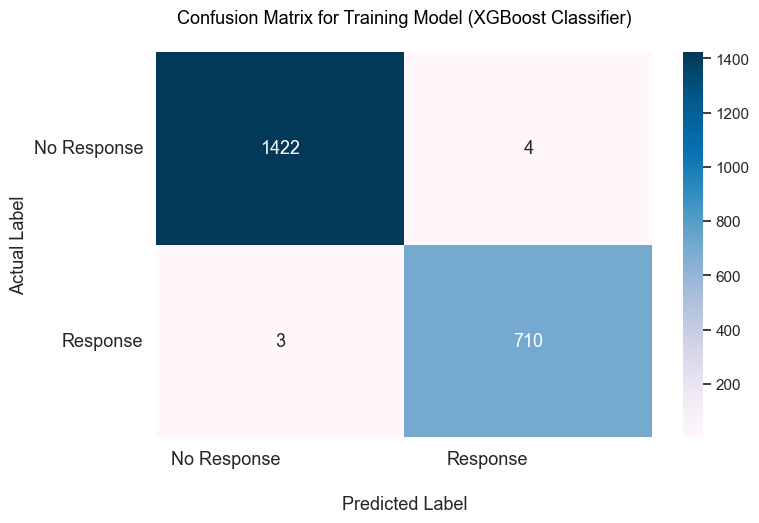

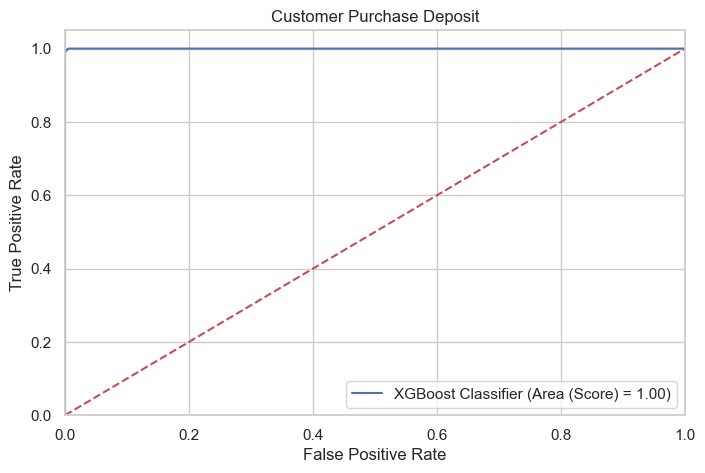

In [177]:
model_eval_train(xgb_model, "XGBoost Classifier", X_train, y_train)

#### **Performance of Testing Model**

Classification Report Testing Model (XGBoost Classifier):

Accuracy = 0.889
Precision = 0.644
Recall = 0.566
F1 Score = 0.603
Cross Val F1 (k=5) = 0.537
ROC AUC = 0.891
Cross Val ROC AUC (k=5) = 0.875

              precision    recall  f1-score   support

           0       0.93      0.95      0.94       476
           1       0.64      0.57      0.60        83

    accuracy                           0.89       559
   macro avg       0.78      0.76      0.77       559
weighted avg       0.88      0.89      0.89       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 47, FP = 26, TN = 450, FN = 36
Predictly Correct = 497
Predictly Wrong = 62 



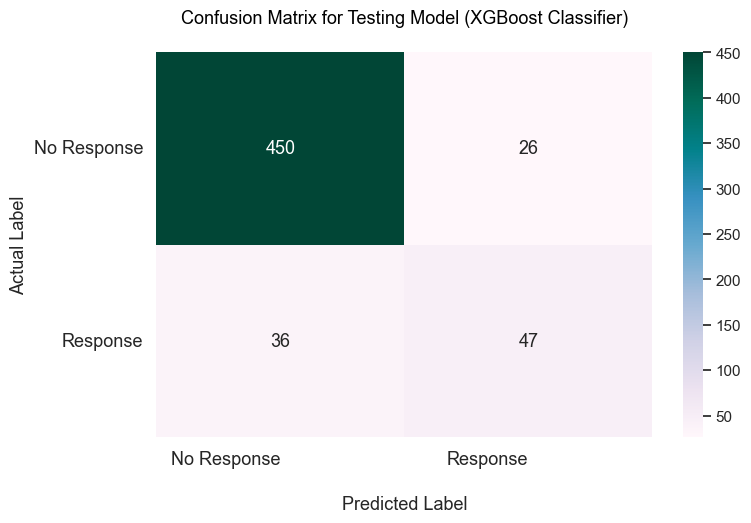

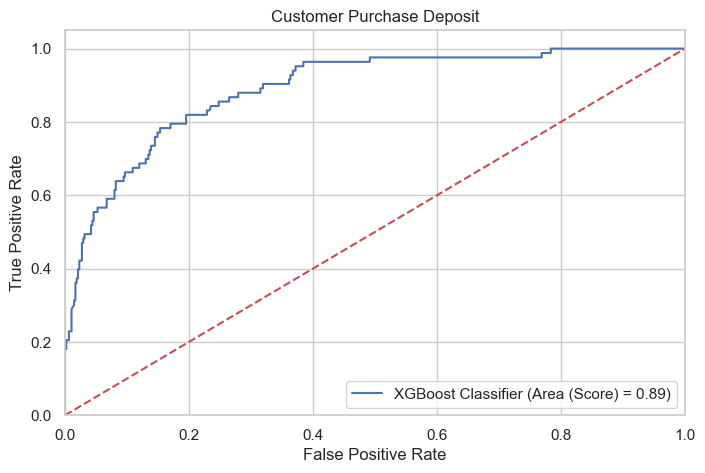

In [178]:
model_eval_test(xgb_model, "XGBoost Classifier", X_test, y_test)

In [179]:
acc_xgb_train=round(xgb_model.score(X_train,y_train)*100,2)
acc_xgb_test=round(xgb_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_xgb_train))
print("Test Accuracy: {} %".format(acc_xgb_test))

Training Accuracy: 99.67 %
Test Accuracy: 88.91 %


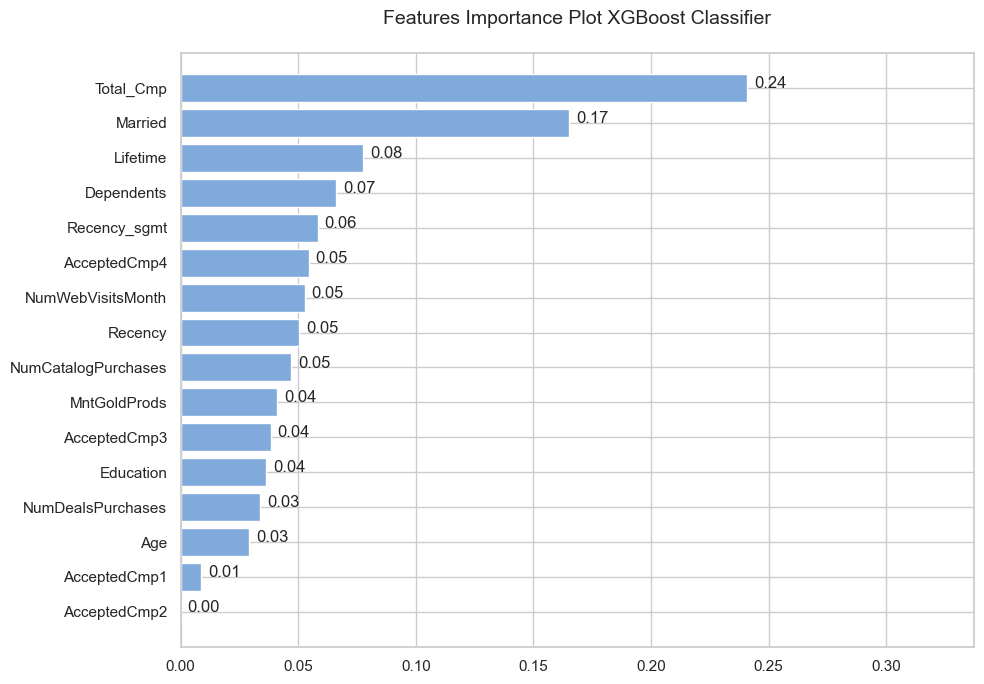

In [180]:
feature_importance_plot(xgb_model, "XGBoost Classifier")

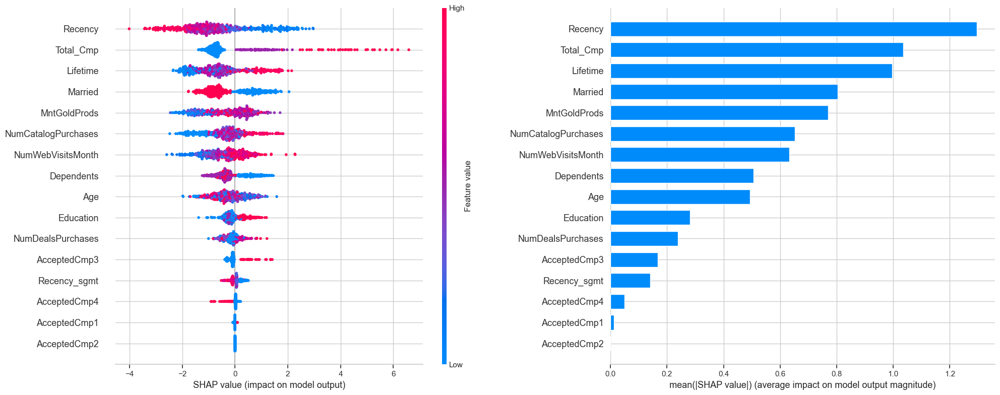

In [181]:
shap_plot(xgb_model, "XGBoost Classifier", X_test)

### **9. Gradient Boosting Classifier**

Gradient boosting merupakan algoritma klasifikasi machine learning yang menggunakan ensamble dari decision tree untuk memprediksi nilai. Gradient boosting termasuk supervised learning berbasis decision tree yang dapat digunakan untuk klasifikasi

In [182]:
# train the model
# gb_model = GradientBoostingClassifier().fit(X_train, y_train)
gb_model = GradientBoostingClassifier(learning_rate=0.01, n_estimators=400, max_depth=13, random_state=42).fit(X_train, y_train)
eval_classification(gb_model, "Gradient Boosting Classifier")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.997000,0.826000,0.171000
1,Precision,1.000000,0.422000,0.578000
2,Recall,0.990000,0.458000,0.532000
3,F1 Score,0.995000,0.439000,0.556000
4,F1 Score (crossval),0.972000,0.469000,0.503000
5,ROC AUC,1.000000,0.743000,0.257000
6,ROC AUC (crossval),1.000000,0.754000,0.246000


**Observation:** 
- Precision memiliki gap lumayan besar 0.52
- Recall memiliki gap cukup besar 0.50
- F1 Score train < F1 Score test dengan gap cukup besar 0.51

#### **Performance of Training Model**

Classification Report Training Model (Gradient Boosting Classifier):

Accuracy = 0.997
Precision = 1.0
Recall = 0.99
F1 Score = 0.995
Cross Val F1 (k=5) = 0.972
ROC AUC = 1.0
Cross Val ROC AUC (k=5) = 1.0

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1426
           1       1.00      0.99      1.00       713

    accuracy                           1.00      2139
   macro avg       1.00      1.00      1.00      2139
weighted avg       1.00      1.00      1.00      2139

==== Actual Data (Train) =====
Total = 2139
No Response = 1426
Response = 713
==== Predicted Data (Train) =====
TP = 706, FP = 0, TN = 1426, FN = 7
Predictly Correct = 2132
Predictly Wrong = 7 



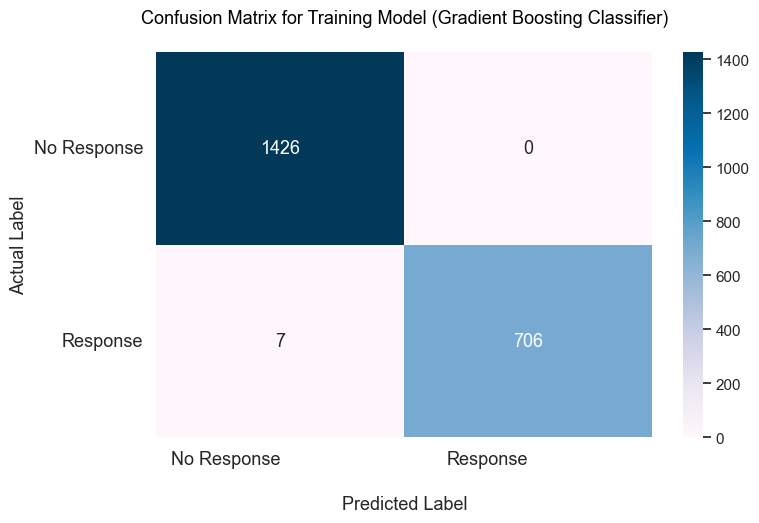

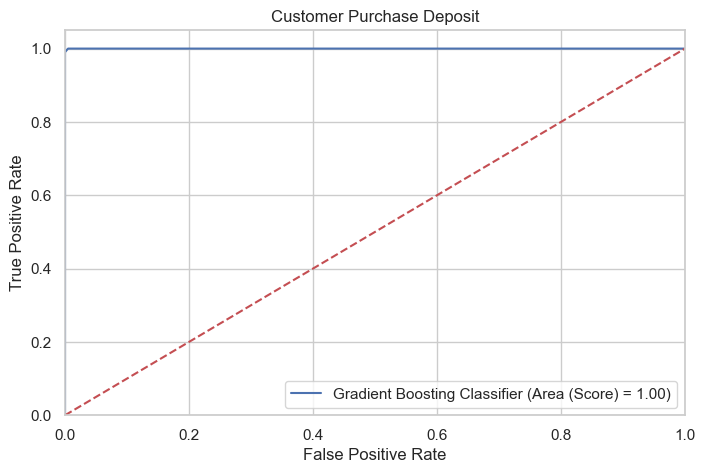

In [183]:
model_eval_train(gb_model, "Gradient Boosting Classifier", X_train, y_train)

#### **Performance of Testing Model**

Classification Report Testing Model (Gradient Boosting Classifier):

Accuracy = 0.826
Precision = 0.422
Recall = 0.458
F1 Score = 0.439
Cross Val F1 (k=5) = 0.469
ROC AUC = 0.743
Cross Val ROC AUC (k=5) = 0.754

              precision    recall  f1-score   support

           0       0.90      0.89      0.90       476
           1       0.42      0.46      0.44        83

    accuracy                           0.83       559
   macro avg       0.66      0.67      0.67       559
weighted avg       0.83      0.83      0.83       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 38, FP = 52, TN = 424, FN = 45
Predictly Correct = 462
Predictly Wrong = 97 



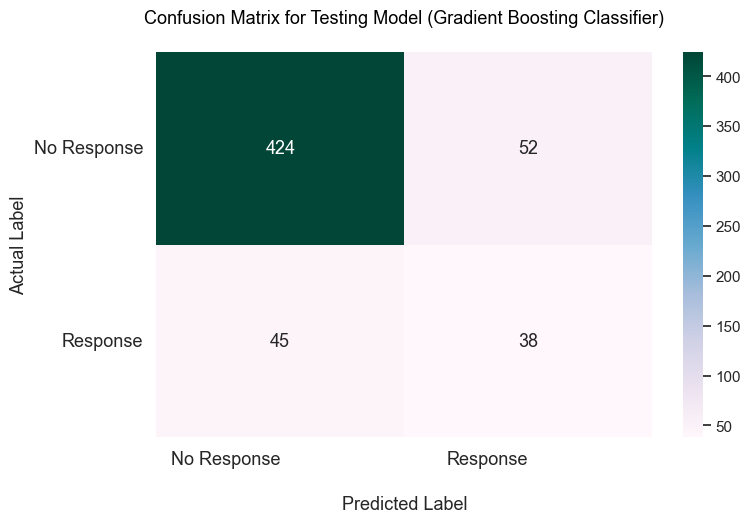

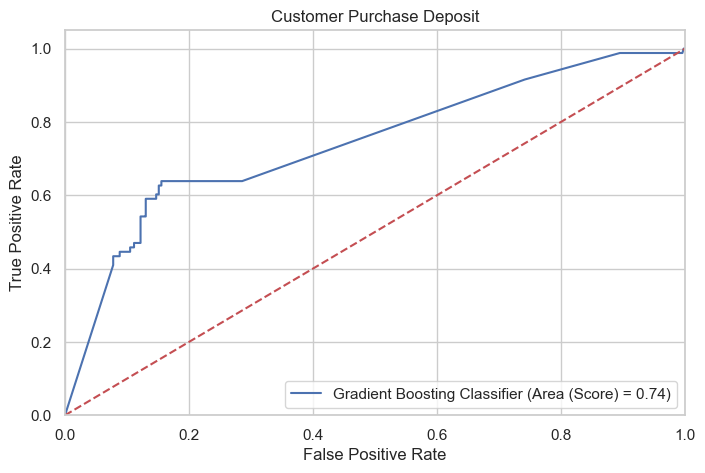

In [184]:
model_eval_test(gb_model, "Gradient Boosting Classifier", X_test, y_test)

In [185]:
acc_gb_train=round(gb_model.score(X_train,y_train)*100,2)
acc_gb_test=round(gb_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_gb_train))
print("Test Accuracy: {} %".format(acc_gb_test))

Training Accuracy: 99.67 %
Test Accuracy: 82.65 %


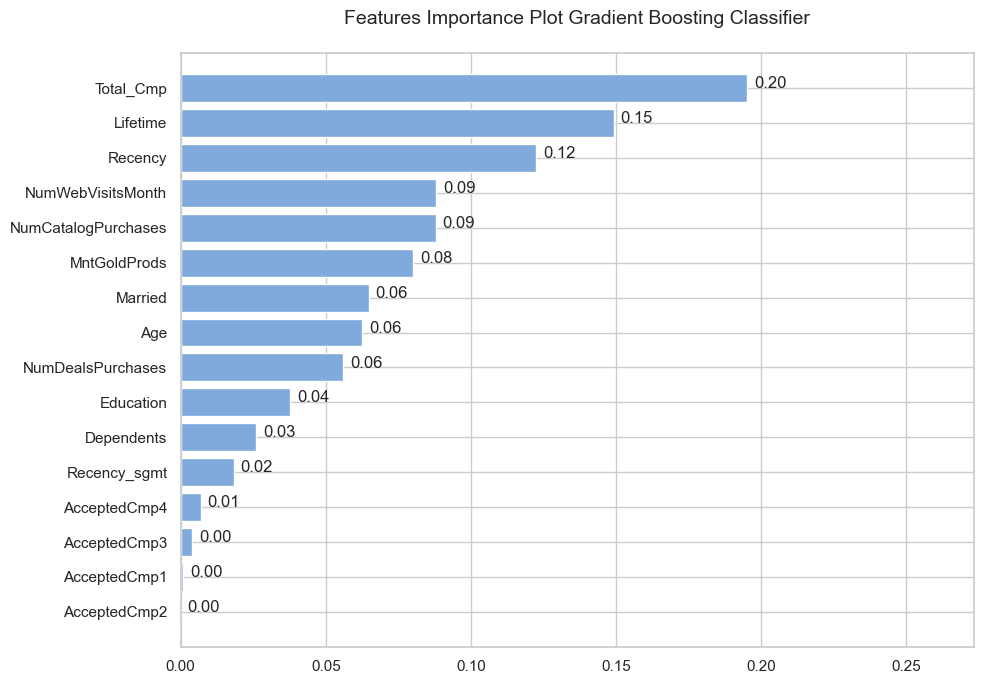

In [186]:
feature_importance_plot(gb_model, "Gradient Boosting Classifier")

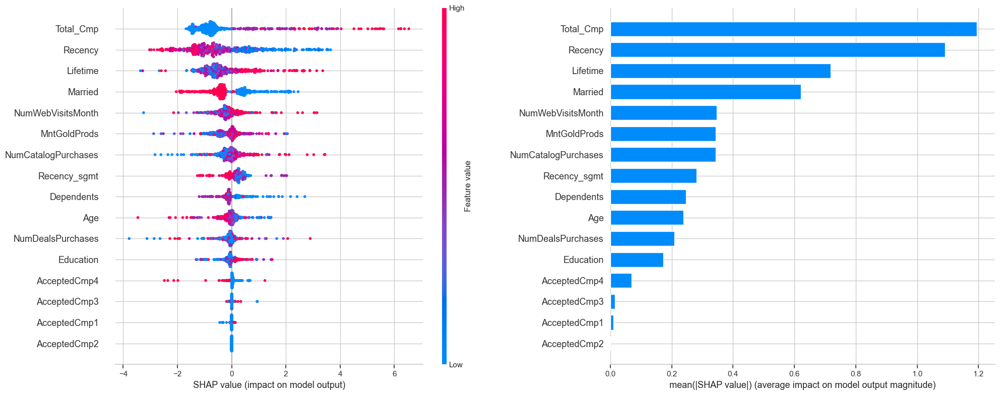

In [187]:
shap_plot(gb_model, "Gradient Boosting Classifier", X_test)

### **10. Support Vector Machine**

Support Vector Machine atau SVM adalah algoritme pembelajaran mesin yang diawasi yang dapat digunakan untuk klasifikasi dan regresi. Cara kerja SVM didasarkan pada SRM atau Structural Risk Minimization yang dirancang untuk mengolah data menjadi Hyperplane yang mengklasifikasikan ruang input menjadi dua kelas.

In [188]:
# train the model
svm_model = SVC(kernel='rbf', probability=True, random_state=42).fit(X_train, y_train)
print(svm_model)
eval_classification(svm_model, "Support Vector Machine")

SVC(probability=True, random_state=42)


,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.847000,0.869000,-0.022000
1,Precision,0.828000,0.560000,0.268000
2,Recall,0.682000,0.566000,0.116000
3,F1 Score,0.748000,0.563000,0.185000
4,F1 Score (crossval),0.501000,0.438000,0.063000
5,ROC AUC,0.918000,0.872000,0.046000
6,ROC AUC (crossval),0.898000,0.857000,0.041000


**Observation:** 
- Precision memiliki gap lumayan kecil under -0.03
- Recall memiliki gap cukup kecil 0.05
- F1 Score train < F1 Score test dengan gap cukup kecil 0.05

#### **Performance of Training Model**

Classification Report Training Model (Support Vector Machine):

Accuracy = 0.847
Precision = 0.828
Recall = 0.682
F1 Score = 0.748
Cross Val F1 (k=5) = 0.501
ROC AUC = 0.918
Cross Val ROC AUC (k=5) = 0.898

              precision    recall  f1-score   support

           0       0.85      0.93      0.89      1426
           1       0.83      0.68      0.75       713

    accuracy                           0.85      2139
   macro avg       0.84      0.81      0.82      2139
weighted avg       0.85      0.85      0.84      2139

==== Actual Data (Train) =====
Total = 2139
No Response = 1426
Response = 713
==== Predicted Data (Train) =====
TP = 486, FP = 101, TN = 1325, FN = 227
Predictly Correct = 1811
Predictly Wrong = 328 



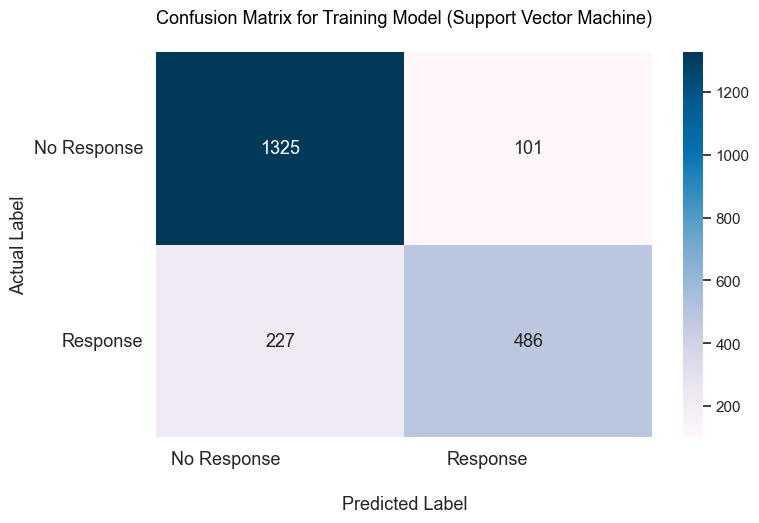

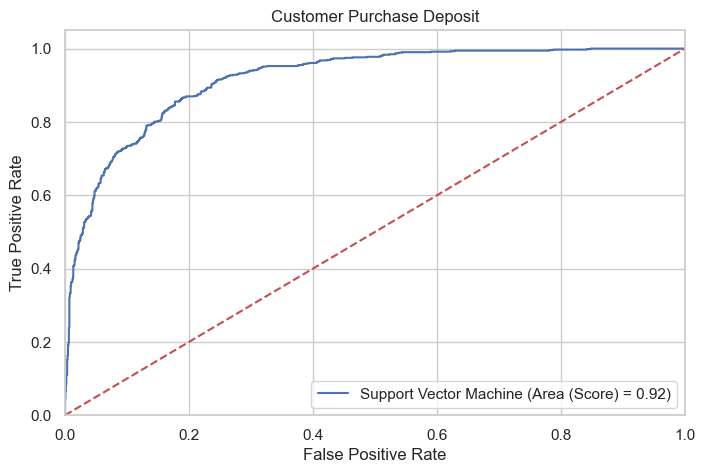

In [189]:
model_eval_train(svm_model, "Support Vector Machine", X_train, y_train)

#### **Performance of Testing Model**

Classification Report Testing Model (Support Vector Machine):

Accuracy = 0.869
Precision = 0.56
Recall = 0.566
F1 Score = 0.563
Cross Val F1 (k=5) = 0.438
ROC AUC = 0.872
Cross Val ROC AUC (k=5) = 0.857

              precision    recall  f1-score   support

           0       0.92      0.92      0.92       476
           1       0.56      0.57      0.56        83

    accuracy                           0.87       559
   macro avg       0.74      0.74      0.74       559
weighted avg       0.87      0.87      0.87       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 47, FP = 37, TN = 439, FN = 36
Predictly Correct = 486
Predictly Wrong = 73 



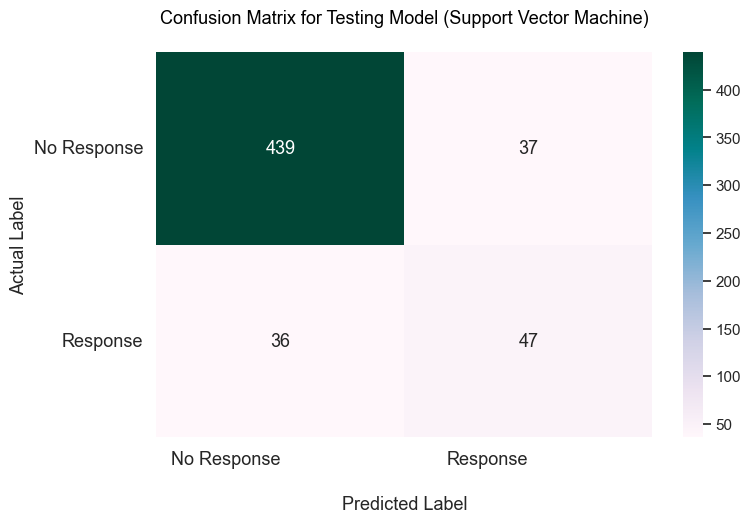

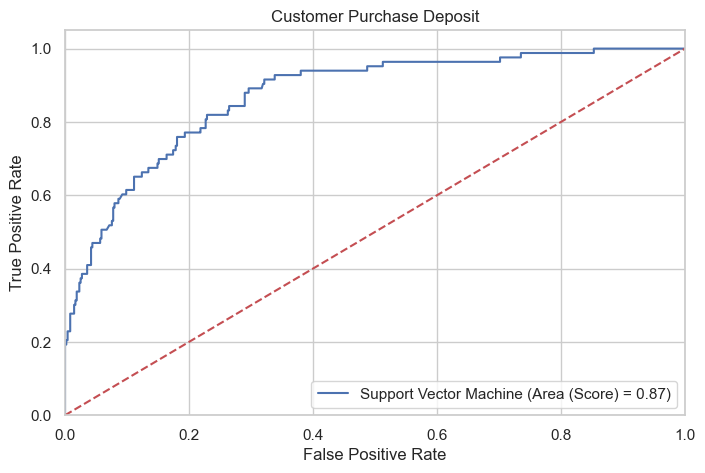

In [190]:
model_eval_test(svm_model, "Support Vector Machine", X_test, y_test)

In [191]:
acc_svm_train=round(svm_model.score(X_train,y_train)*100,2)
acc_svm_test=round(svm_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_svm_train))
print("Test Accuracy: {} %".format(acc_svm_test))

Training Accuracy: 84.67 %
Test Accuracy: 86.94 %


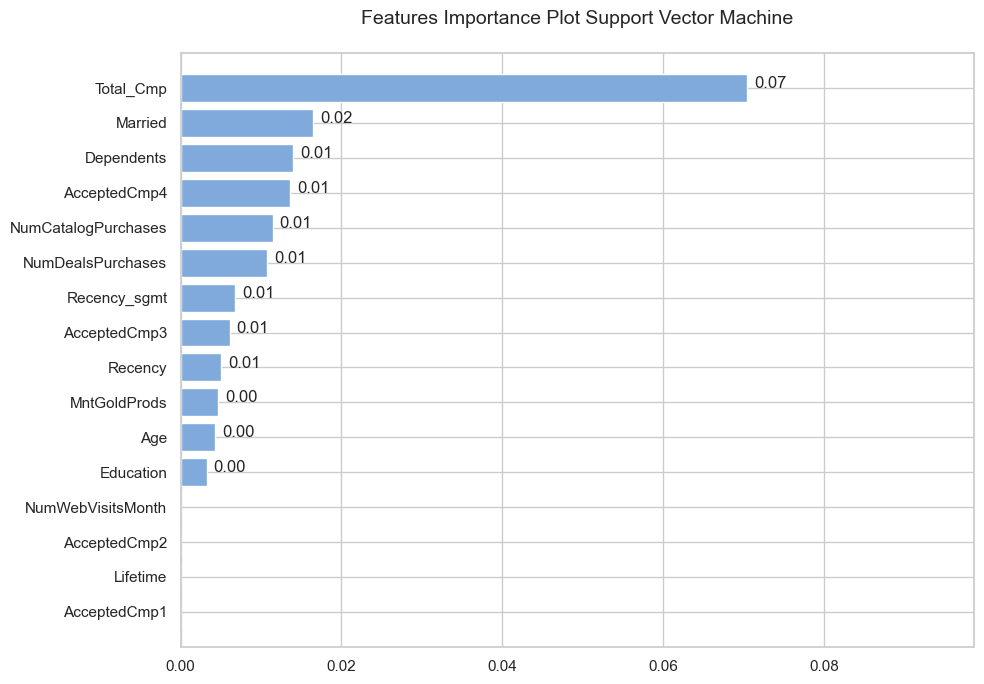

In [192]:
feature_importance_plot(svm_model, "Support Vector Machine", X_train)

In [193]:
# shap_plot(svm_model, "Support Vector Machine", X_test)

### **Summary**

In [194]:
results_eval = pd.DataFrame({
    "Models" : train_modelname_list,
    "Precision (Train)": train_precision_list, 
    "Precision (Test)": test_precision_list, 
    "Recall (Train)": train_recall_list, 
    "Recall (Test)": test_recall_list, 
    "F1 Score (Train)" : train_f1_score_list,
    "F1 Score (Test)" : test_f1_score_list
})

results_eval.drop_duplicates(inplace = True)

results_eval.sort_values(by=["F1 Score (Test)", "Precision (Test)", "Recall (Test)"], ascending=[False, False, False]).reset_index(drop = True).style.background_gradient(cmap="Purples")

,Models,Precision (Train),Precision (Test),Recall (Train),Recall (Test),F1 Score (Train),F1 Score (Test)
0,Random Forest,0.996000,0.686000,0.994000,0.578000,0.995000,0.627000
1,XGBoost Classifier,0.994000,0.644000,0.996000,0.566000,0.995000,0.603000
2,Logistic Regression,0.737000,0.519000,0.589000,0.651000,0.655000,0.578000
3,Support Vector Machine,0.828000,0.560000,0.682000,0.566000,0.748000,0.563000
4,MLP Classifier,0.941000,0.481000,0.965000,0.602000,0.953000,0.535000
5,Adaboost Classifier,0.834000,0.484000,0.746000,0.554000,0.788000,0.517000
6,K-Nearest Neighbors,0.805000,0.403000,0.924000,0.578000,0.860000,0.475000
7,Naive Bayes,0.653000,0.413000,0.443000,0.518000,0.528000,0.460000
8,Decision Tree,1.000000,0.417000,0.990000,0.482000,0.995000,0.447000
9,Gradient Boosting Classifier,1.000000,0.422000,0.990000,0.458000,0.995000,0.439000


In [195]:
import pickle
pickle.dump(rf_model, open('rf_best_model.pkl', 'wb'))

In [196]:
rf_best_model_temp = pickle.load(open('rf_best_model.pkl', 'rb'))

Berdasarkan hasil modelling menggunakan beberapa algoritma di atas, dapat diketahui bahwa nilai precision dan recall pada dataset train dan test yang paling baik dihasilkan oleh Decision Tree, Random Forest, dan XGBoost dengan masing-masing nilai yang didapatkan sebagai berikut:

* Decision Tree: Precision 1.00, Recall 0.98
* Random Forest: Precision 1.00, Recall 0.98
* XGBoost: Precision 0.89, Recall 0.83

## **📌 Hyperparameter Tuning**

Kemudian, pada tahap selanjutnya kami melakukan hyperparameter tuning dari beberapa model. Kemudian akan fokus ke beberapa model yang telah kami pilih berdasarkan nilai precision, recall dan f1 score tertinggi sebelumnya. Hal ini kami lakukan dengan menganalisa output learning curve agar output akhir modelling dari jenis metode tersebut dapat memberikan hasil yang lebih optimal.

In [197]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import StratifiedKFold

def show_best_hyperparameter(model, hyperparameters):
    for key, value in hyperparameters.items() :
        print('Best '+key+':', model.best_params_()[key])

In [198]:
from sklearn.metrics import make_scorer
precision_scorer = make_scorer(precision_score, zero_division=0)
custom_scoring = {"precision": precision_scorer, "recall": "recall", "f1": "f1"}

### **1. Decision Tree**

#### **Tuning CV**

In [199]:
# List of hyperparameter
max_depth = [int(x) for x in np.linspace(1, 110, num = 30)] # Maximum number of levels in tree
min_samples_split = [2, 5, 10, 100] # Minimum number of samples required to split a node
min_samples_leaf = [1, 2, 4, 10, 20, 50] # Minimum number of samples required at each leaf node
max_features = [None, 'sqrt'] # Number of features to consider at every split
criterion = ['gini','entropy']
splitter = ['best','random']

hyperparameters = dict(max_depth=max_depth, 
                       min_samples_split=min_samples_split,
                       min_samples_leaf=min_samples_leaf, 
                       max_features=max_features, 
                       criterion=criterion, 
                       splitter=splitter)

dt = DecisionTreeClassifier(random_state=42)
cv = StratifiedKFold(n_splits=5)

dt_model_ht = RandomizedSearchCV(dt, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1", random_state=1)
# dt_model_ht = GridSearchCV(dt, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1")

grid_result = dt_model_ht.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_f1']
# stds = grid_result.cv_results_['std_test_f1']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.771037 using {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 53, 'criterion': 'entropy'}


Best: 0.483280 using {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 53, 'criterion': 'entropy'}

In [200]:
dt_model_ht = DecisionTreeClassifier(splitter = 'random', min_samples_split = 2, 
                                     min_samples_leaf = 1, max_features = None, 
                                     max_depth = 53, criterion = 'entropy', random_state=42)
dt_model_ht.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=53, random_state=42,
                       splitter='random')

In [201]:
eval_classification(dt_model_ht, "Decision Tree (HT)")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.997000,0.828000,0.169000
1,Precision,1.000000,0.433000,0.567000
2,Recall,0.990000,0.506000,0.484000
3,F1 Score,0.995000,0.467000,0.528000
4,F1 Score (crossval),0.972000,0.461000,0.511000
5,ROC AUC,1.000000,0.700000,0.300000
6,ROC AUC (crossval),1.000000,0.687000,0.313000


#### **Learning Curve**

- **min_samples_leaf**

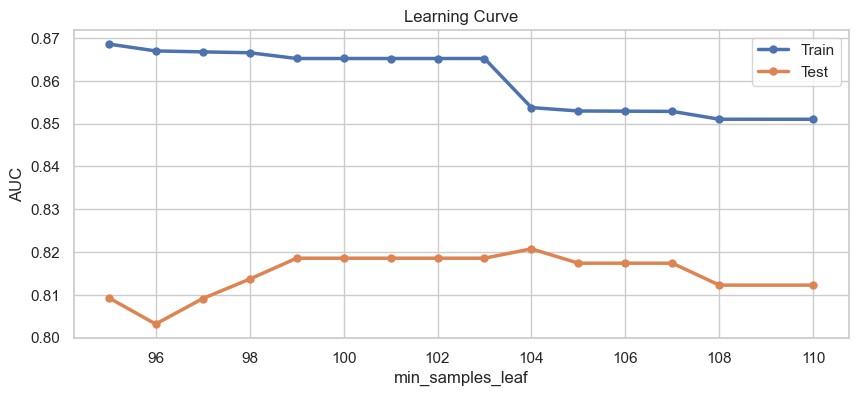

In [202]:
def draw_learning_curve(params_values): 
    train_scores = []
    test_scores = []

    for i in params_values: 
        model = DecisionTreeClassifier(random_state = 42, min_samples_leaf=i)
        model.fit(X_train, y_train)

        #Eval on Train 
        y_pred_train_proba = model.predict_proba(X_train)
        train_auc = roc_auc_score(y_train, y_pred_train_proba[:, 1])
        train_scores.append(train_auc)

        #Eval on Test 
        y_pred_proba = model.predict_proba(X_test)
        test_auc = roc_auc_score(y_test, y_pred_proba[:, 1])
        test_scores.append(test_auc)

        # print('params values: ' + str(i) + '; train: ' + str(train_auc) + '; test: ' + str(test_auc))
    
    fig = plt.figure(figsize =(10, 4))
    plt.plot(params_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
    plt.plot(params_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    plt.xlabel('min_samples_leaf')
    plt.ylabel('AUC')
    plt.title('Learning Curve')
    plt.legend()
    plt.show()

params_values = [int(x) for x in np.linspace(95, 110, 15)]
draw_learning_curve(params_values) 

Best value for `min_samples_leaf` = 95

- **max_depth**

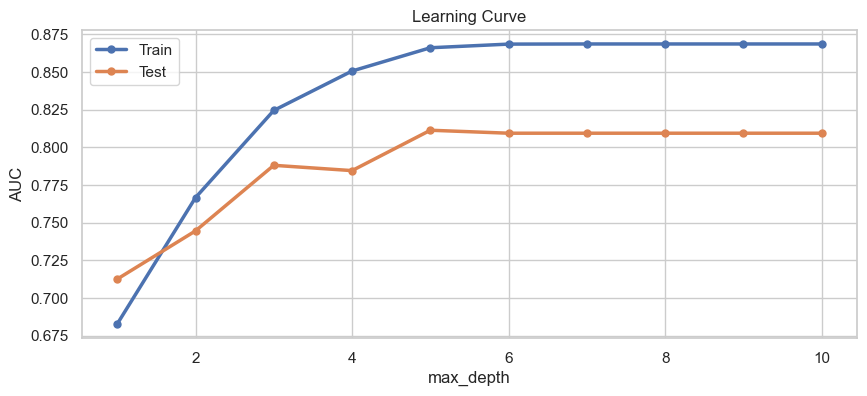

In [203]:
def draw_learning_curv(params_values): 
    train_scores = []
    test_scores = []

    for c in params_values: 
        model = DecisionTreeClassifier(random_state = 42, min_samples_leaf = 95, max_depth=c)
        model.fit(X_train, y_train)

        #Eval on Train 
        y_pred_train_proba = model.predict_proba(X_train)
        train_auc = roc_auc_score(y_train, y_pred_train_proba[:, 1])
        train_scores.append(train_auc)

        #Eval on Test 
        y_pred_proba = model.predict_proba(X_test)
        test_auc = roc_auc_score(y_test, y_pred_proba[:, 1])
        test_scores.append(test_auc)

        # print('params values: ' + str(c) + '; train: ' + str(train_auc) + '; test: ' + str(test_auc))
    
    fig = plt.figure(figsize =(10, 4))
    plt.plot(params_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
    plt.plot(params_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    plt.xlabel('max_depth')
    plt.ylabel('AUC')
    plt.title('Learning Curve')
    plt.legend()
    plt.show()

params_values = [int(x) for x in np.linspace(1, 10, num=10)]
draw_learning_curv(params_values)

Best value for `max_depth` = 4

- **max_depth**

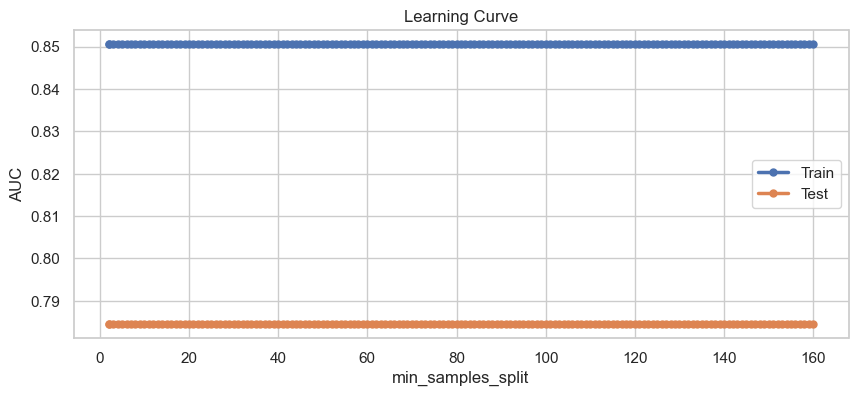

In [204]:
def draw_learning_curves(params_values): 
    train_scores = []
    test_scores = []

    for i in params_values: 
        model = DecisionTreeClassifier(random_state = 42, min_samples_leaf = 95, max_depth=4, min_samples_split=i)
        model.fit(X_train, y_train)

        #Eval on Train 
        y_pred_train_proba = model.predict_proba(X_train)
        train_auc = roc_auc_score(y_train, y_pred_train_proba[:, 1])
        train_scores.append(train_auc)

        #Eval on Test 
        y_pred_proba = model.predict_proba(X_test)
        test_auc = roc_auc_score(y_test, y_pred_proba[:, 1])
        test_scores.append(test_auc)

        # print('param values: ' + str(i) + '; train: ' + str(train_auc) + '; test: ' + str(test_auc))
    fig = plt.figure(figsize =(10, 4))
    plt.plot(params_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
    plt.plot(params_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    plt.xlabel('min_samples_split')
    plt.ylabel('AUC')
    plt.title('Learning Curve')
    plt.legend()
    plt.show()

params_values = [int(x) for x in np.linspace(2, 160, 160)]
draw_learning_curves(params_values) 

Best value for `min_sample_split` = 20

#### **Manually Tuning**

Melakukan tuning kembali menggunakan hyperparameter best/optimal sebelumnya untuk melihat perubahan evaluasi model

In [205]:
from sklearn.tree import DecisionTreeClassifier
dt_model_ht2 = DecisionTreeClassifier(random_state = 42, min_samples_leaf = 95, 
                            max_depth=4, min_samples_split=20, 
                            splitter = 'best', criterion = 'gini') 
dt_model_ht2.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=4, min_samples_leaf=95, min_samples_split=20,
                       random_state=42)

In [206]:
eval_classification(dt_model_ht2, "Decision Tree (HT2)")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.797000,0.852000,-0.055000
1,Precision,0.796000,0.500000,0.296000
2,Recall,0.525000,0.422000,0.103000
3,F1 Score,0.632000,0.458000,0.174000
4,F1 Score (crossval),0.438000,0.404000,0.034000
5,ROC AUC,0.851000,0.784000,0.067000
6,ROC AUC (crossval),0.843000,0.811000,0.032000


### **2. Random Forest**

#### **Tuning CV**

In [207]:
# List of hyperparameter
n_estimators = [int(x) for x in np.linspace(1, 200, 50)]
criterion = ['gini', 'entropy']
max_depth = [int(x) for x in np.linspace(2, 100, 50)]
min_samples_split = [int(x) for x in np.linspace(2, 20, 10)]
min_samples_leaf = [int(x) for x in np.linspace(2, 20, 10)]
hyperparameters = dict(n_estimators=n_estimators, criterion=criterion, max_depth=max_depth,
                       min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf)

rf = RandomForestClassifier(random_state=42)
cv = StratifiedKFold(n_splits=5)

rf_model_ht = RandomizedSearchCV(rf, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1", random_state=1)
# rf_model_ht = GridSearchCV(rf, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1")

grid_result = rf_model_ht.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_f1']
# stds = grid_result.cv_results_['std_test_f1']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.795458 using {'n_estimators': 98, 'min_samples_split': 18, 'min_samples_leaf': 4, 'max_depth': 90, 'criterion': 'entropy'}


Best: 0.435763 using {'n_estimators': 98, 'min_samples_split': 18, 'min_samples_leaf': 4, 'max_depth': 90, 'criterion': 'entropy'}

In [208]:
rf_model_ht = RandomForestClassifier(n_estimators = 98, min_samples_split = 18, 
                                     min_samples_leaf = 4, max_depth = 90, 
                                     criterion = 'entropy', random_state=42)
rf_model_ht.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=90, min_samples_leaf=4,
                       min_samples_split=18, n_estimators=98, random_state=42)

In [209]:
eval_classification(rf_model_ht, "Random Forest (HT)")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.948000,0.873000,0.075000
1,Precision,0.956000,0.583000,0.373000
2,Recall,0.884000,0.506000,0.378000
3,F1 Score,0.918000,0.542000,0.376000
4,F1 Score (crossval),0.618000,0.458000,0.160000
5,ROC AUC,0.990000,0.893000,0.097000
6,ROC AUC (crossval),0.975000,0.887000,0.088000


#### **Learning Curve**

- **n_estimators**

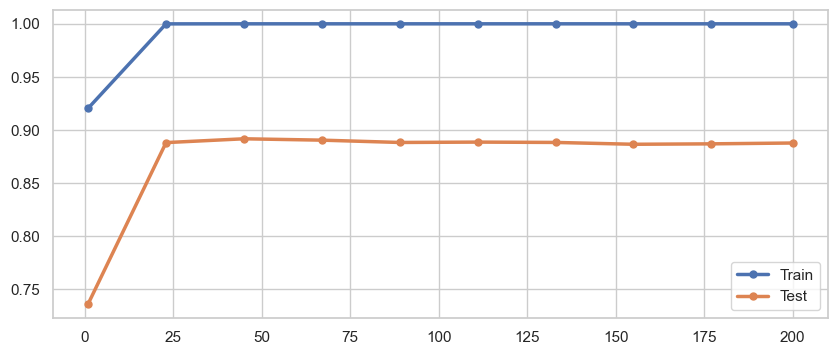

In [210]:
param_values = [int(x) for x in np.linspace(1, 200, 10)] # n_estimators

train_scores = []
test_scores = []

for c in param_values:
    model = RandomForestClassifier(random_state=42, n_estimators=c) #cek param n estimator
    model.fit(X_train, y_train)

    # eval on train
    y_pred_train_proba = model.predict_proba(X_train)
    train_auc = roc_auc_score(y_train, y_pred_train_proba[:,1])
    train_scores.append(train_auc)

    # eval on test
    y_pred_proba = model.predict_proba(X_test)
    test_auc = roc_auc_score(y_test, y_pred_proba[:,1])
    test_scores.append(test_auc)

    # print('param value: ' + str(c) + '; train: ' + str(train_auc) + '; test: '+ str(test_auc))

fig = plt.figure(figsize =(10, 4))
plt.plot(param_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
plt.plot(param_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    
plt.legend()
plt.show()

Best value for `n_estimator` = 23

- **max_depth**

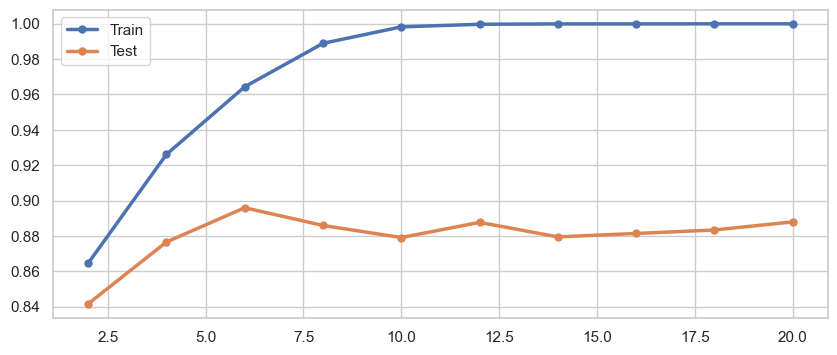

In [211]:
param_values = [int(x) for x in np.linspace(2, 20, 10)] # max_depth

train_scores = []
test_scores = []

for c in param_values:
    model = RandomForestClassifier(random_state=42, n_estimators= 23, max_depth = c) # cek param max_depth
    model.fit(X_train, y_train)

    # eval on train
    y_pred_train_proba = model.predict_proba(X_train)
    train_auc = roc_auc_score(y_train, y_pred_train_proba[:,1])
    train_scores.append(train_auc)

    # eval on test
    y_pred_proba = model.predict_proba(X_test)
    test_auc = roc_auc_score(y_test, y_pred_proba[:,1])
    test_scores.append(test_auc)

    # print('param value: ' + str(c) + '; train: ' + str(train_auc) + '; test: '+ str(test_auc))

fig = plt.figure(figsize =(10, 4))
plt.plot(param_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
plt.plot(param_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    
plt.legend()
plt.show()

Best value for `max_depth` = 4

- **min_samples_split**

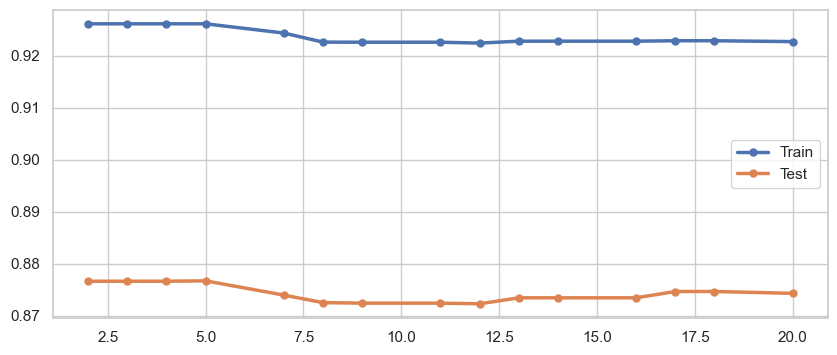

In [212]:
param_values = [int(x) for x in np.linspace(2, 20, 15)] # min_samples_split

train_scores = []
test_scores = []

for c in param_values:
    model = RandomForestClassifier(random_state=42, n_estimators= 23, max_depth = 4, min_samples_split = c) # cek param min_sample_split
    model.fit(X_train, y_train)

    # eval on train
    y_pred_train_proba = model.predict_proba(X_train)
    train_auc = roc_auc_score(y_train, y_pred_train_proba[:,1])
    train_scores.append(train_auc)

    # eval on test
    y_pred_proba = model.predict_proba(X_test)
    test_auc = roc_auc_score(y_test, y_pred_proba[:,1])
    test_scores.append(test_auc)

    # print('param value: ' + str(c) + '; train: ' + str(train_auc) + '; test: '+ str(test_auc))

fig = plt.figure(figsize =(10, 4))
plt.plot(param_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
plt.plot(param_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    
plt.legend()
plt.show()

Best value for `min_samples_split` = 13

- **min_samples_leaf**

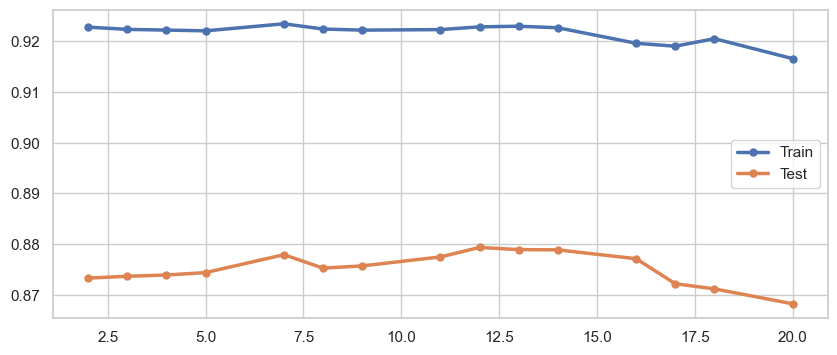

In [213]:
param_values = [int(x) for x in np.linspace(2, 20, 15)] # min_samples_leaf

train_scores = []
test_scores = []

for c in param_values:
    model = RandomForestClassifier(random_state=42, n_estimators= 23, max_depth = 4, min_samples_split = 13, min_samples_leaf = c) # cek param min_sample_leaf
    model.fit(X_train, y_train)

    # eval on train
    y_pred_train_proba = model.predict_proba(X_train)
    train_auc = roc_auc_score(y_train, y_pred_train_proba[:,1])
    train_scores.append(train_auc)

    # eval on test
    y_pred_proba = model.predict_proba(X_test)
    test_auc = roc_auc_score(y_test, y_pred_proba[:,1])
    test_scores.append(test_auc)

    # print('param value: ' + str(c) + '; train: ' + str(train_auc) + '; test: '+ str(test_auc))

fig = plt.figure(figsize =(10, 4))
plt.plot(param_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
plt.plot(param_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    
plt.legend()
plt.show()

Best value for `min_samples_leaf` = 11

#### **Manually Tuning**

Melakukan tuning kembali menggunakan hyperparameter best/optimal sebelumnya untuk melihat perubahan evaluasi model

In [214]:
n_estimators = [23]
criterion = ['gini', 'entropy']
max_depth = [4]
min_samples_split = [13]
min_samples_leaf = [11]

hyperparameters = dict(n_estimators=n_estimators, criterion=criterion, max_depth=max_depth,
                       min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf)

rf = RandomForestClassifier(random_state=42)
rf_model_ht2 = RandomizedSearchCV(rf, hyperparameters, scoring='precision', random_state=42, cv=5)
rf_model_ht2.fit(X_train, y_train)

print("Best: %f using %s" % (rf_model_ht2.best_score_, rf_model_ht2.best_params_))

Best: 0.834117 using {'n_estimators': 23, 'min_samples_split': 13, 'min_samples_leaf': 11, 'max_depth': 4, 'criterion': 'entropy'}


In [215]:
rf_model_ht2 = RandomForestClassifier(n_estimators = 23, min_samples_split = 13, 
                                      min_samples_leaf = 11, max_depth = 4, 
                                      criterion = 'gini', random_state = 42) 
rf_model_ht2.fit(X_train, y_train)

RandomForestClassifier(max_depth=4, min_samples_leaf=11, min_samples_split=13,
                       n_estimators=23, random_state=42)

In [216]:
eval_classification(rf_model_ht2, "Random Forest (HT2)")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.824000,0.887000,-0.063000
1,Precision,0.865000,0.679000,0.186000
2,Recall,0.558000,0.458000,0.100000
3,F1 Score,0.679000,0.547000,0.132000
4,F1 Score (crossval),0.456000,0.391000,0.065000
5,ROC AUC,0.922000,0.877000,0.045000
6,ROC AUC (crossval),0.881000,0.856000,0.025000


### **3. Logistic Regression**

#### **Tuning CV**

In [217]:
# List of hyperparameter
penalty = ['l1', 'l2']
C = [float(x) for x in np.linspace(0.0001, 1, 100)]
hyperparameters = dict(penalty=penalty, C=C)

logreg = LogisticRegression(random_state=42)
cv = StratifiedKFold(n_splits=5)

logreg_model_ht = RandomizedSearchCV(logreg, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1", random_state=1)
# logreg_model_ht = GridSearchCV(logreg, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1")

grid_result = logreg_model_ht.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_f1']
# stds = grid_result.cv_results_['std_test_f1']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.639738 using {'penalty': 'l2', 'C': 0.47479999999999994}


Best: 0.498615 using {'penalty': 'l2', 'C': 0.47479999999999994}

In [218]:
logreg_model_ht = LogisticRegression(penalty = 'l2', C = 0.47479999999999994, random_state=42)
logreg_model_ht.fit(X_train,y_train)

LogisticRegression(C=0.47479999999999994, random_state=42)

In [219]:
eval_classification(logreg_model_ht, "Logistic Regression (HT)")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.790000,0.862000,-0.072000
1,Precision,0.737000,0.529000,0.208000
2,Recall,0.575000,0.663000,-0.088000
3,F1 Score,0.646000,0.588000,0.058000
4,F1 Score (crossval),0.501000,0.481000,0.020000
5,ROC AUC,0.865000,0.885000,-0.020000
6,ROC AUC (crossval),0.877000,0.875000,0.002000


### **4. K-Nearest Neighbors**

#### **Tuning CV**

In [220]:
# List of hyperparameter
leaf_size = list(range(1,100))
n_neighbors = list(range(1,100))
p=[1,2,3]
algorithm = ['auto', 'ball_tree', 'kd_tree', 'brute']
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p, algorithm=algorithm)

knn = KNeighborsClassifier()
cv = StratifiedKFold(n_splits=5)

knn_model_ht = RandomizedSearchCV(knn, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1", random_state=1)
# knn_model_ht = GridSearchCV(knn, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1")

grid_result = knn_model_ht.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_f1']
# stds = grid_result.cv_results_['std_test_f1']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.732628 using {'p': 2, 'n_neighbors': 13, 'leaf_size': 34, 'algorithm': 'brute'}


Best: 0.377400 using {'p': 2, 'n_neighbors': 13, 'leaf_size': 34, 'algorithm': 'brute'}

In [221]:
knn_model_ht = KNeighborsClassifier(p = 2, n_neighbors = 13, leaf_size = 34, algorithm = 'brute')
knn_model_ht.fit(X_train,y_train)

KNeighborsClassifier(algorithm='brute', leaf_size=34, n_neighbors=13)

In [222]:
eval_classification(knn_model_ht, "K-Nearest Neighbors (HT)")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.858000,0.857000,0.001000
1,Precision,0.781000,0.515000,0.266000
2,Recall,0.799000,0.627000,0.172000
3,F1 Score,0.790000,0.565000,0.225000
4,F1 Score (crossval),0.454000,0.386000,0.068000
5,ROC AUC,0.934000,0.839000,0.095000
6,ROC AUC (crossval),0.903000,0.818000,0.085000


### **5. Adaboost Classifier**

#### **Tuning CV**

In [223]:
# List of hyperparameter
hyperparameters = dict(n_estimators = [int(x) for x in np.linspace(start = 50, stop = 2000, num = 2000)], # Jumlah iterasi
                       learning_rate = [float(x) for x in np.linspace(start = 0.001, stop = 0.1, num = 200)],  
                       algorithm = ['SAMME', 'SAMME.R']
                      )

adab = AdaBoostClassifier(random_state=42)
cv = StratifiedKFold(n_splits=5)

adab_model_ht = RandomizedSearchCV(adab, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1", random_state=1)
# adab_model_ht = GridSearchCV(adab, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1")

grid_result = adab_model_ht.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_f1']
# stds = grid_result.cv_results_['std_test_f1']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.752648 using {'n_estimators': 1634, 'learning_rate': 0.09801005025125628, 'algorithm': 'SAMME.R'}


Best: 0.521426 using {'n_estimators': 1634, 'learning_rate': 0.09801005025125628, 'algorithm': 'SAMME.R'}

In [224]:
adab_model_htt = AdaBoostClassifier(n_estimators = 1634, learning_rate = 0.09801005025125628, algorithm = 'SAMME.R', random_state=42)
adab_model_htt.fit(X_train,y_train)

AdaBoostClassifier(learning_rate=0.09801005025125628, n_estimators=1634,
                   random_state=42)

In [225]:
# eval_classification(adab_model_ht, "Adaboost Classifier (HT)")

### **6. XGBoost Classifier**

#### **Tuning CV**

In [226]:
# List of hyperparameter
#Menjadikan ke dalam bentuk dictionary
hyperparameters = {
                    'max_depth' : [int(x) for x in np.linspace(10, 110, num = 11)],
                    'min_child_weight' : [int(x) for x in np.linspace(1, 20, num = 11)],
                    'gamma' : [float(x) for x in np.linspace(0, 1, num = 11)],
                    'tree_method' : ['auto', 'exact', 'approx', 'hist'],

                    'colsample_bytree' : [float(x) for x in np.linspace(0, 1, num = 11)],
                    'eta' : [float(x) for x in np.linspace(0, 1, num = 100)],

                    'lambda' : [float(x) for x in np.linspace(0, 1, num = 11)],
                    'alpha' : [float(x) for x in np.linspace(0, 1, num = 11)]
                    }

xgb = XGBClassifier(random_state=42)
cv = StratifiedKFold(n_splits=5)

xgb_model_ht = RandomizedSearchCV(xgb, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1", random_state=1)
# xgb_model_ht = GridSearchCV(xgb, hyperparameters, cv=cv, scoring=custom_scoring, refit="f1")

grid_result = xgb_model_ht.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_f1']
# stds = grid_result.cv_results_['std_test_f1']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.815040 using {'tree_method': 'approx', 'min_child_weight': 4, 'max_depth': 90, 'lambda': 1.0, 'gamma': 0.6000000000000001, 'eta': 0.6363636363636365, 'colsample_bytree': 0.8, 'alpha': 0.9}


Best: 0.507077 using {'tree_method': 'hist', 'min_child_weight': 6, 'max_depth': 10, 'lambda': 0.1, 'gamma': 0.1, 'eta': 0.14141414141414144, 'colsample_bytree': 0.2, 'alpha': 0.9}

In [227]:
xgb_model_ht = XGBClassifier(tree_method = 'hist', min_child_weight = 6, max_depth = 10, 
                             reg_lambda = 0.1, gamma = 0.1, eta = 0.14141414141414144, 
                             colsample_bytree = 0.2, alpha = 0.9)
xgb_model_ht.fit(X_train,y_train)

XGBClassifier(alpha=0.9, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.2, early_stopping_rounds=None,
              enable_categorical=False, eta=0.14141414141414144,
              eval_metric=None, feature_types=None, gamma=0.1, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=6, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None, ...)

In [228]:
eval_classification(xgb_model_ht, "XGBoost Classifier (HT)")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.961000,0.893000,0.068000
1,Precision,0.974000,0.677000,0.297000
2,Recall,0.906000,0.530000,0.376000
3,F1 Score,0.939000,0.595000,0.344000
4,F1 Score (crossval),0.732000,0.519000,0.213000
5,ROC AUC,0.991000,0.890000,0.101000
6,ROC AUC (crossval),0.966000,0.890000,0.076000


#### **Learning Curve**

- **max_depth**

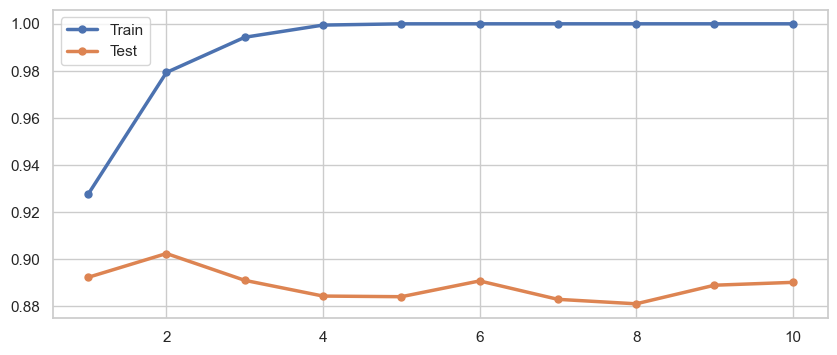

In [229]:
param_values = [int(x) for x in np.linspace(1, 10, 10)] # max_depth

train_scores = []
test_scores = []

for c in param_values:
    model = XGBClassifier(max_depth=c, random_state=42) 
    model.fit(X_train, y_train)

    # eval on train
    y_pred_train_proba = model.predict_proba(X_train)
    train_auc = roc_auc_score(y_train, y_pred_train_proba[:,1])
    train_scores.append(train_auc)

    # eval on test
    y_pred_proba = model.predict_proba(X_test)
    test_auc = roc_auc_score(y_test, y_pred_proba[:,1])
    test_scores.append(test_auc)

    # print('param value: ' + str(c) + '; train: ' + str(train_auc) + '; test: '+ str(test_auc))

fig = plt.figure(figsize =(10, 4))
plt.plot(param_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
plt.plot(param_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    
plt.legend()
plt.show()

Best value for `max_depth` = 1

- **gamma**

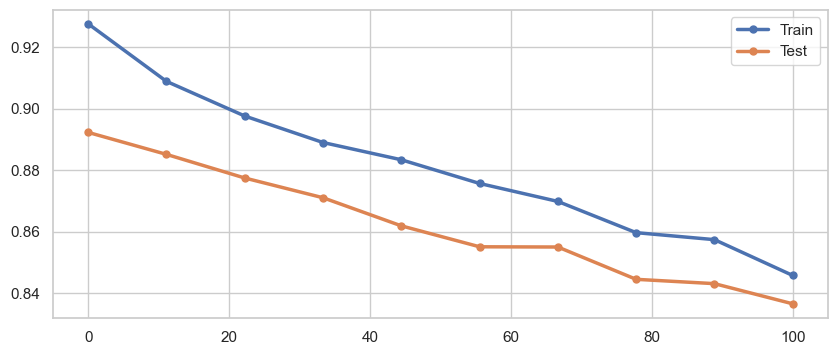

In [230]:
param_values= [float(x) for x in np.linspace(0, 100, num = 10)]

train_scores = []
test_scores = []

for c in param_values:
    model = XGBClassifier(max_depth=1, gamma=c, random_state=42) 
    model.fit(X_train, y_train)

    # eval on train
    y_pred_train_proba = model.predict_proba(X_train)
    train_auc = roc_auc_score(y_train, y_pred_train_proba[:,1])
    train_scores.append(train_auc)

    # eval on test
    y_pred_proba = model.predict_proba(X_test)
    test_auc = roc_auc_score(y_test, y_pred_proba[:,1])
    test_scores.append(test_auc)

    # print('param value: ' + str(c) + '; train: ' + str(train_auc) + '; test: '+ str(test_auc))

fig = plt.figure(figsize =(10, 4))
plt.plot(param_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
plt.plot(param_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    
plt.legend()
plt.show()

Best value for `gamma` = 0

- **tree_method**

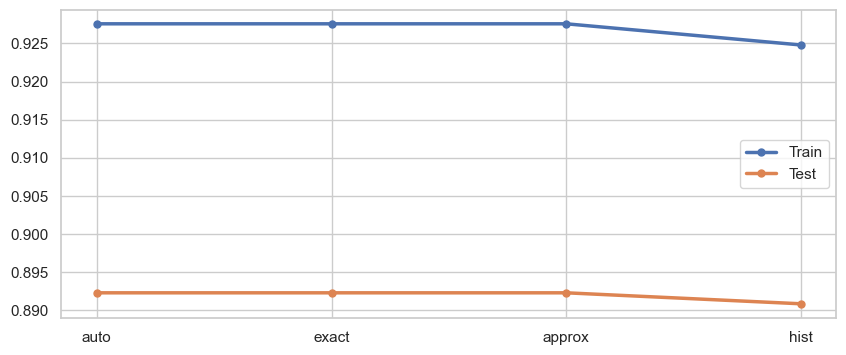

In [231]:
param_values=['auto', 'exact', 'approx', 'hist']

train_scores = []
test_scores = []

for c in param_values:
    model = XGBClassifier(max_depth=1, gamma=0, tree_method=c, random_state=42) 
    model.fit(X_train, y_train)

    # eval on train
    y_pred_train_proba = model.predict_proba(X_train)
    train_auc = roc_auc_score(y_train, y_pred_train_proba[:,1])
    train_scores.append(train_auc)

    # eval on test
    y_pred_proba = model.predict_proba(X_test)
    test_auc = roc_auc_score(y_test, y_pred_proba[:,1])
    test_scores.append(test_auc)

    # print('param value: ' + str(c) + '; train: ' + str(train_auc) + '; test: '+ str(test_auc))

fig = plt.figure(figsize =(10, 4))
plt.plot(param_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
plt.plot(param_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    
plt.legend()
plt.show()

Best value for `tree_method` = auto

- **min_child_weight**

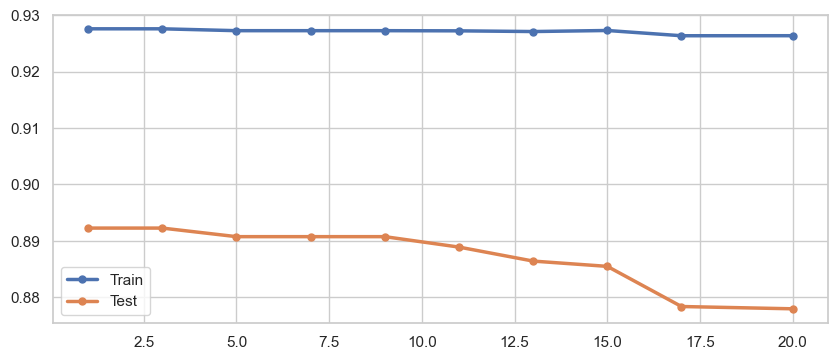

In [232]:
param_values= [int(x) for x in np.linspace(1, 20, num = 10)]

train_scores = []
test_scores = []

for c in param_values:
    model = XGBClassifier(max_depth=1, gamma=0, tree_method='auto', min_child_weight=c, random_state=42) 
    model.fit(X_train, y_train)

    # eval on train
    y_pred_train_proba = model.predict_proba(X_train)
    train_auc = roc_auc_score(y_train, y_pred_train_proba[:,1])
    train_scores.append(train_auc)

    # eval on test
    y_pred_proba = model.predict_proba(X_test)
    test_auc = roc_auc_score(y_test, y_pred_proba[:,1])
    test_scores.append(test_auc)

    # print('param value: ' + str(c) + '; train: ' + str(train_auc) + '; test: '+ str(test_auc))

fig = plt.figure(figsize =(10, 4))
plt.plot(param_values, train_scores, label='Train', linewidth=2.5, marker ='.', markersize=10)
plt.plot(param_values, test_scores, label='Test', linewidth=2.5, marker ='.', markersize=10)
    
plt.legend()
plt.show()

Best value for `min_child_weight` = 7

#### **Manually Tuning**

Melakukan tuning kembali menggunakan hyperparameter best/optimal sebelumnya untuk melihat perubahan evaluasi model

In [233]:
precision_scorer = make_scorer(precision_score, zero_division=0)
prec_scoring = {"precision": precision_scorer}

hyperparameters = {
                    'max_depth' : [1],
                    'gamma' : [0],
                    'tree_method' : ['auto'],
                    'min_child_weight' : [7],

                    'colsample_bytree' : [float(x) for x in np.linspace(0, 1, num = 5)],
                    'eta' : [float(x) for x in np.linspace(0, 1, num = 5)],

                    'lambda' : [float(x) for x in np.linspace(0, 1, num = 5)],
                    'alpha' : [float(x) for x in np.linspace(0, 1, num = 5)]
                    }

from xgboost import XGBClassifier
xgb = XGBClassifier(random_state=42)
xgb_model_ht2 = RandomizedSearchCV(xgb, hyperparameters, cv=7, random_state=42, scoring=prec_scoring, refit="precision", n_iter=20)
xgb_model_ht2.fit(X_train,y_train)

print("Best: %f using %s" % (xgb_model_ht2.best_score_, xgb_model_ht2.best_params_))

Best: 0.822977 using {'tree_method': 'auto', 'min_child_weight': 7, 'max_depth': 1, 'lambda': 0.0, 'gamma': 0, 'eta': 0.75, 'colsample_bytree': 0.75, 'alpha': 0.0}


In [234]:
xgb_model_ht2 = XGBClassifier(tree_method = 'auto', min_child_weight = 7, 
                              max_depth = 1, reg_lambda = 0.25, gamma = 0, 
                              eta = 0.25, colsample_bytree = 0.25, 
                              alpha = 0.0, random_state = 42) 
xgb_model_ht2.fit(X_train, y_train)

XGBClassifier(alpha=0.0, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.25, early_stopping_rounds=None,
              enable_categorical=False, eta=0.25, eval_metric=None,
              feature_types=None, gamma=0, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=1,
              max_leaves=None, min_child_weight=7, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)

In [235]:
eval_classification(xgb_model_ht2, "XGBoost Classifier (HT2)")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.838000,0.850000,-0.012000
1,Precision,0.804000,0.495000,0.309000
2,Recall,0.680000,0.554000,0.126000
3,F1 Score,0.737000,0.523000,0.214000
4,F1 Score (crossval),0.535000,0.502000,0.033000
5,ROC AUC,0.921000,0.886000,0.035000
6,ROC AUC (crossval),0.903000,0.886000,0.017000


## **📌 Model Additional**

### **Stacking**

Melakukan kombinasi dari banyak model klasifikasi

**Choosing the baseline**

In [236]:
from sklearn.ensemble import StackingClassifier

def algorithm_pipeline(X_train_data, X_test_data, y_train_data, y_test_data, model, hyperparameters, cv=5, scoring_fit='recall'):
    rs = RandomizedSearchCV(estimator=model, param_distributions=hyperparameters, cv=cv, n_jobs=-1, scoring=scoring_fit, verbose=0, random_state=42) # Use GridSearch better if you have more resource & time
    rs.fit(X_train_data, y_train_data)
    best_model = rs.best_estimator_
    
    pred = rs.predict(X_test_data)
    pred_proba = rs.predict(X_test_data)
    score = roc_auc_score(y_test_data, pred_proba)
    return [best_model, pred, score]

models_to_train = [LogisticRegression(), 
                   KNeighborsClassifier(), 
                   DecisionTreeClassifier(), 
                   RandomForestClassifier(), 
                   AdaBoostClassifier(random_state=42), 
                   XGBClassifier(random_state=42)
                  ]

# Defining the hyperparameters to optimize
grid_parameters = [
    { # Logistic Regression
        'penalty': ['l2','l1','elasticnet'],
        'C': [float(x) for x in np.linspace(0.0001, 1, 100)]
    },
    { # KNearestNeighbor
        'leaf_size': list(range(1,100)),
        'n_neighbors': list(range(1,100)),
        'p': [1,2,3],
        'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
    }, 
    { # Decision Tree
        'max_depth': [int(x) for x in np.linspace(1, 32, 32, endpoint=True)],
        'min_samples_split': np.linspace(0.1, 1.0, 10, endpoint=True),
        'min_samples_leaf': np.linspace(0.1, 0.5, 5, endpoint=True),
        'max_features': list(range(1,X_train.shape[1]))
    }, 
    { # Random Forest
        'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 2000, num = 20)],
        'max_features': ['auto', 'sqrt', 'log2'],
        'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
        'criterion': ['gini','entropy'],
        'min_samples_split': [int(x) for x in np.linspace(start = 2, stop = 10, num = 5)],
        'min_samples_leaf': [int(x) for x in np.linspace(start = 1, stop = 10, num = 5)],
        'bootstrap': [True],
        'n_jobs': [-1]
    },
    { # Adaboost
       'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 2000, num = 20)],
       'learning_rate': [float(x) for x in np.linspace(start = 0.001, stop = 0.1, num = 20)],
       'algorithm': ['SAMME', 'SAMME.R']
    },
    { # XGBoost
        'max_depth' : [int(x) for x in np.linspace(10, 110, num = 11)],
        'min_child_weight' : [int(x) for x in np.linspace(1, 20, num = 11)],
        'gamma' : [float(x) for x in np.linspace(0, 1, num = 11)],
        'tree_method' : ['auto', 'exact', 'approx', 'hist'],

        'colsample_bytree' : [float(x) for x in np.linspace(0, 1, num = 11)],
        'eta' : [float(x) for x in np.linspace(0, 1, num = 100)],

        'lambda' : [float(x) for x in np.linspace(0, 1, num = 11)],
        'alpha' : [float(x) for x in np.linspace(0, 1, num = 11)]
    }
]

models_preds_scores = []

for i, model in enumerate(models_to_train):
    hyperparameters = grid_parameters[i]
    result = algorithm_pipeline(X_train, X_test, y_train, y_test,  model, hyperparameters, cv=5)
    models_preds_scores.append(result)

for result in models_preds_scores:
    print('Model: {0}, Score: {1}'.format(type(result[0]).__name__, result[2])) # score in training data

Model: LogisticRegression, Score: 0.7620608484357598
Model: KNeighborsClassifier, Score: 0.7521134960008099
Model: DecisionTreeClassifier, Score: 0.7041358712159562
Model: RandomForestClassifier, Score: 0.7500759339880532
Model: AdaBoostClassifier, Score: 0.7492406601194695
Model: XGBClassifier, Score: 0.7324972157537714


**Stacking Implementation**

In [237]:
# Model: LogisticRegression, Score: 0.6424818771943119
# Model: KNeighborsClassifier, Score: 0.6333131267207194
# Model: DecisionTreeClassifier, Score: 0.5
# Model: RandomForestClassifier, Score: 0.7226263544745017
# Model: AdaBoostClassifier, Score: 0.7249753731908767
# Model: XGBClassifier, Score: 0.7179030587759844

# define level-1 algorithm
level1 = list()
level1.append(('lr', LogisticRegression()))
level1.append(('rf', RandomForestClassifier()))
level1.append(('ab', AdaBoostClassifier()))
level1.append(('xg', XGBClassifier()))

# define level-2 algorithm
level2 = XGBClassifier()

# Fit model
stacking_model = StackingClassifier(estimators=level1, final_estimator=level2, cv=5)
stacking_model.fit(X_train,y_train)

StackingClassifier(cv=5,
                   estimators=[('lr', LogisticRegression()),
                               ('rf', RandomForestClassifier()),
                               ('ab', AdaBoostClassifier()),
                               ('xg',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=N...
                                                 gpu_id=None, grow_policy=None,
                                                 importance_type=None,
                                                 interaction_constraints=None,
                                                 learning_rate=None,
                                                 max_bin=None,
                                                 max_cat_threshold=None,
                                                 max_cat_to_onehot=None,
                                                 max_delta_step=None,
                                                 max_depth=None,
                                                 max_leaves=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 n_estimators=100, n_jobs=None,
                                                 num_parallel_tree=None,
                                                 predictor=None,
                                                 random_state=None, ...))

In [238]:
eval_classification(stacking_model, "Stacking Classifier")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.981000,0.878000,0.103000
1,Precision,0.962000,0.606000,0.356000
2,Recall,0.983000,0.518000,0.465000
3,F1 Score,0.972000,0.558000,0.414000
4,F1 Score (crossval),0.800000,0.481000,0.319000
5,ROC AUC,0.999000,0.859000,0.140000
6,ROC AUC (crossval),0.973000,0.853000,0.120000


### **Voting Classifier**

In [239]:
from sklearn.ensemble import VotingClassifier

vote_model = VotingClassifier(
    estimators = [
        ('lr', LogisticRegression(C=4.281332398719396)), 
        ('knn', KNeighborsClassifier(algorithm='brute', leaf_size=48, n_neighbors=17, p=1)), 
        ('dt', DecisionTreeClassifier()),
        ('rf', RandomForestClassifier()),
        ('ab', AdaBoostClassifier()),
        ('xg', XGBClassifier()),
    ], voting = 'soft')

vote_model.fit(X_train, y_train)

VotingClassifier(estimators=[('lr', LogisticRegression(C=4.281332398719396)),
                             ('knn',
                              KNeighborsClassifier(algorithm='brute',
                                                   leaf_size=48, n_neighbors=17,
                                                   p=1)),
                             ('dt', DecisionTreeClassifier()),
                             ('rf', RandomForestClassifier()),
                             ('ab', AdaBoostClassifier()),
                             ('xg',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynod...
                                            gpu_id=None, grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=None, ...))],
                 voting='soft')

In [240]:
eval_classification(vote_model, "Voting Classifier")

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.997000,0.887000,0.110000
1,Precision,0.996000,0.622000,0.374000
2,Recall,0.994000,0.614000,0.380000
3,F1 Score,0.995000,0.618000,0.377000
4,F1 Score (crossval),0.965000,0.546000,0.419000
5,ROC AUC,1.000000,0.894000,0.106000
6,ROC AUC (crossval),0.999000,0.888000,0.111000


## **📌 Model Comparison**

Melihat summary metrics dari berbagai algoritma yang telah dibuat

\* HT --> Hyperparameter Tuning

\* HT2 --> Manually Tuning

**Perbandingan `precision`, `recall` dan `f1 score` pada train test tertinggi**

- Tanpa Tuning

In [241]:
results_eval = pd.DataFrame({
    "Models" : train_modelname_list,
    "Precision (Train)": train_precision_list, 
    "Precision (Test)": test_precision_list, 
    "Recall (Train)": train_recall_list, 
    "Recall (Test)": test_recall_list, 
    "F1 Score (Train)" : train_f1_score_list,
    "F1 Score (Test)" : test_f1_score_list
})

results_eval.drop_duplicates(inplace = True)

results_eval_notht = results_eval[~results_eval["Models"].str.contains("HT")]

results_eval_notht.sort_values(by=["F1 Score (Test)", "Precision (Test)", "Recall (Test)"], ascending=[False, False, False]).reset_index(drop = True).style.background_gradient(cmap="Purples")

,Models,Precision (Train),Precision (Test),Recall (Train),Recall (Test),F1 Score (Train),F1 Score (Test)
0,Random Forest,0.996000,0.686000,0.994000,0.578000,0.995000,0.627000
1,Voting Classifier,0.996000,0.622000,0.994000,0.614000,0.995000,0.618000
2,XGBoost Classifier,0.994000,0.644000,0.996000,0.566000,0.995000,0.603000
3,Logistic Regression,0.737000,0.519000,0.589000,0.651000,0.655000,0.578000
4,Support Vector Machine,0.828000,0.560000,0.682000,0.566000,0.748000,0.563000
5,Stacking Classifier,0.962000,0.606000,0.983000,0.518000,0.972000,0.558000
6,MLP Classifier,0.941000,0.481000,0.965000,0.602000,0.953000,0.535000
7,Adaboost Classifier,0.834000,0.484000,0.746000,0.554000,0.788000,0.517000
8,K-Nearest Neighbors,0.805000,0.403000,0.924000,0.578000,0.860000,0.475000
9,Naive Bayes,0.653000,0.413000,0.443000,0.518000,0.528000,0.460000


- Dengan Tuning

In [242]:
results_eval_ht = results_eval[results_eval["Models"].str.contains("HT")]
results_eval_ht.sort_values(by=["F1 Score (Test)", "Precision (Test)", "Recall (Test)"], ascending=[False, False, False]).reset_index(drop = True).style.background_gradient(cmap="Purples")

,Models,Precision (Train),Precision (Test),Recall (Train),Recall (Test),F1 Score (Train),F1 Score (Test)
0,XGBoost Classifier (HT),0.974000,0.677000,0.906000,0.530000,0.939000,0.595000
1,Logistic Regression (HT),0.737000,0.529000,0.575000,0.663000,0.646000,0.588000
2,K-Nearest Neighbors (HT),0.781000,0.515000,0.799000,0.627000,0.790000,0.565000
3,Random Forest (HT2),0.865000,0.679000,0.558000,0.458000,0.679000,0.547000
4,Random Forest (HT),0.956000,0.583000,0.884000,0.506000,0.918000,0.542000
5,XGBoost Classifier (HT2),0.804000,0.495000,0.680000,0.554000,0.737000,0.523000
6,Decision Tree (HT),1.000000,0.433000,0.990000,0.506000,0.995000,0.467000
7,Decision Tree (HT2),0.796000,0.500000,0.525000,0.422000,0.632000,0.458000


**Perbandingan `precision`, `recall` dan `f1 score` pada train test dengan Total Difference terendah**

- Tanpa Tuning

In [243]:
results_diff = pd.DataFrame({
    "Models" : train_modelname_list,
    "Precision (Train)": train_precision_list, 
    "Precision (Test)": test_precision_list, 
    "Recall (Train)": train_recall_list, 
    "Recall (Test)": test_recall_list, 
    "F1 Score (Train)" : train_f1_score_list,
    "F1 Score (Test)" : test_f1_score_list
})

results_diff.drop_duplicates(inplace = True)

results_diff["Total Diff"] = (results_diff["Precision (Train)"] - results_diff["Precision (Test)"]) + \
                   (results_diff["Recall (Train)"] - results_diff["Recall (Test)"]) + \
                   (results_diff["F1 Score (Train)"] - results_diff["F1 Score (Test)"])

results_diff_notht = results_diff[~results_diff["Models"].str.contains("HT")]

results_diff_notht.sort_values(by=["Total Diff", "F1 Score (Test)", "Precision (Test)", "Recall (Test)"], ascending=[True, False, False, False]).reset_index(drop = True).style.background_gradient(cmap="Greens")

,Models,Precision (Train),Precision (Test),Recall (Train),Recall (Test),F1 Score (Train),F1 Score (Test),Total Diff
0,Logistic Regression,0.737000,0.519000,0.589000,0.651000,0.655000,0.578000,0.233000
1,Naive Bayes,0.653000,0.413000,0.443000,0.518000,0.528000,0.460000,0.233000
2,Support Vector Machine,0.828000,0.560000,0.682000,0.566000,0.748000,0.563000,0.569000
3,Adaboost Classifier,0.834000,0.484000,0.746000,0.554000,0.788000,0.517000,0.813000
4,Random Forest,0.996000,0.686000,0.994000,0.578000,0.995000,0.627000,1.094000
5,Voting Classifier,0.996000,0.622000,0.994000,0.614000,0.995000,0.618000,1.131000
6,K-Nearest Neighbors,0.805000,0.403000,0.924000,0.578000,0.860000,0.475000,1.133000
7,XGBoost Classifier,0.994000,0.644000,0.996000,0.566000,0.995000,0.603000,1.172000
8,Stacking Classifier,0.962000,0.606000,0.983000,0.518000,0.972000,0.558000,1.235000
9,MLP Classifier,0.941000,0.481000,0.965000,0.602000,0.953000,0.535000,1.241000


- Dengan Tuning

In [244]:
results_diff_ht = results_diff[results_diff["Models"].str.contains("HT")]

results_diff_ht.sort_values(by=["Total Diff", "F1 Score (Test)", "Precision (Test)", "Recall (Test)"], ascending=[True, False, False, False]).reset_index(drop = True).style.background_gradient(cmap="Greens")

,Models,Precision (Train),Precision (Test),Recall (Train),Recall (Test),F1 Score (Train),F1 Score (Test),Total Diff
0,Logistic Regression (HT),0.737000,0.529000,0.575000,0.663000,0.646000,0.588000,0.178000
1,Random Forest (HT2),0.865000,0.679000,0.558000,0.458000,0.679000,0.547000,0.418000
2,Decision Tree (HT2),0.796000,0.500000,0.525000,0.422000,0.632000,0.458000,0.573000
3,XGBoost Classifier (HT2),0.804000,0.495000,0.680000,0.554000,0.737000,0.523000,0.649000
4,K-Nearest Neighbors (HT),0.781000,0.515000,0.799000,0.627000,0.790000,0.565000,0.663000
5,XGBoost Classifier (HT),0.974000,0.677000,0.906000,0.530000,0.939000,0.595000,1.017000
6,Random Forest (HT),0.956000,0.583000,0.884000,0.506000,0.918000,0.542000,1.127000
7,Decision Tree (HT),1.000000,0.433000,0.990000,0.506000,0.995000,0.467000,1.579000


**Evaluation Metrics pada Train Urutan Tertinggi**

In [245]:
results_train = pd.DataFrame({
    'Model (Train)': train_modelname_list, 
    'Accuracy': train_accuracy_list,
    'Precision': train_precision_list, 
    'Recall': train_recall_list,
    'F1 Score': train_f1_score_list, 
    'Cross Val F1 (k=5)': train_cross_val_f1_list,
    'ROC AUC': train_roc_auc_score_list,
    'Cross Val ROC AUC (k=5)': train_cross_val_rocauc_list
})

results_train.drop_duplicates(inplace = True)

results_train.sort_values(by=['F1 Score', 'Precision', 'Recall'], ascending=False).reset_index(drop = True).style.background_gradient(cmap='Blues')

,Model (Train),Accuracy,Precision,Recall,F1 Score,Cross Val F1 (k=5),ROC AUC,Cross Val ROC AUC (k=5)
0,Decision Tree,0.997000,1.000000,0.990000,0.995000,0.972000,1.000000,1.000000
1,Gradient Boosting Classifier,0.997000,1.000000,0.990000,0.995000,0.972000,1.000000,1.000000
2,Decision Tree (HT),0.997000,1.000000,0.990000,0.995000,0.972000,1.000000,1.000000
3,Random Forest,0.997000,0.996000,0.994000,0.995000,0.973000,1.000000,1.000000
4,Voting Classifier,0.997000,0.996000,0.994000,0.995000,0.965000,1.000000,0.999000
5,XGBoost Classifier,0.997000,0.994000,0.996000,0.995000,0.973000,1.000000,1.000000
6,Stacking Classifier,0.981000,0.962000,0.983000,0.972000,0.800000,0.999000,0.973000
7,MLP Classifier,0.968000,0.941000,0.965000,0.953000,0.689000,0.994000,0.951000
8,XGBoost Classifier (HT),0.961000,0.974000,0.906000,0.939000,0.732000,0.991000,0.966000
9,Random Forest (HT),0.948000,0.956000,0.884000,0.918000,0.618000,0.990000,0.975000


**Evaluation Metrics pada Test Urutan Tertinggi**

In [246]:
results_test = pd.DataFrame({
    'Model (Test)': test_modelname_list, 
    'Accuracy': test_accuracy_list,
    'Precision': test_precision_list, 
    'Recall': test_recall_list,
    'F1 Score': test_f1_score_list, 
    'Cross Val F1 (k=5)': test_cross_val_f1_list,
    'ROC AUC': test_roc_auc_score_list,
    'Cross Val ROC AUC (k=5)': test_cross_val_rocauc_list
})

results_test.drop_duplicates(inplace = True)

results_test.sort_values(by=['F1 Score', 'Precision', 'Recall'], ascending=False).reset_index(drop = True).style.background_gradient(cmap='Oranges')

,Model (Test),Accuracy,Precision,Recall,F1 Score,Cross Val F1 (k=5),ROC AUC,Cross Val ROC AUC (k=5)
0,Random Forest,0.898000,0.686000,0.578000,0.627000,0.542000,0.887000,0.882000
1,Voting Classifier,0.887000,0.622000,0.614000,0.618000,0.546000,0.894000,0.888000
2,XGBoost Classifier,0.889000,0.644000,0.566000,0.603000,0.537000,0.891000,0.875000
3,XGBoost Classifier (HT),0.893000,0.677000,0.530000,0.595000,0.519000,0.890000,0.890000
4,Logistic Regression (HT),0.862000,0.529000,0.663000,0.588000,0.481000,0.885000,0.875000
5,Logistic Regression,0.859000,0.519000,0.651000,0.578000,0.481000,0.885000,0.876000
6,K-Nearest Neighbors (HT),0.857000,0.515000,0.627000,0.565000,0.386000,0.839000,0.818000
7,Support Vector Machine,0.869000,0.560000,0.566000,0.563000,0.438000,0.872000,0.857000
8,Stacking Classifier,0.878000,0.606000,0.518000,0.558000,0.481000,0.859000,0.853000
9,Random Forest (HT2),0.887000,0.679000,0.458000,0.547000,0.391000,0.877000,0.856000


**Observation**

Berdasarkan metode test modelling yang telah dilakukan, dapat disimpulkan bahwa model `XGBoost Classifier (HT2)` memiliki hasil `Precisision`, `Recall`, dan `F1 Score` yang paling stabil dan lumayan besar.

**Random Forest (HT)**

```
RandomForestClassifier(n_estimators = 98, min_samples_split = 18, 
                     min_samples_leaf = 4, max_depth = 90, 
                     criterion = 'entropy', random_state=42)
```

- Precision
    Train : 0.898000, Test : 0.933000 (gap : -0.035000)

- Recall
    Train : 0.454000, Test : 0.337000 (gap : 0.117000)

- F1 Score
    Train : 0.603000, Test : 0.496000 (gap : 0.107000)

- F1 Score (Cross Validation)
    Train : 0.618000, Test : 0.454000 (gap : 0.164000)
    
Total Different/Gap Train vs Test = -0.001000

- Accuracy
    Train : 0.911000, Test : 0.898000 (gap : 0.013000)
    
- ROC AUC
    Train : 0.972000, Test : 0.899000 (gap : 0.073000)

- ROC AUC (Cross Validation)
    Train : 0.975000, Test : 0.891000 (gap : 0.084000)
    
Sehingga untuk selanjutnya, di tahap `Feature Importance` akan menggunakan metode `Random Forest` sebagai model terbaik untuk menemukan feature importance beserta rekomendasi bisnis.

## **📌 Model Selection**

Dari ketiga model di atas, kami membandingkan nilai metric `precision`, `recall`, serta `gap` antara nilai train dan test pada masing-masing metric. Dari hasil perbandingan tersebut, kami dapatkan bahwasanya model yang paling optimal untuk studi kasus kami adalah `Random Forest`

In [247]:
best_model = rf_model_ht
best_model_name = "Random Forest (HT)"

In [248]:
import pickle
pickle.dump(best_model, open('best_model.pkl', 'wb'))

In [249]:
best_model_temp = pickle.load(open('best_model.pkl', 'rb'))

In [250]:
eval_classification(best_model, best_model_name, False)

,Evaluation Metrics,Train,Test,Diff Range
0,Accuracy,0.948000,0.873000,0.075000
1,Precision,0.956000,0.583000,0.373000
2,Recall,0.884000,0.506000,0.378000
3,F1 Score,0.918000,0.542000,0.376000
4,F1 Score (crossval),0.618000,0.458000,0.160000
5,ROC AUC,0.990000,0.893000,0.097000
6,ROC AUC (crossval),0.975000,0.887000,0.088000


#### **Performance of Testing Model**

Classification Report Testing Model (Random Forest (HT)):

Accuracy = 0.873
Precision = 0.583
Recall = 0.506
F1 Score = 0.542
Cross Val F1 (k=5) = 0.458
ROC AUC = 0.893
Cross Val ROC AUC (k=5) = 0.887

              precision    recall  f1-score   support

           0       0.92      0.94      0.93       476
           1       0.58      0.51      0.54        83

    accuracy                           0.87       559
   macro avg       0.75      0.72      0.73       559
weighted avg       0.87      0.87      0.87       559

==== Actual Data (Test) =====
Total = 559
No Response = 476
Response = 83
==== Predicted Data (Test) =====
TP = 42, FP = 30, TN = 446, FN = 41
Predictly Correct = 488
Predictly Wrong = 71 



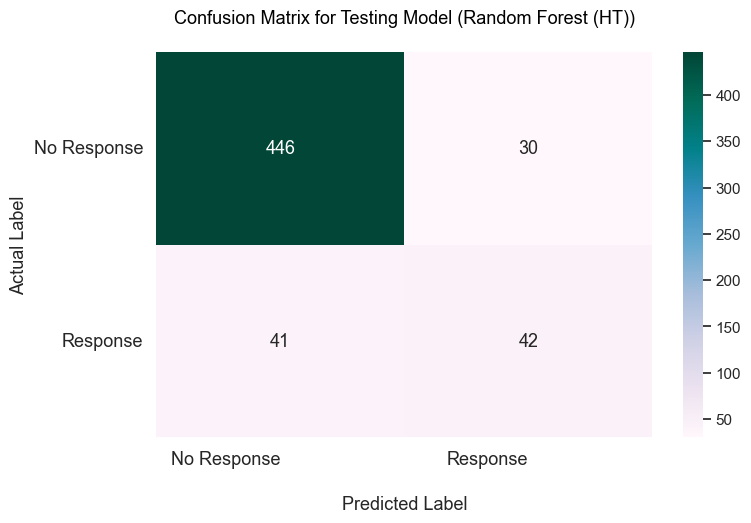

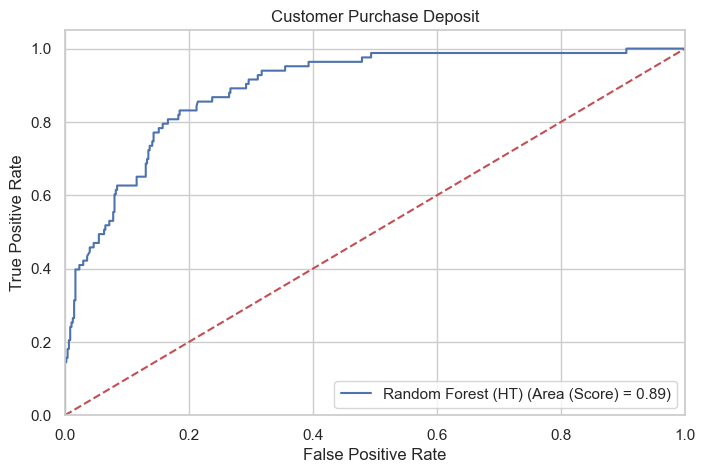

In [251]:
model_eval_test(best_model, best_model_name, X_test, y_test)

In [252]:
acc_best_train=round(best_model.score(X_train,y_train)*100,2)
acc_best_test=round(best_model.score(X_test,y_test)*100,2)
print("Training Accuracy: {} %".format(acc_best_train))
print("Test Accuracy: {} %".format(acc_best_test))

Training Accuracy: 94.76 %
Test Accuracy: 87.3 %


#### **Feature Importance**

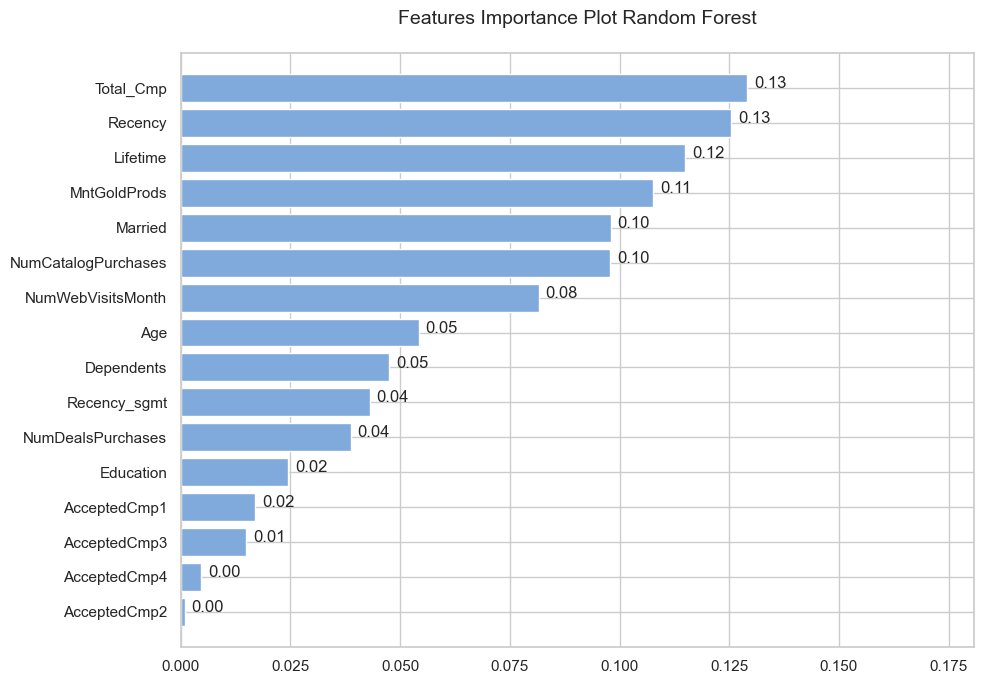

In [253]:
feature_importance_plot(best_model, best_model_name)

**Observation**

Berikut adalah Top 10 variabel/feature yang paling berpengaruh terhadap target (`Response`)
- `Total_camp` (total campaign yang pernah diterima/response oleh customer), dengan feature importance score paling tinggi sekitar 0.16
- `Recency` (total hari terakhir customer berbelanja) dengan feature importance score sekitar 0.12
- `Lifetime` (total bulan customer berbelanja sejak pembelian pertama) dengan feature importance score >0.10
- `MntGoldProds` (total purchase Gold Products by customer) dengan feature importance score >0.10
- `NumCatalogPurchases` (pembelian produk melalui katalog) dengan feature importance score sekitar 0.09
- `AcceptedCmp3` (Respon atau No Respon untuk Campaign ke-3) dengan feature importance score sekitar >0.06
- `NumWebVisitMonth` (total pembelian produk melalui Web Visit bulan terakhir) dengan feature importance score >0.06
- `Age` (usia customer) dengan feature importance score sekitar >0.06
- `Recency_sgmt` (resency segmentation) dengan feature importance score >0.06
- `Married` (status kawin customer) dengan feature importance score sekitar 0.04

#### Shap Observation

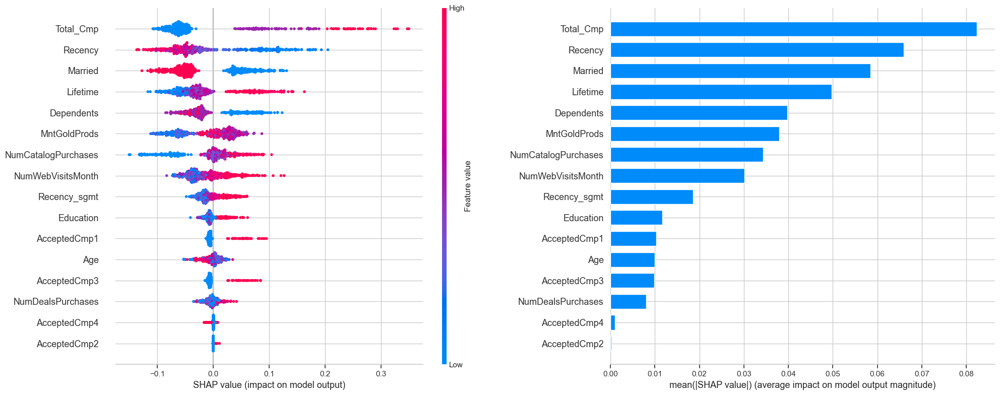

In [254]:
shap_plot(best_model, best_model_name, X_test)

**Observation**

Berdasarkan SHAP diatas, dapat ditemukan beberapa insight sebagai berikut:
- `Total_camp` (total campaign yang pernah diterima/response oleh customer), feature valuenya cenderung berwarna merah yang mengarah kekanan (positif) menunjukkan bahwa `semakin besar nilainya maka semakin besar pula  impact/pengaruh nilai untuk menerima campaign (response)`
- `Recency` (total hari terakhir customer berbelanja), feature valuenya cenderung berwarna biru yang mengarah kekanan (positif) menunjukkan bahwa `semakin kecil nilainya atau semakin sering customer bebrbelanja maka semakin besar pula impact/pengaruh nilai untuk menerima campaign (response)`
- `Lifetime` (total bulan customer berbelanja sejak pembelian pertama), feature valuenya cenderung berwarna merah yang mengarah kekanan (positif) menunjukkan bahwa `semakin besar nilainya atau semakin sering/banyak total bulan customer untuk berbelaja maka semakin besar pula  impact/pengaruh nilai untuk menerima campaign (response)`
- `Married` (customer yang berstatus belum/sudah menikah), feature valuenya cenderung berwarna biru yang mengarah kekanan (positif) menunjukkan bahwa `semakin kecil nilainya atau jika customer belum menikah maka semakin besar pula impact/pengaruh nilai untuk menerima campaign (response)`
- `NumCatalogPurchases` (pembelian produk melalui katalog), feature valuenya cenderung berwarna merah yang mengarah kekanan (positif) menunjukkan bahwa `semakin besar nilainya maka semakin besar pula  impact/pengaruh nilai untuk menerima campaign (response)`

**Observation**
Dari Force Plots diatas, menunjukkan bahwa index data testing yang pertama yang `tidak meresponse campaign` dengan informasi yang didapat berdasarkan data tersebut menunjukkan bahwa:
- Customer tidak pernah menerima campaign sebelumnya terbukti dari feature Total_Cmp = 0
- Customer sudah menikah terbukti dari feature Married = 1
- Customer tidak sering berbelanja terbukti dari feature Recency = 0.1717, Segment = 4

## **📌 Business Insight and Recommendation**

**📌Conclusion**

Berdasarkan modelling machine learning menggunakan metode `Random Forest` dengan `Precision Rate 0.933`, didapatkan Top 3 feature yang paling berpengaruh untuk memprediksi model terhadap target/label `Response` diantaranya adalah:
- `Total_camp` (total campaign yang pernah diterima/response oleh customer)
- `Recency` (total hari terakhir customer berbelanja)
- `Lifetime` (total bulan customer berbelanja sejak pembelian pertama) 

**📌Business Recommendation**

***Actions***
- Memberikan Discount untuk customer yang memilki history response rate <2 atau <3 dari total 5 campaign yang pernah dilakukan

***Area Improvements***
- Meningkatkan Response Rate dan Revenue serta mengurangi Cost biaya campaign dengan menentukan target market yang tepat dilihat dari key features yang sudah ditentukan seperti Total Campaign yang di terima oleh customer, Recency, Lifetime dan sebagainya.

**Reference**
- https://www.sciencedirect.com/science/article/pii/S2090447923001430
- https://www.sciencedirect.com/science/article/abs/pii/S1567422321000302
- https://www.sciencedirect.com/science/article/pii/S2667305323000601


# **====== STAGE 4 ======**
`Stage 4 (Final Preparation & Simulation)`